In [1]:
import tarfile
import pandas as pd
import numpy as np
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import load_iris
from sklearn.datasets import load_digits
from sklearn.cluster import OPTICS
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
import pylab
import sklearn
import random
import hdbscan

In [2]:
def get_dataset(data_name):

    if(data_name == 'iris'):
        data = load_iris()
        return data
    
    if(data_name == "credit fraud"):
        data = pd.read_csv('../../data/density_based_clustering_data.csv')
        return data
    
    if(data_name == "digits"):
        data = load_digits()
        return data



In [3]:
def get_tsne(X):
    X_embedded = TSNE(n_components = 2, learning_rate='auto', init='random').fit_transform(X)
    return X_embedded

In [36]:

def get_plot(X, Y, path, save = False):
    data_embedded_combined = pd.DataFrame(data=np.c_[X, Y], columns=['tsne-one-d', 'tsne-two-d'] + ['target'])
    sns.lmplot(data=data_embedded_combined, x='tsne-one-d', y='tsne-two-d', hue='target', fit_reg = False)
    if(save):
        plt.savefig(path)
    plt.show()
    # plt.xlim([-60,60])

In [5]:
def adjusted_rand_index(labels, clusters):
    return sklearn.metrics.adjusted_rand_score(labels, clusters)

def adjusted_mutual_information(labels, clusters):
    return sklearn.metrics.adjusted_mutual_info_score(labels, clusters)

def fowlkes_mallows_score(labels, clusters):
    return sklearn.metrics.fowlkes_mallows_score(labels, clusters)

def completeness_score(labels, clusters):
    return sklearn.metrics.completeness_score(labels, clusters)

def find_silhouette_score(X, clusters):
    return sklearn.metrics.silhouette_score(X, clusters)
    
def find_DB_Index(X, clusters):
    return sklearn.metrics.davies_bouldin_score(X, clusters)

def calinski_harabasz_index(X, clusters):
    return sklearn.metrics.calinski_harabasz_score(X, clusters)



def extrinsic_scores(labels, clusters):
    return {
        # 'fowlkes_mallows_score': fowlkes_mallows_score(labels, clusters),
        # 'completeness_score': completeness_score(labels, clusters),
        'adjusted_rand_index': adjusted_rand_index(labels, clusters),
        'mutual_information': adjusted_mutual_information(labels, clusters)
    }

def intrinsic_scores(X, clusters):
    return{
        'silhouette score': find_silhouette_score(X, clusters),
         'calinski_harabasz_index': calinski_harabasz_index(X, clusters),
         'DB index': find_DB_Index(X, clusters)
    }

In [6]:
def perform_random_clustering(n_clusters, X):
    clusters = []
    for i in range(X.shape[0]):
        cluster_i = random.randint(-1, n_clusters - 1)
        clusters.append(cluster_i)
    return clusters

CREDIT FRAUD

In [7]:
credit_data = get_dataset('credit fraud')

In [8]:
credit_data

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,class
0,0.919012,0.787855,0.809517,0.429154,0.762201,0.248677,0.249897,0.800314,0.367355,0.451365,...,0.569817,0.508396,0.658525,0.425381,0.580406,0.454498,0.421331,0.310216,0.000000,1.0
1,0.906588,0.733944,0.856275,0.353384,0.774870,0.252314,0.267339,0.784658,0.453446,0.491372,...,0.572146,0.530346,0.685868,0.342644,0.593612,0.401704,0.411845,0.313850,0.020591,1.0
2,0.919163,0.785821,0.831180,0.355228,0.760185,0.262258,0.268781,0.781104,0.454573,0.477162,...,0.556737,0.466535,0.667999,0.370466,0.569143,0.336811,0.417241,0.310018,0.009339,1.0
3,0.883578,0.781591,0.792483,0.370723,0.758122,0.245862,0.244056,0.782717,0.454245,0.409378,...,0.570726,0.518287,0.658956,0.375025,0.592075,0.318049,0.401244,0.330364,0.002297,1.0
4,0.979262,0.799121,0.762821,0.461731,0.790114,0.249369,0.275794,0.780061,0.418588,0.458085,...,0.555369,0.477181,0.655679,0.162235,0.661482,0.518034,0.416326,0.316103,0.000039,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1487,0.937089,0.770585,0.901684,0.282397,0.759839,0.273992,0.267169,0.778594,0.500753,0.561202,...,0.548196,0.512732,0.661240,0.467231,0.593820,0.392082,0.418312,0.299518,0.001168,0.0
1488,0.981639,0.748612,0.829904,0.153096,0.767945,0.302480,0.252867,0.796127,0.422017,0.535171,...,0.557402,0.488500,0.664975,0.516595,0.599478,0.394814,0.417781,0.313895,0.003206,0.0
1489,0.915865,0.782060,0.840617,0.140925,0.764964,0.253942,0.266027,0.746170,0.539660,0.522670,...,0.606248,0.479013,0.674265,0.426753,0.581510,0.407393,0.428918,0.315452,0.000311,0.0
1490,0.934978,0.776967,0.823951,0.291850,0.770721,0.253380,0.268554,0.786023,0.456954,0.522965,...,0.561106,0.534003,0.673255,0.323359,0.555987,0.367218,0.419970,0.317048,0.000105,0.0


In [9]:
X_credit_data = credit_data.drop(['class'], axis = 1)
Y_credit_data = credit_data['class']
X_credit_data

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount
0,0.919012,0.787855,0.809517,0.429154,0.762201,0.248677,0.249897,0.800314,0.367355,0.451365,...,0.581617,0.569817,0.508396,0.658525,0.425381,0.580406,0.454498,0.421331,0.310216,0.000000
1,0.906588,0.733944,0.856275,0.353384,0.774870,0.252314,0.267339,0.784658,0.453446,0.491372,...,0.602650,0.572146,0.530346,0.685868,0.342644,0.593612,0.401704,0.411845,0.313850,0.020591
2,0.919163,0.785821,0.831180,0.355228,0.760185,0.262258,0.268781,0.781104,0.454573,0.477162,...,0.575687,0.556737,0.466535,0.667999,0.370466,0.569143,0.336811,0.417241,0.310018,0.009339
3,0.883578,0.781591,0.792483,0.370723,0.758122,0.245862,0.244056,0.782717,0.454245,0.409378,...,0.578438,0.570726,0.518287,0.658956,0.375025,0.592075,0.318049,0.401244,0.330364,0.002297
4,0.979262,0.799121,0.762821,0.461731,0.790114,0.249369,0.275794,0.780061,0.418588,0.458085,...,0.580362,0.555369,0.477181,0.655679,0.162235,0.661482,0.518034,0.416326,0.316103,0.000039
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1487,0.937089,0.770585,0.901684,0.282397,0.759839,0.273992,0.267169,0.778594,0.500753,0.561202,...,0.586583,0.548196,0.512732,0.661240,0.467231,0.593820,0.392082,0.418312,0.299518,0.001168
1488,0.981639,0.748612,0.829904,0.153096,0.767945,0.302480,0.252867,0.796127,0.422017,0.535171,...,0.579539,0.557402,0.488500,0.664975,0.516595,0.599478,0.394814,0.417781,0.313895,0.003206
1489,0.915865,0.782060,0.840617,0.140925,0.764964,0.253942,0.266027,0.746170,0.539660,0.522670,...,0.575815,0.606248,0.479013,0.674265,0.426753,0.581510,0.407393,0.428918,0.315452,0.000311
1490,0.934978,0.776967,0.823951,0.291850,0.770721,0.253380,0.268554,0.786023,0.456954,0.522965,...,0.576153,0.561106,0.534003,0.673255,0.323359,0.555987,0.367218,0.419970,0.317048,0.000105


In [10]:
np.unique(Y_credit_data, return_counts = True)

(array([0., 1.]), array([1000,  492], dtype=int64))

In [11]:
X_credit_data_embedded = get_tsne(X_credit_data)

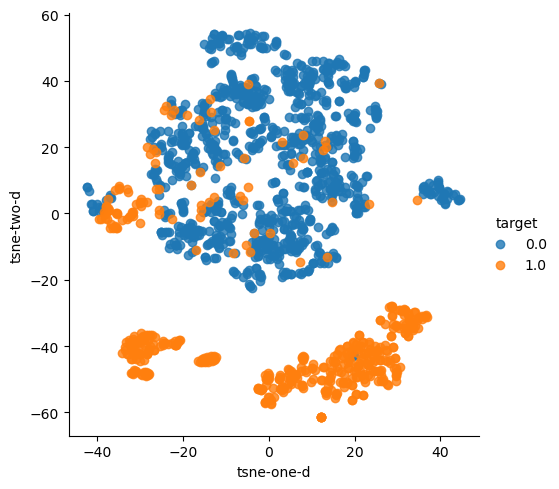

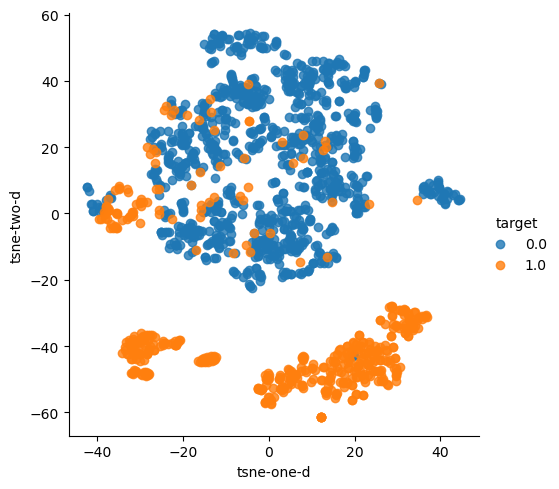

In [38]:
get_plot(X_credit_data_embedded, Y_credit_data, save = True, path = "../../visualizations/Q2/tsne_before_clustering.png")

Min samples: 2, Min cluster size: 10


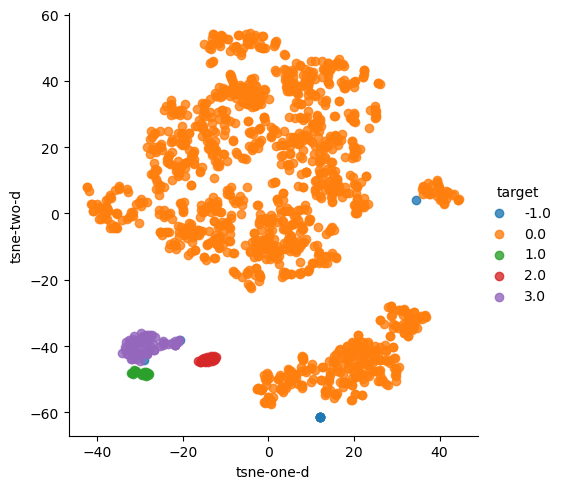

Estimated number of clusters:  5
Intrinsic Measures:  {'silhouette score': 0.548791007367955, 'calinski_harabasz_index': 327.5741884186992, 'DB index': 1.0860118622017925}
Extrensic Measures:  {'adjusted_rand_index': 0.1677016149173587, 'mutual_information': 0.1825903498914772}
------------------------------------------------------------------
Min samples: 2, Min cluster size: 20


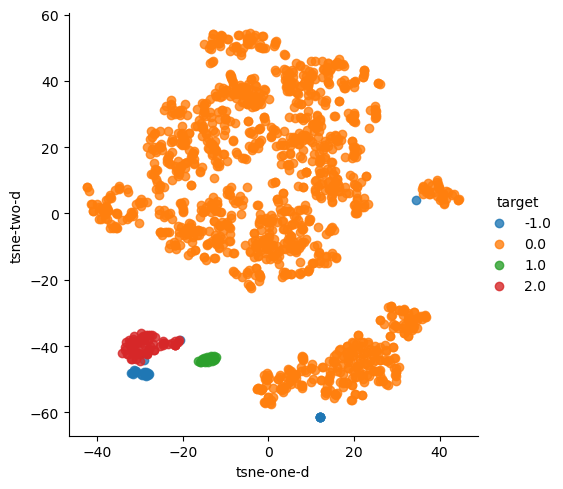

Estimated number of clusters:  4
Intrinsic Measures:  {'silhouette score': 0.5496108138851367, 'calinski_harabasz_index': 408.4667545050932, 'DB index': 1.4756342745650164}
Extrensic Measures:  {'adjusted_rand_index': 0.1679725276587848, 'mutual_information': 0.18531917179058002}
------------------------------------------------------------------
Min samples: 2, Min cluster size: 30


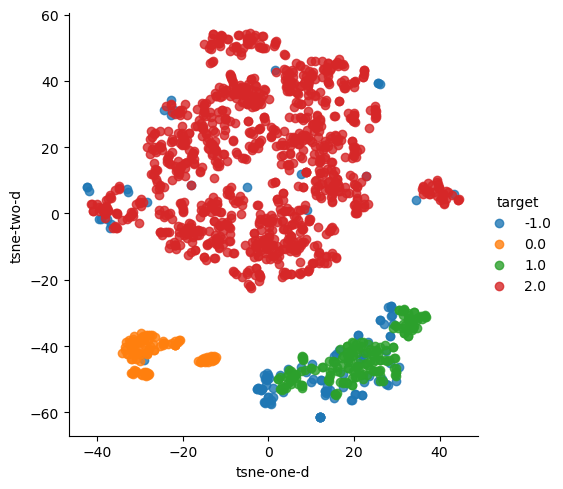

Estimated number of clusters:  4
Intrinsic Measures:  {'silhouette score': 0.39734445231030135, 'calinski_harabasz_index': 787.4612450900406, 'DB index': 4.615017790847279}
Extrensic Measures:  {'adjusted_rand_index': 0.6631681381043879, 'mutual_information': 0.5266044581947472}
------------------------------------------------------------------
Min samples: 3, Min cluster size: 10


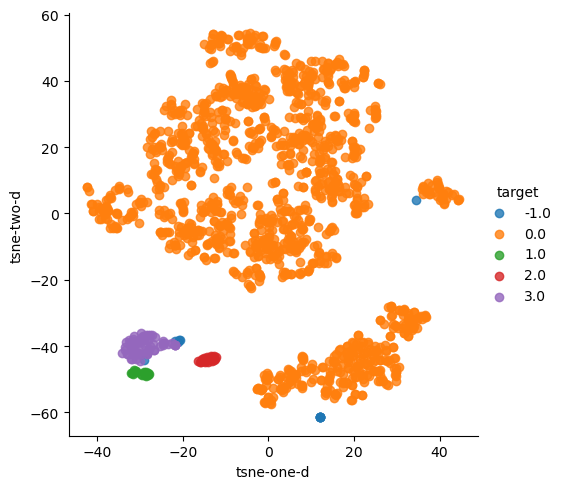

Estimated number of clusters:  5
Intrinsic Measures:  {'silhouette score': 0.5516895190624469, 'calinski_harabasz_index': 326.4196798130446, 'DB index': 1.3073842285647845}
Extrensic Measures:  {'adjusted_rand_index': 0.16740947510462428, 'mutual_information': 0.1819269144405185}
------------------------------------------------------------------
Min samples: 3, Min cluster size: 20


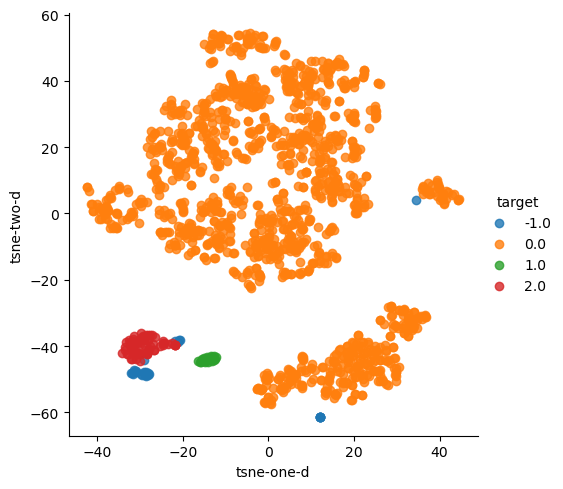

Estimated number of clusters:  4
Intrinsic Measures:  {'silhouette score': 0.5494585732838594, 'calinski_harabasz_index': 407.99431447122674, 'DB index': 1.5784205616774079}
Extrensic Measures:  {'adjusted_rand_index': 0.16777066932796578, 'mutual_information': 0.18498934979994805}
------------------------------------------------------------------
Min samples: 3, Min cluster size: 30


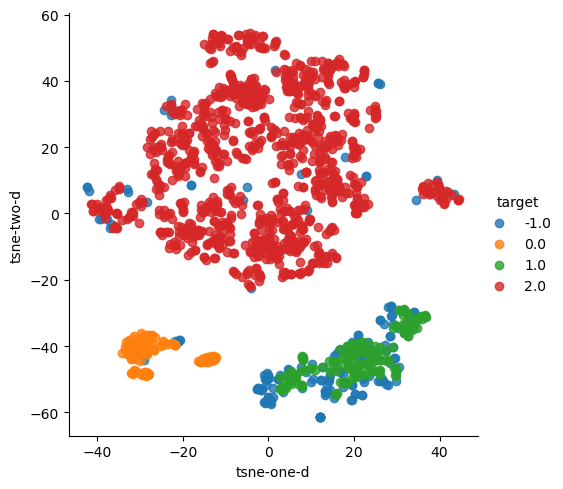

Estimated number of clusters:  4
Intrinsic Measures:  {'silhouette score': 0.3879663147688094, 'calinski_harabasz_index': 747.7145738236326, 'DB index': 5.033158818352365}
Extrensic Measures:  {'adjusted_rand_index': 0.6566632735535445, 'mutual_information': 0.516289335677904}
------------------------------------------------------------------
Min samples: 4, Min cluster size: 10


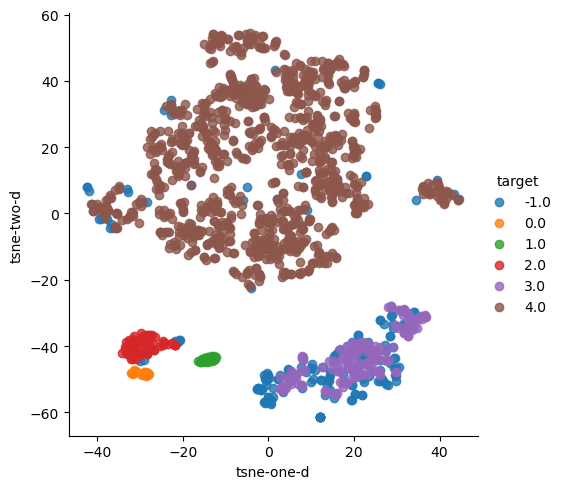

Estimated number of clusters:  6
Intrinsic Measures:  {'silhouette score': 0.3890650518034929, 'calinski_harabasz_index': 501.7392719265939, 'DB index': 3.73030372743294}
Extrensic Measures:  {'adjusted_rand_index': 0.6481129349213939, 'mutual_information': 0.4910781951416896}
------------------------------------------------------------------
Min samples: 4, Min cluster size: 20


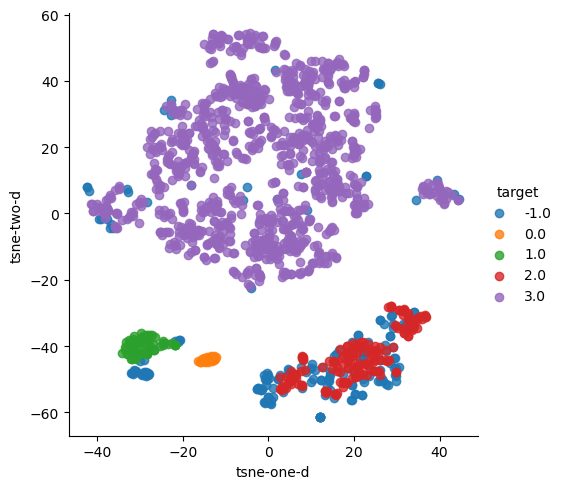

Estimated number of clusters:  5
Intrinsic Measures:  {'silhouette score': 0.3809350265614678, 'calinski_harabasz_index': 524.9032213875832, 'DB index': 3.366806917915509}
Extrensic Measures:  {'adjusted_rand_index': 0.6517638333487743, 'mutual_information': 0.5014548270685295}
------------------------------------------------------------------
Min samples: 4, Min cluster size: 30


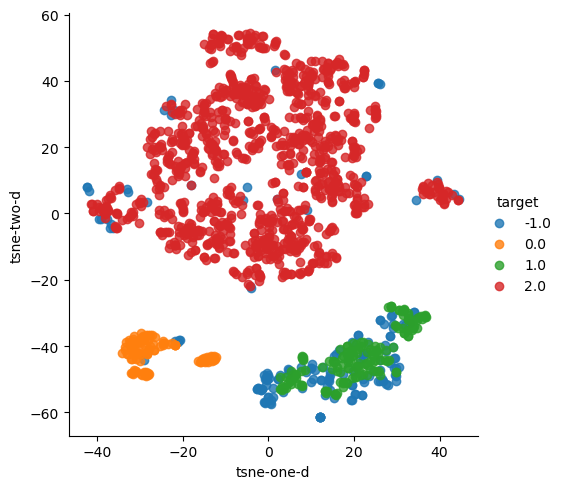

Estimated number of clusters:  4
Intrinsic Measures:  {'silhouette score': 0.3920466951823695, 'calinski_harabasz_index': 745.3700926579381, 'DB index': 5.1275718667547325}
Extrensic Measures:  {'adjusted_rand_index': 0.6528602378441141, 'mutual_information': 0.5113864396354781}
------------------------------------------------------------------
Min samples: 5, Min cluster size: 10


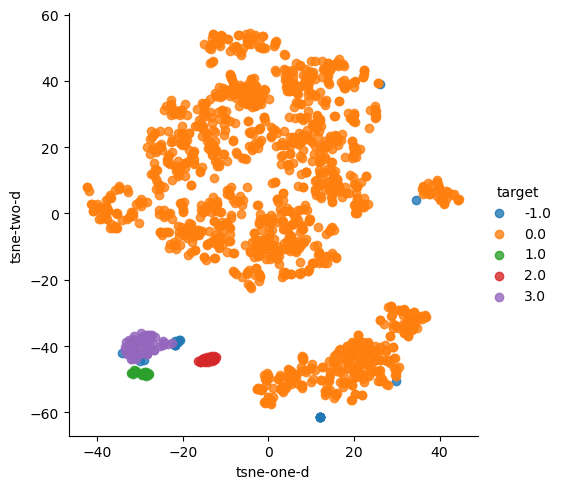

Estimated number of clusters:  5
Intrinsic Measures:  {'silhouette score': 0.5509623661000499, 'calinski_harabasz_index': 320.6284967569405, 'DB index': 1.4702609341449178}
Extrensic Measures:  {'adjusted_rand_index': 0.1674316179830586, 'mutual_information': 0.17671469361736508}
------------------------------------------------------------------
Min samples: 5, Min cluster size: 20


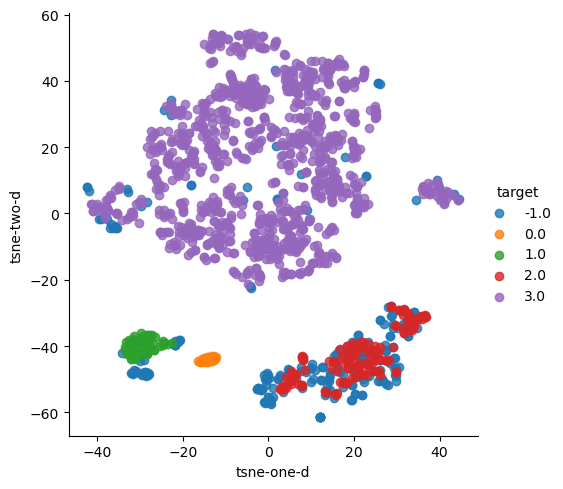

Estimated number of clusters:  5
Intrinsic Measures:  {'silhouette score': 0.36823117886530654, 'calinski_harabasz_index': 490.684469731143, 'DB index': 3.588236793345824}
Extrensic Measures:  {'adjusted_rand_index': 0.655108374755254, 'mutual_information': 0.500941464157697}
------------------------------------------------------------------
Min samples: 5, Min cluster size: 30


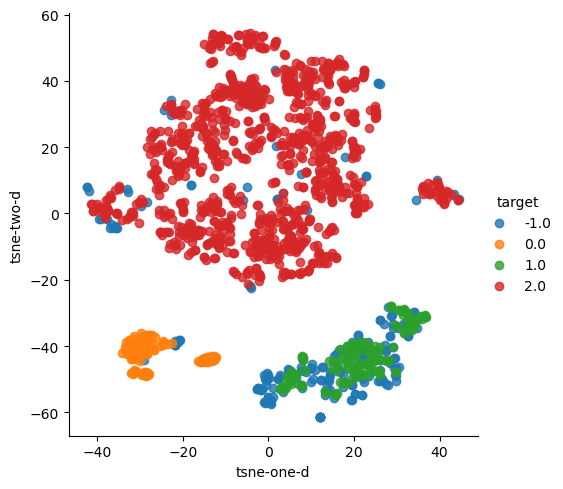

Estimated number of clusters:  4
Intrinsic Measures:  {'silhouette score': 0.3799638776750195, 'calinski_harabasz_index': 704.6588038590676, 'DB index': 5.283591206720166}
Extrensic Measures:  {'adjusted_rand_index': 0.6550096998164158, 'mutual_information': 0.5095963588100617}
------------------------------------------------------------------
Min samples: 6, Min cluster size: 10


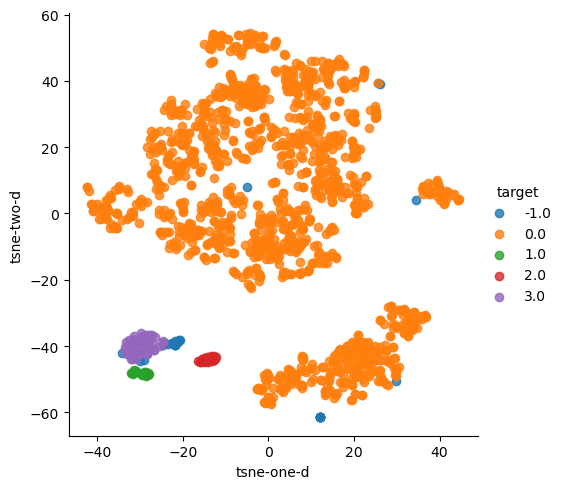

Estimated number of clusters:  5
Intrinsic Measures:  {'silhouette score': 0.5497607605910272, 'calinski_harabasz_index': 314.92114776482873, 'DB index': 1.4670318947860075}
Extrensic Measures:  {'adjusted_rand_index': 0.16768262055492153, 'mutual_information': 0.17339148129466425}
------------------------------------------------------------------
Min samples: 6, Min cluster size: 20


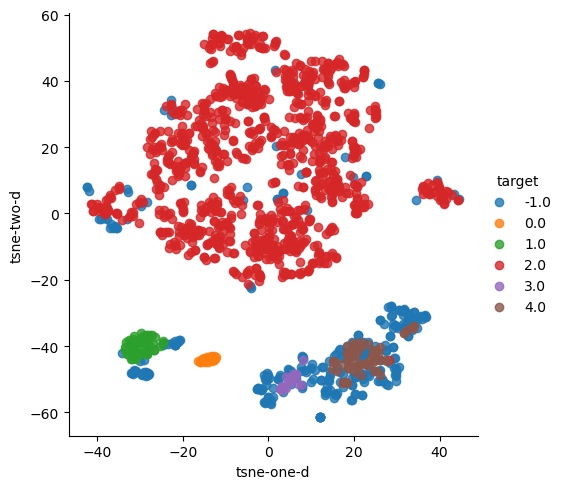

Estimated number of clusters:  6
Intrinsic Measures:  {'silhouette score': 0.2591288467199019, 'calinski_harabasz_index': 390.40395407140335, 'DB index': 2.0163303631334952}
Extrensic Measures:  {'adjusted_rand_index': 0.6624153044955503, 'mutual_information': 0.49554145320005993}
------------------------------------------------------------------
Min samples: 6, Min cluster size: 30


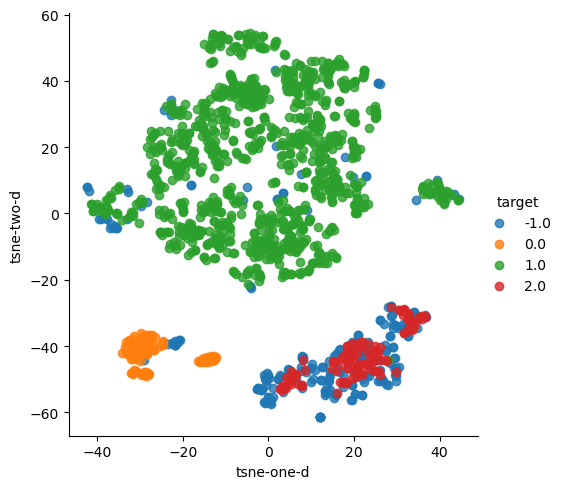

Estimated number of clusters:  4
Intrinsic Measures:  {'silhouette score': 0.3642535745236074, 'calinski_harabasz_index': 676.6315640077771, 'DB index': 5.216428441074149}
Extrensic Measures:  {'adjusted_rand_index': 0.6549002757573356, 'mutual_information': 0.5070122316029352}
------------------------------------------------------------------
Min samples: 7, Min cluster size: 10


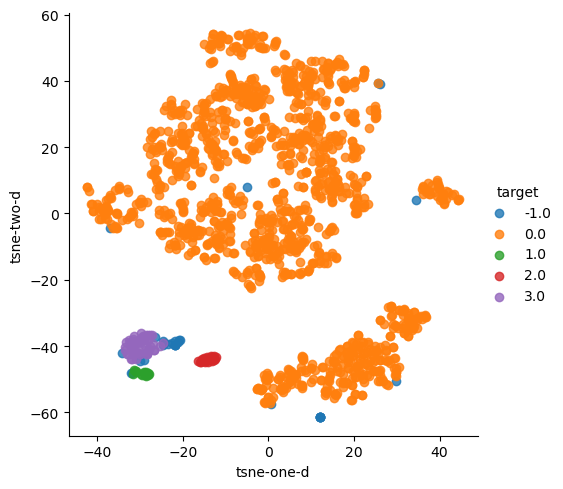

Estimated number of clusters:  5
Intrinsic Measures:  {'silhouette score': 0.5476930763512984, 'calinski_harabasz_index': 307.59914941979525, 'DB index': 1.5562639540784544}
Extrensic Measures:  {'adjusted_rand_index': 0.1706502704292951, 'mutual_information': 0.17536535044200482}
------------------------------------------------------------------
Min samples: 7, Min cluster size: 20


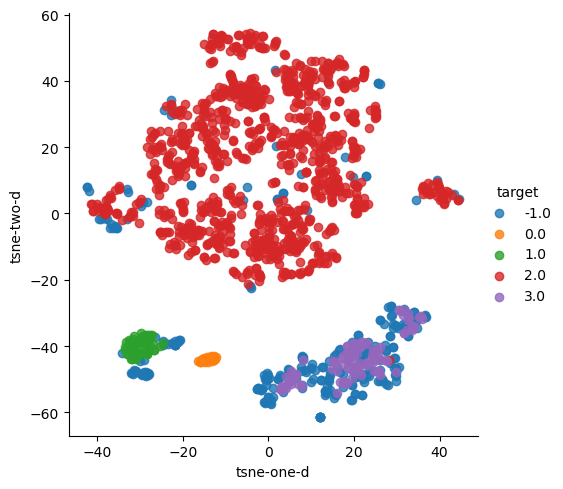

Estimated number of clusters:  5
Intrinsic Measures:  {'silhouette score': 0.33833512476547944, 'calinski_harabasz_index': 461.1610380637346, 'DB index': 3.020033424892163}
Extrensic Measures:  {'adjusted_rand_index': 0.6616096114989525, 'mutual_information': 0.5036204320573466}
------------------------------------------------------------------
Min samples: 7, Min cluster size: 30


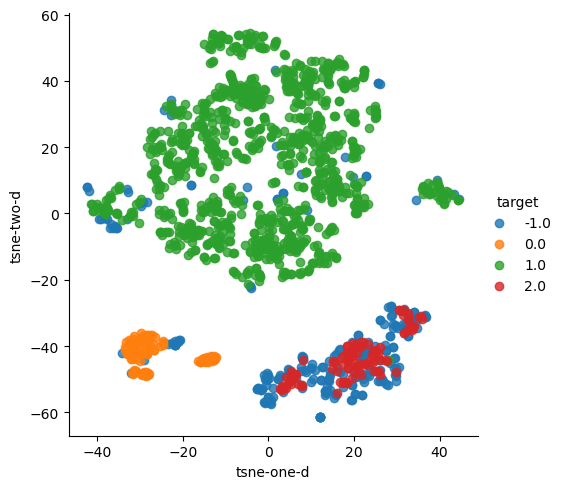

Estimated number of clusters:  4
Intrinsic Measures:  {'silhouette score': 0.3499954807556308, 'calinski_harabasz_index': 660.7853014380476, 'DB index': 4.8011525831405475}
Extrensic Measures:  {'adjusted_rand_index': 0.6593393847375719, 'mutual_information': 0.5103344384516252}
------------------------------------------------------------------
Min samples: 8, Min cluster size: 10


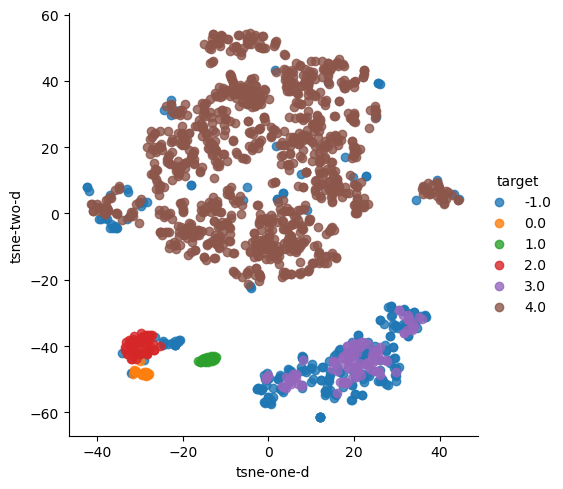

Estimated number of clusters:  6
Intrinsic Measures:  {'silhouette score': 0.34670072816104436, 'calinski_harabasz_index': 425.2285458040462, 'DB index': 3.353075624616382}
Extrensic Measures:  {'adjusted_rand_index': 0.6540996154686113, 'mutual_information': 0.48959646029094683}
------------------------------------------------------------------
Min samples: 8, Min cluster size: 20


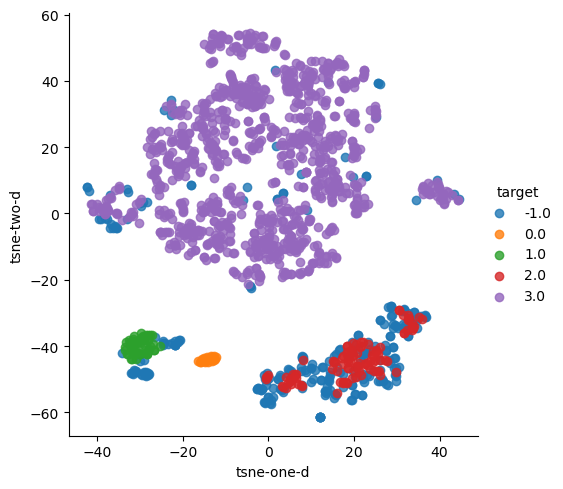

Estimated number of clusters:  5
Intrinsic Measures:  {'silhouette score': 0.3380240542159149, 'calinski_harabasz_index': 453.58824130652187, 'DB index': 3.0685770614868737}
Extrensic Measures:  {'adjusted_rand_index': 0.6594821224760237, 'mutual_information': 0.5010214158794551}
------------------------------------------------------------------
Min samples: 8, Min cluster size: 30


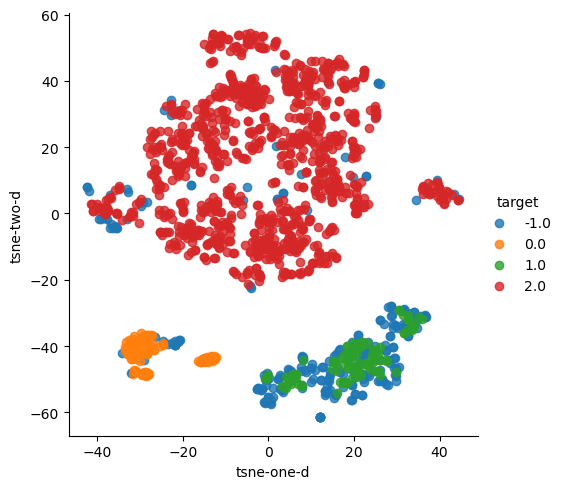

Estimated number of clusters:  4
Intrinsic Measures:  {'silhouette score': 0.34800440554384504, 'calinski_harabasz_index': 638.7770670241316, 'DB index': 4.72605243756201}
Extrensic Measures:  {'adjusted_rand_index': 0.6575992128616909, 'mutual_information': 0.507931016937302}
------------------------------------------------------------------
Min samples: 9, Min cluster size: 10


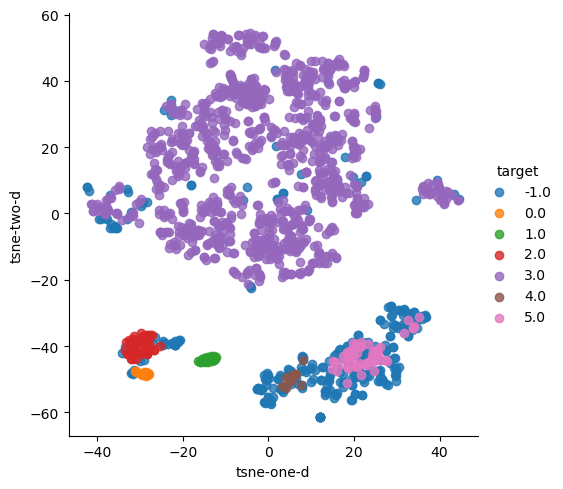

Estimated number of clusters:  7
Intrinsic Measures:  {'silhouette score': 0.2515638462560177, 'calinski_harabasz_index': 340.4897502723165, 'DB index': 2.0271924907455423}
Extrensic Measures:  {'adjusted_rand_index': 0.6616275045485088, 'mutual_information': 0.48857084477726065}
------------------------------------------------------------------
Min samples: 9, Min cluster size: 20


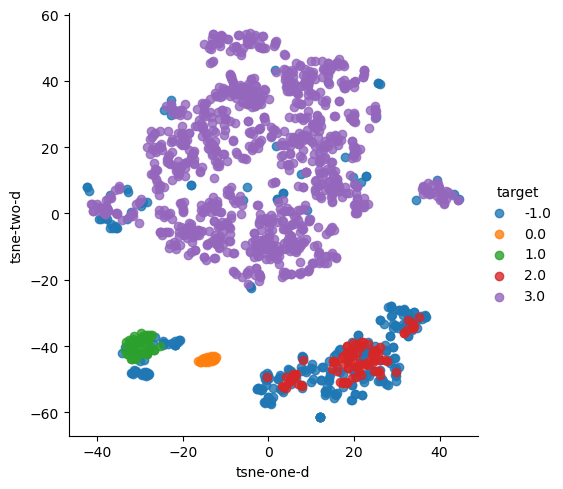

Estimated number of clusters:  5
Intrinsic Measures:  {'silhouette score': 0.31397611697802635, 'calinski_harabasz_index': 441.0554657895769, 'DB index': 2.649538332195052}
Extrensic Measures:  {'adjusted_rand_index': 0.6617915887302392, 'mutual_information': 0.5015569558954739}
------------------------------------------------------------------
Min samples: 9, Min cluster size: 30


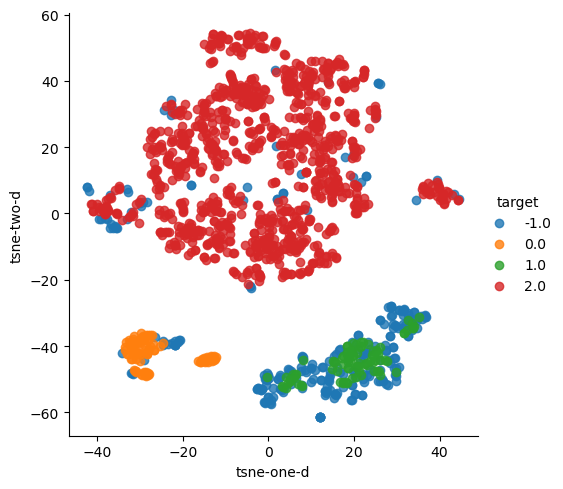

Estimated number of clusters:  4
Intrinsic Measures:  {'silhouette score': 0.32458115361594303, 'calinski_harabasz_index': 623.2536370979251, 'DB index': 3.888721396095415}
Extrensic Measures:  {'adjusted_rand_index': 0.6592137438690975, 'mutual_information': 0.5079159174496729}
------------------------------------------------------------------
Min samples: 10, Min cluster size: 10


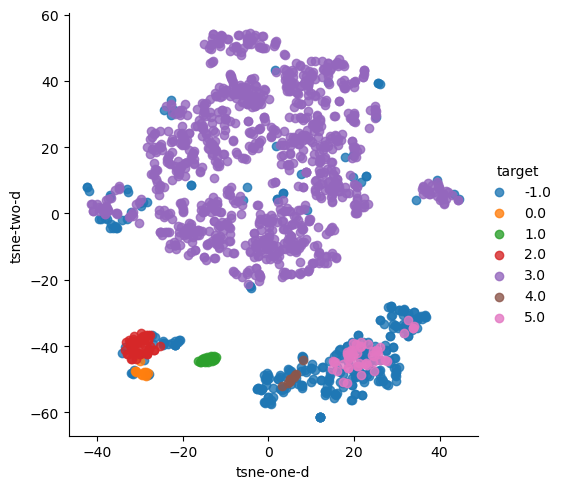

Estimated number of clusters:  7
Intrinsic Measures:  {'silhouette score': 0.24075416299994318, 'calinski_harabasz_index': 330.4318472472601, 'DB index': 2.00777774504435}
Extrensic Measures:  {'adjusted_rand_index': 0.6654134146745336, 'mutual_information': 0.49278813882906636}
------------------------------------------------------------------
Min samples: 10, Min cluster size: 20


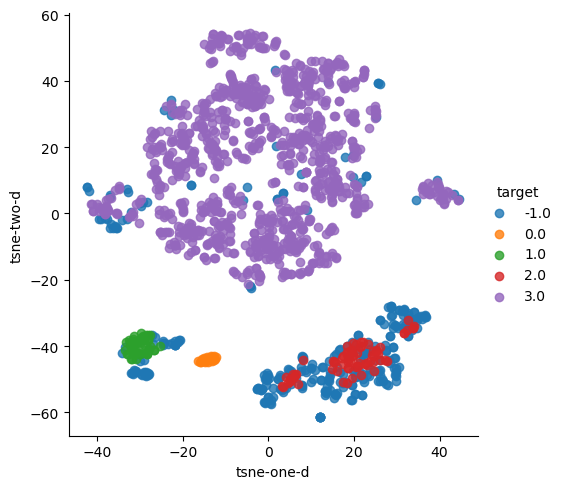

Estimated number of clusters:  5
Intrinsic Measures:  {'silhouette score': 0.29849968186777404, 'calinski_harabasz_index': 434.9378158830905, 'DB index': 2.514729605050674}
Extrensic Measures:  {'adjusted_rand_index': 0.6668427133402023, 'mutual_information': 0.5051310393972793}
------------------------------------------------------------------
Min samples: 10, Min cluster size: 30


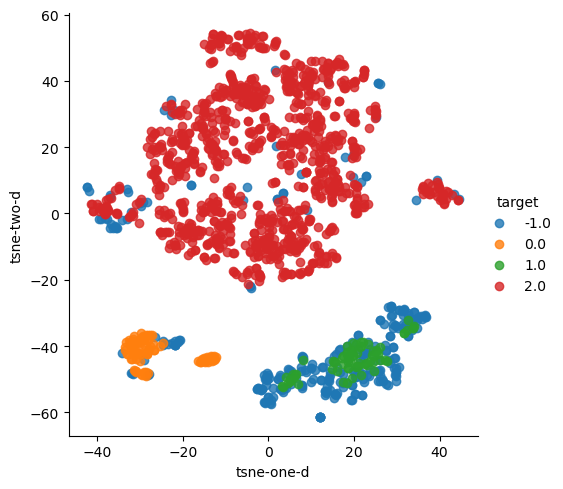

Estimated number of clusters:  4
Intrinsic Measures:  {'silhouette score': 0.308556991658219, 'calinski_harabasz_index': 611.3100765210082, 'DB index': 3.531562272323421}
Extrensic Measures:  {'adjusted_rand_index': 0.6638780568263958, 'mutual_information': 0.5112751162691105}
------------------------------------------------------------------
Min samples: 11, Min cluster size: 10


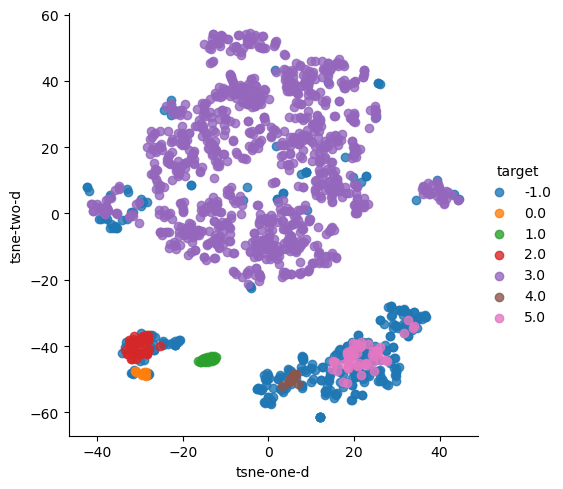

Estimated number of clusters:  7
Intrinsic Measures:  {'silhouette score': 0.23124646862503767, 'calinski_harabasz_index': 300.2618332380544, 'DB index': 1.9500932211072965}
Extrensic Measures:  {'adjusted_rand_index': 0.6641097693793985, 'mutual_information': 0.49073571201002214}
------------------------------------------------------------------
Min samples: 11, Min cluster size: 20


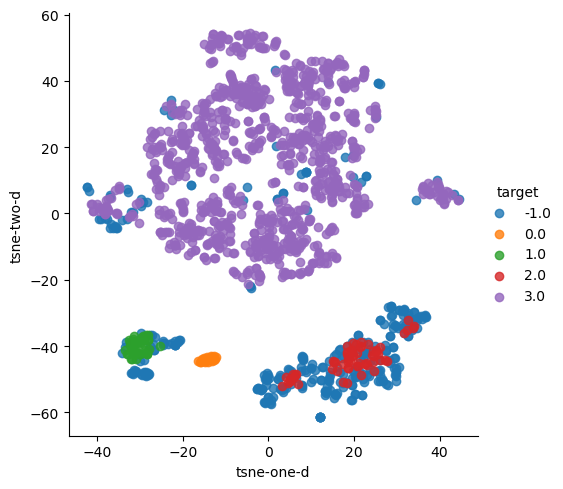

Estimated number of clusters:  5
Intrinsic Measures:  {'silhouette score': 0.28460685543604697, 'calinski_harabasz_index': 401.4332724561728, 'DB index': 2.4862611171670856}
Extrensic Measures:  {'adjusted_rand_index': 0.6683683853878563, 'mutual_information': 0.5050781170260156}
------------------------------------------------------------------
Min samples: 11, Min cluster size: 30


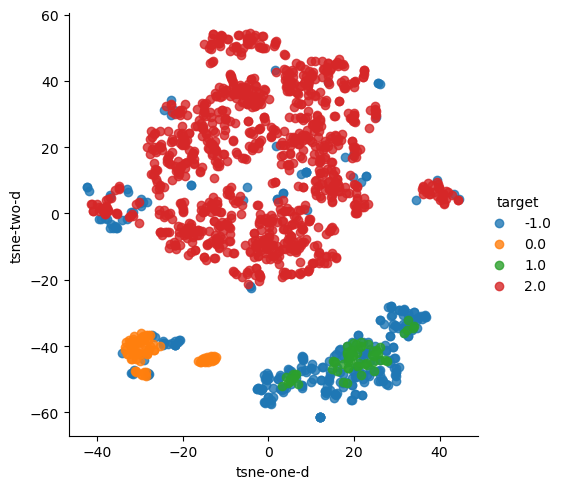

Estimated number of clusters:  4
Intrinsic Measures:  {'silhouette score': 0.29640843944855005, 'calinski_harabasz_index': 578.9825299419887, 'DB index': 3.435151438306831}
Extrensic Measures:  {'adjusted_rand_index': 0.6640447264691131, 'mutual_information': 0.5098580072671152}
------------------------------------------------------------------
Min samples: 12, Min cluster size: 10


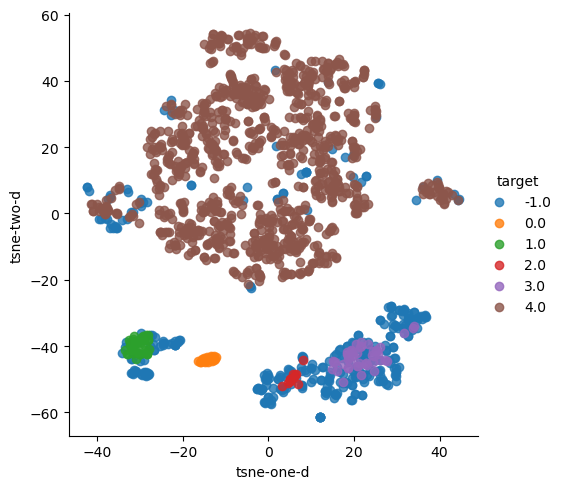

Estimated number of clusters:  6
Intrinsic Measures:  {'silhouette score': 0.216880868804411, 'calinski_harabasz_index': 313.8359167750234, 'DB index': 2.036281937650122}
Extrensic Measures:  {'adjusted_rand_index': 0.6667342505176442, 'mutual_information': 0.4971449582145261}
------------------------------------------------------------------
Min samples: 12, Min cluster size: 20


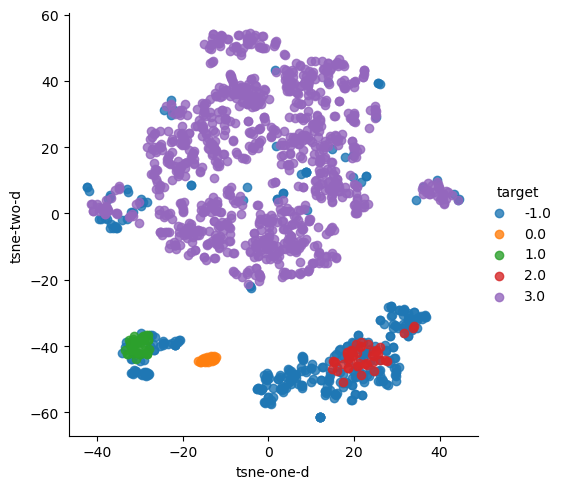

Estimated number of clusters:  5
Intrinsic Measures:  {'silhouette score': 0.22803854458228104, 'calinski_harabasz_index': 388.18522677817793, 'DB index': 1.9388437476819511}
Extrensic Measures:  {'adjusted_rand_index': 0.6722942747247843, 'mutual_information': 0.5078454355531712}
------------------------------------------------------------------
Min samples: 12, Min cluster size: 30


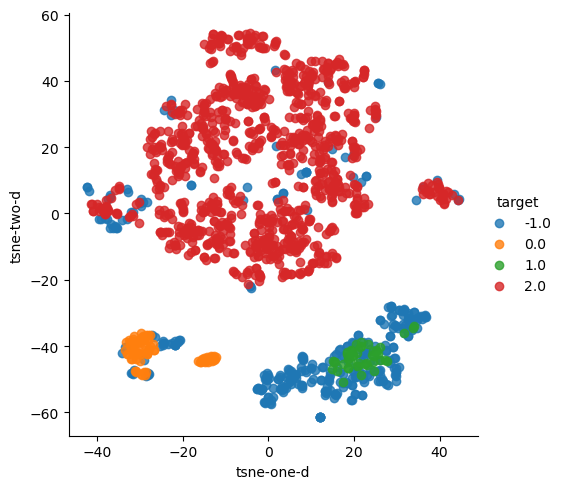

Estimated number of clusters:  4
Intrinsic Measures:  {'silhouette score': 0.24091917672793142, 'calinski_harabasz_index': 559.5236457899515, 'DB index': 2.584001245437815}
Extrensic Measures:  {'adjusted_rand_index': 0.6671350258782622, 'mutual_information': 0.51192693080403}
------------------------------------------------------------------
Min samples: 13, Min cluster size: 10


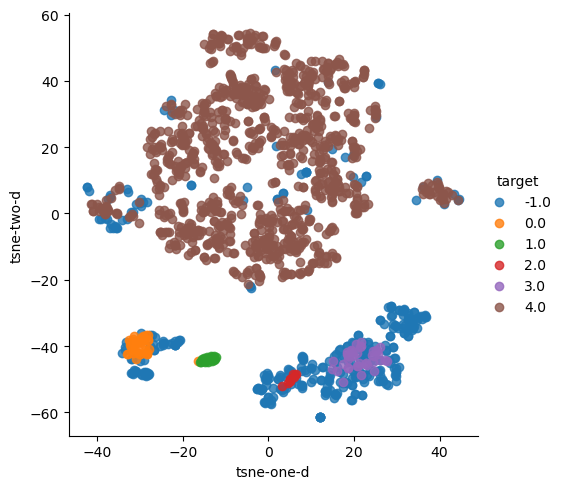

Estimated number of clusters:  6
Intrinsic Measures:  {'silhouette score': 0.1987525673192248, 'calinski_harabasz_index': 307.3257874474793, 'DB index': 1.9314359946154294}
Extrensic Measures:  {'adjusted_rand_index': 0.6709799766391158, 'mutual_information': 0.501674113169728}
------------------------------------------------------------------
Min samples: 13, Min cluster size: 20


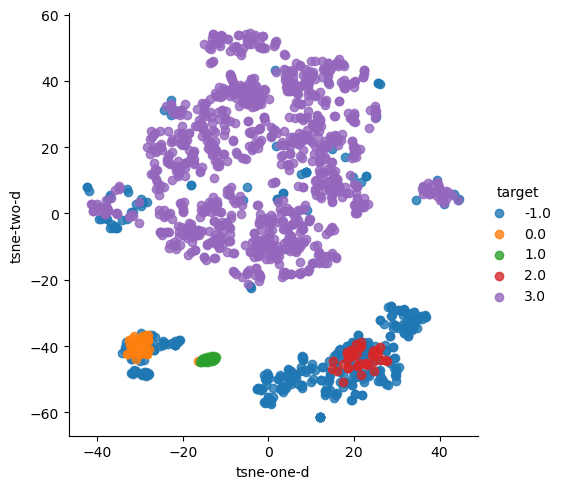

Estimated number of clusters:  5
Intrinsic Measures:  {'silhouette score': 0.20987545014730585, 'calinski_harabasz_index': 380.29654626386855, 'DB index': 1.8677360874036708}
Extrensic Measures:  {'adjusted_rand_index': 0.675790558171715, 'mutual_information': 0.5112727686187656}
------------------------------------------------------------------
Min samples: 13, Min cluster size: 30


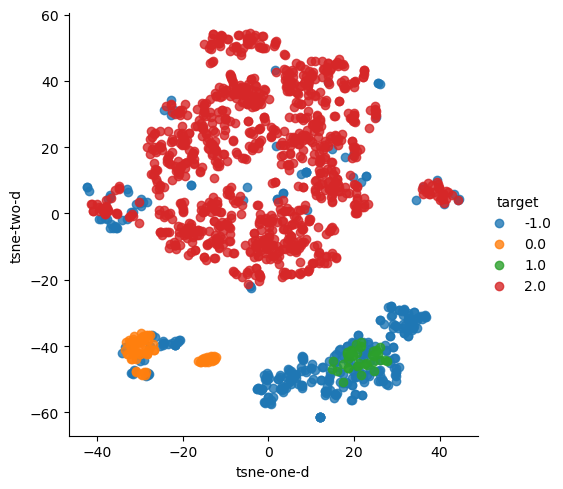

Estimated number of clusters:  4
Intrinsic Measures:  {'silhouette score': 0.2215429345673699, 'calinski_harabasz_index': 540.8319652872317, 'DB index': 2.40861494771788}
Extrensic Measures:  {'adjusted_rand_index': 0.6709286535812258, 'mutual_information': 0.5154407758367753}
------------------------------------------------------------------
Min samples: 14, Min cluster size: 10


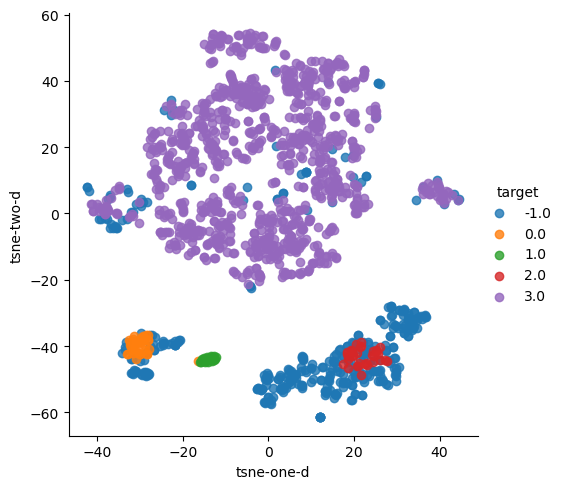

Estimated number of clusters:  5
Intrinsic Measures:  {'silhouette score': 0.1912667263738174, 'calinski_harabasz_index': 376.13343179574434, 'DB index': 1.763900039005442}
Extrensic Measures:  {'adjusted_rand_index': 0.6811063744449081, 'mutual_information': 0.5167234007612194}
------------------------------------------------------------------
Min samples: 14, Min cluster size: 20


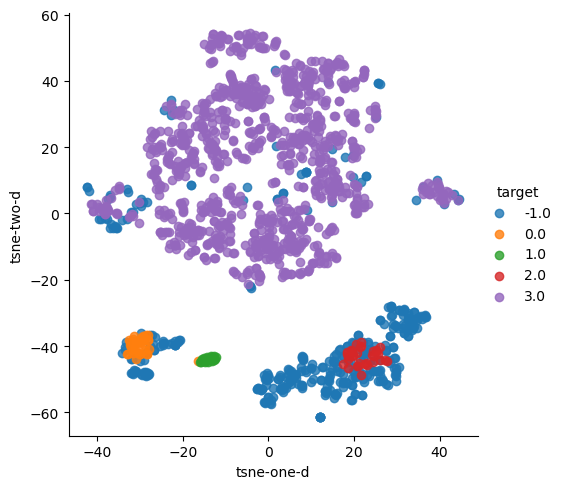

Estimated number of clusters:  5
Intrinsic Measures:  {'silhouette score': 0.1912667263738174, 'calinski_harabasz_index': 376.13343179574434, 'DB index': 1.763900039005442}
Extrensic Measures:  {'adjusted_rand_index': 0.6811063744449081, 'mutual_information': 0.5167234007612194}
------------------------------------------------------------------
Min samples: 14, Min cluster size: 30


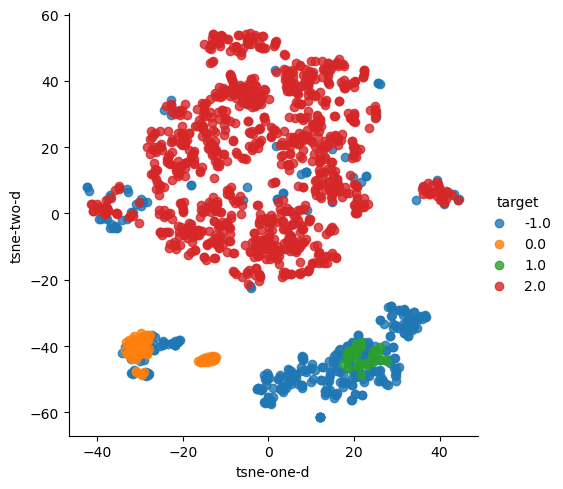

Estimated number of clusters:  4
Intrinsic Measures:  {'silhouette score': 0.19832953267500122, 'calinski_harabasz_index': 508.3204833048387, 'DB index': 2.164897226771494}
Extrensic Measures:  {'adjusted_rand_index': 0.6781128959407974, 'mutual_information': 0.5223274661133075}
------------------------------------------------------------------
Min samples: 15, Min cluster size: 10


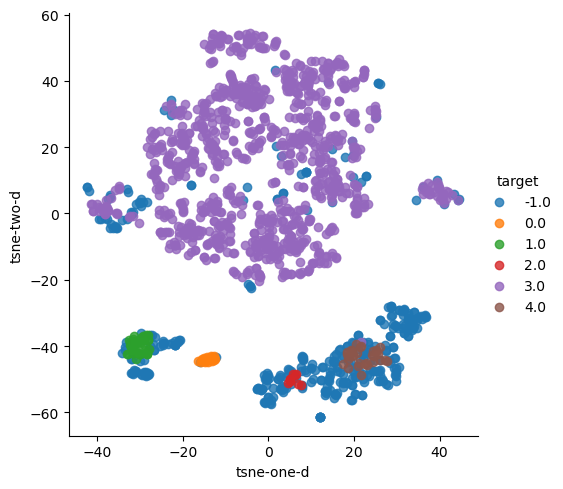

Estimated number of clusters:  6
Intrinsic Measures:  {'silhouette score': 0.17805684973587368, 'calinski_harabasz_index': 296.7554727161322, 'DB index': 1.9187160529118275}
Extrensic Measures:  {'adjusted_rand_index': 0.6734010374319062, 'mutual_information': 0.5041225465854308}
------------------------------------------------------------------
Min samples: 15, Min cluster size: 20


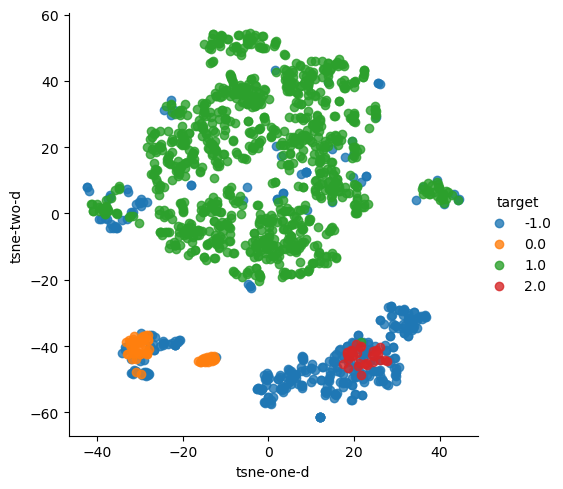

Estimated number of clusters:  4
Intrinsic Measures:  {'silhouette score': 0.19257631664853808, 'calinski_harabasz_index': 473.21754532773326, 'DB index': 2.161174761749133}
Extrensic Measures:  {'adjusted_rand_index': 0.6775955876426502, 'mutual_information': 0.5210724049543778}
------------------------------------------------------------------
Min samples: 15, Min cluster size: 30


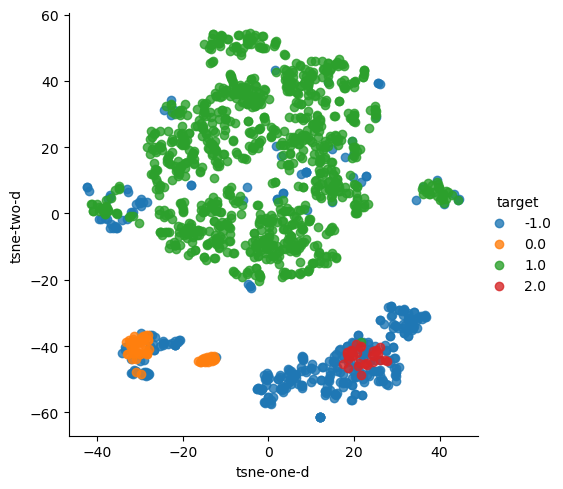

Estimated number of clusters:  4
Intrinsic Measures:  {'silhouette score': 0.19257631664853808, 'calinski_harabasz_index': 473.21754532773326, 'DB index': 2.161174761749133}
Extrensic Measures:  {'adjusted_rand_index': 0.6775955876426502, 'mutual_information': 0.5210724049543778}
------------------------------------------------------------------
Min samples: 16, Min cluster size: 10


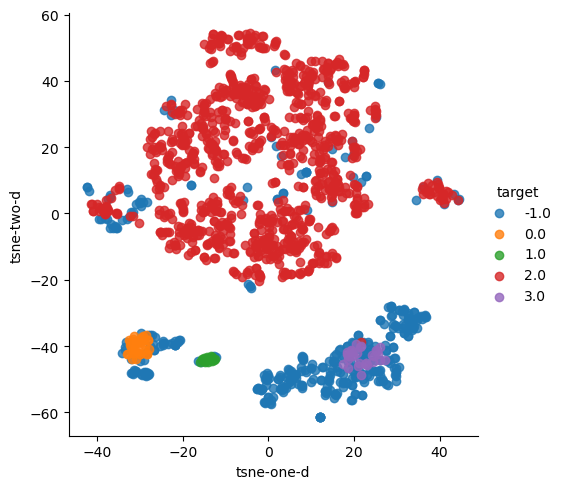

Estimated number of clusters:  5
Intrinsic Measures:  {'silhouette score': 0.18576938560419837, 'calinski_harabasz_index': 356.93180850779237, 'DB index': 1.8095312813186752}
Extrensic Measures:  {'adjusted_rand_index': 0.6786978912437437, 'mutual_information': 0.514493369589203}
------------------------------------------------------------------
Min samples: 16, Min cluster size: 20


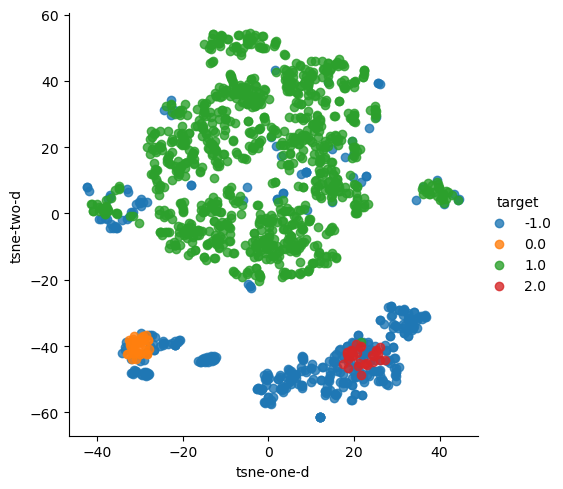

Estimated number of clusters:  4
Intrinsic Measures:  {'silhouette score': 0.18052942889353918, 'calinski_harabasz_index': 434.62993535012663, 'DB index': 1.9398874293265294}
Extrensic Measures:  {'adjusted_rand_index': 0.6875689510236245, 'mutual_information': 0.5300073237481713}
------------------------------------------------------------------
Min samples: 16, Min cluster size: 30


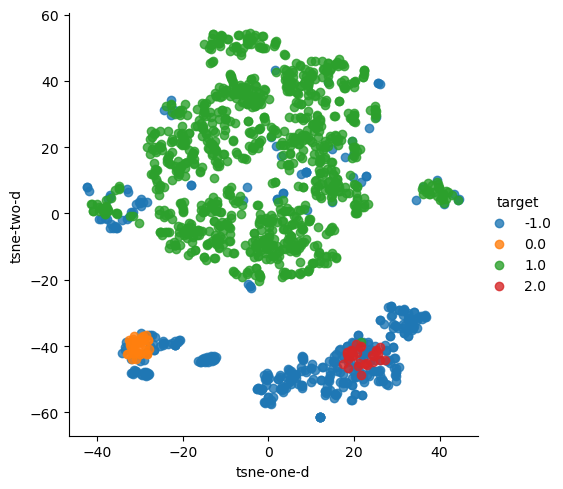

Estimated number of clusters:  4
Intrinsic Measures:  {'silhouette score': 0.18052942889353918, 'calinski_harabasz_index': 434.62993535012663, 'DB index': 1.9398874293265294}
Extrensic Measures:  {'adjusted_rand_index': 0.6875689510236245, 'mutual_information': 0.5300073237481713}
------------------------------------------------------------------
Min samples: 17, Min cluster size: 10


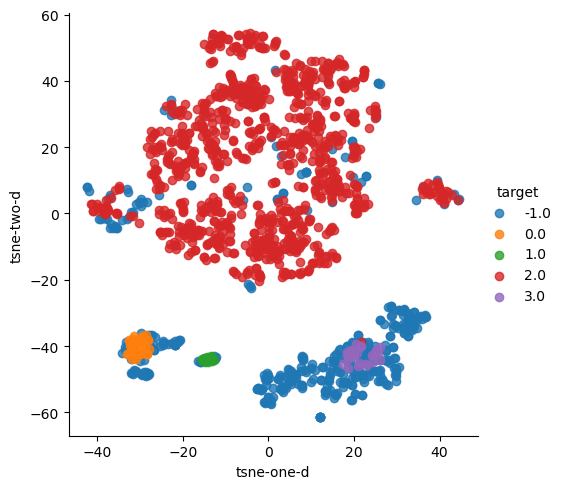

Estimated number of clusters:  5
Intrinsic Measures:  {'silhouette score': 0.1821124757667203, 'calinski_harabasz_index': 351.1345710404665, 'DB index': 1.791580653034993}
Extrensic Measures:  {'adjusted_rand_index': 0.6790092271626696, 'mutual_information': 0.515316382467843}
------------------------------------------------------------------
Min samples: 17, Min cluster size: 20


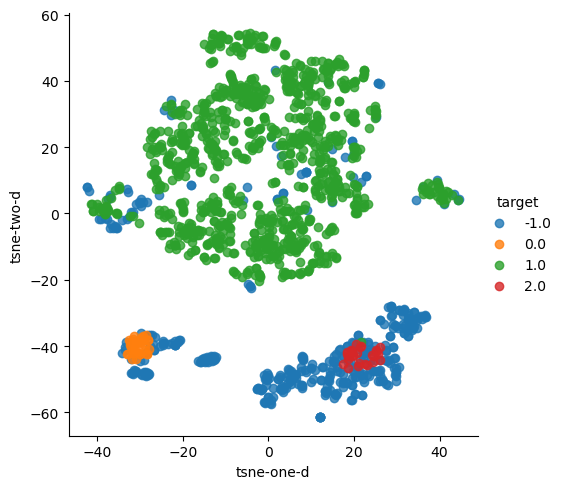

Estimated number of clusters:  4
Intrinsic Measures:  {'silhouette score': 0.17877517406012283, 'calinski_harabasz_index': 432.04527620189504, 'DB index': 1.9360853971809453}
Extrensic Measures:  {'adjusted_rand_index': 0.6869407339486405, 'mutual_information': 0.5295903702329878}
------------------------------------------------------------------
Min samples: 17, Min cluster size: 30


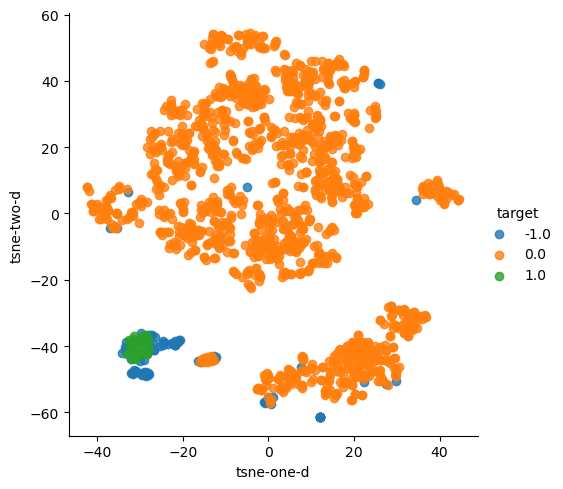

Estimated number of clusters:  3
Intrinsic Measures:  {'silhouette score': 0.5571868357361285, 'calinski_harabasz_index': 449.2405052841349, 'DB index': 1.5415797066438752}
Extrensic Measures:  {'adjusted_rand_index': 0.1672287651114977, 'mutual_information': 0.17787851366357638}
------------------------------------------------------------------
Min samples: 18, Min cluster size: 10


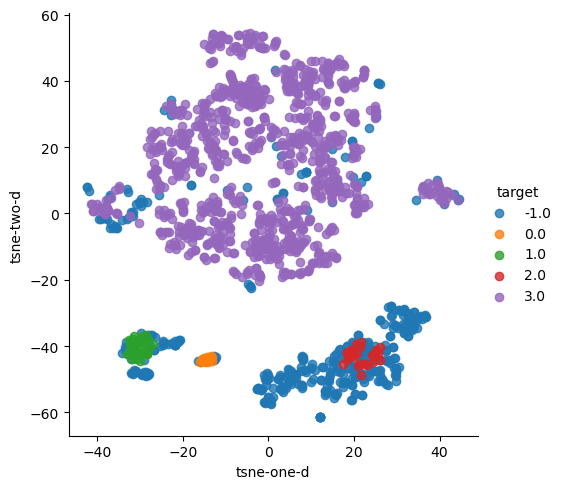

Estimated number of clusters:  5
Intrinsic Measures:  {'silhouette score': 0.17898191843667446, 'calinski_harabasz_index': 352.58531881399557, 'DB index': 1.817726335191976}
Extrensic Measures:  {'adjusted_rand_index': 0.6782555576765816, 'mutual_information': 0.5146101997576934}
------------------------------------------------------------------
Min samples: 18, Min cluster size: 20


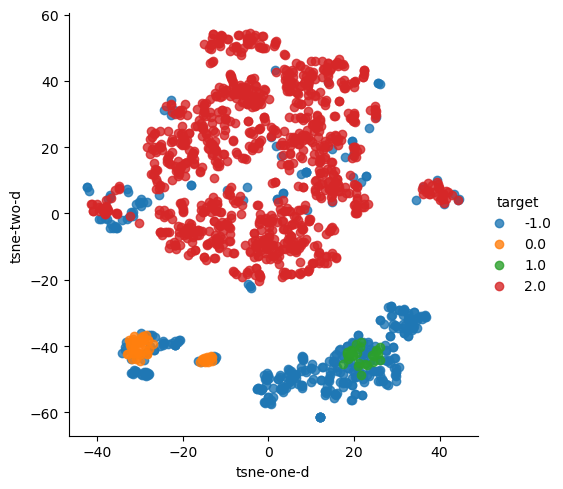

Estimated number of clusters:  4
Intrinsic Measures:  {'silhouette score': 0.18081558530121372, 'calinski_harabasz_index': 443.7186048254733, 'DB index': 2.1123439566899878}
Extrensic Measures:  {'adjusted_rand_index': 0.6792760801901219, 'mutual_information': 0.522476356643586}
------------------------------------------------------------------
Min samples: 18, Min cluster size: 30


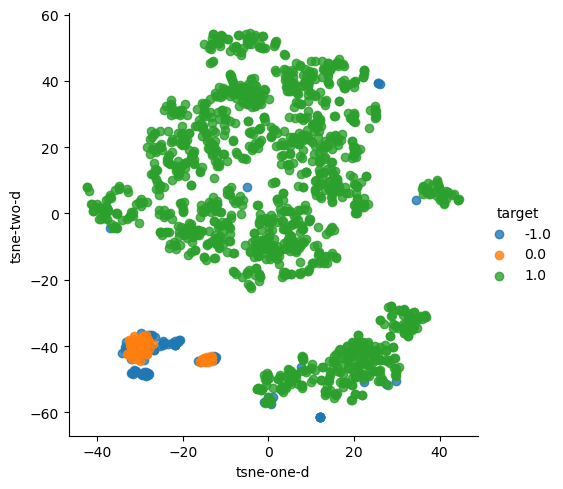

Estimated number of clusters:  3
Intrinsic Measures:  {'silhouette score': 0.5716475416673689, 'calinski_harabasz_index': 522.648148062692, 'DB index': 2.2223350313275563}
Extrensic Measures:  {'adjusted_rand_index': 0.18408797109489775, 'mutual_information': 0.19273080133717269}
------------------------------------------------------------------
Min samples: 19, Min cluster size: 10


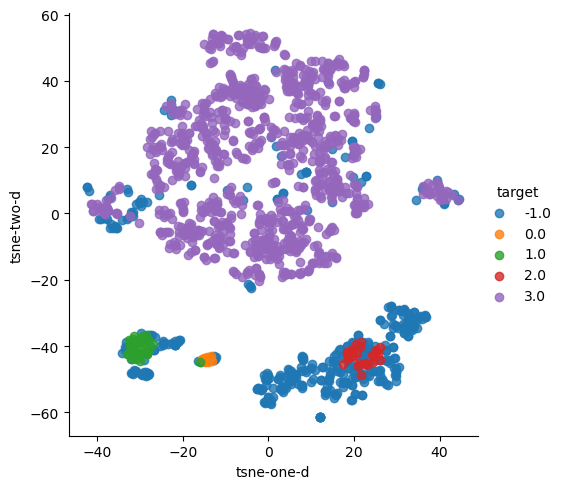

Estimated number of clusters:  5
Intrinsic Measures:  {'silhouette score': 0.17554163864273709, 'calinski_harabasz_index': 344.7546488436047, 'DB index': 1.8310290206921462}
Extrensic Measures:  {'adjusted_rand_index': 0.6767816177957954, 'mutual_information': 0.5136864961531136}
------------------------------------------------------------------
Min samples: 19, Min cluster size: 20


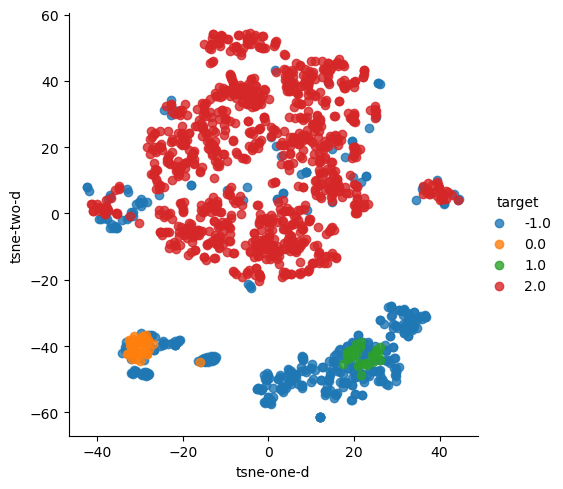

Estimated number of clusters:  4
Intrinsic Measures:  {'silhouette score': 0.17628212544335878, 'calinski_harabasz_index': 431.0181041167743, 'DB index': 2.0023731507155844}
Extrensic Measures:  {'adjusted_rand_index': 0.6830686676551687, 'mutual_information': 0.5256017319966753}
------------------------------------------------------------------
Min samples: 19, Min cluster size: 30


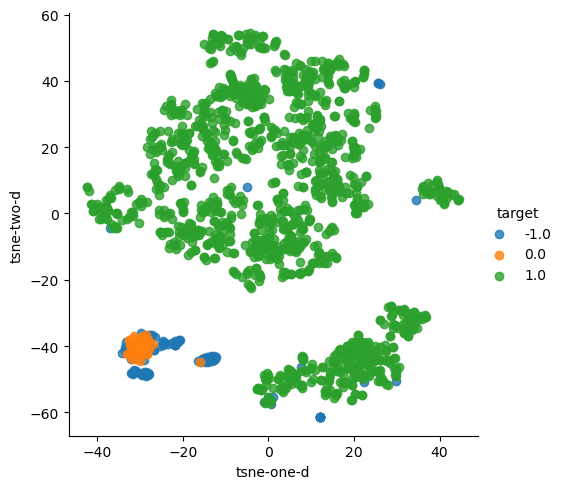

Estimated number of clusters:  3
Intrinsic Measures:  {'silhouette score': 0.5704183795783719, 'calinski_harabasz_index': 540.5892168402926, 'DB index': 1.5223384046016273}
Extrensic Measures:  {'adjusted_rand_index': 0.18316881770945356, 'mutual_information': 0.19182475966018725}
------------------------------------------------------------------
Min samples: 20, Min cluster size: 10


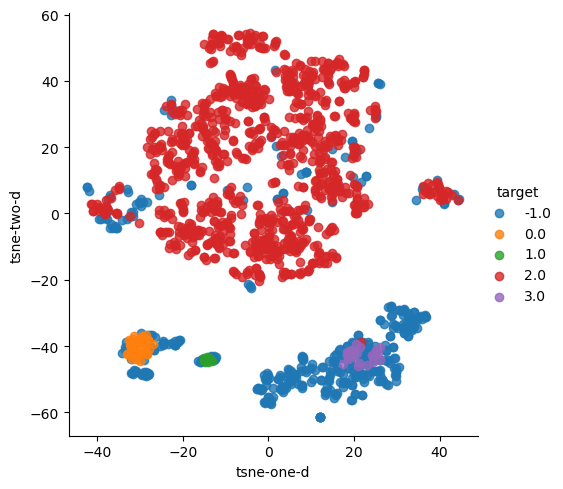

Estimated number of clusters:  5
Intrinsic Measures:  {'silhouette score': 0.17285541914837788, 'calinski_harabasz_index': 336.70427270786826, 'DB index': 1.8104056982416732}
Extrensic Measures:  {'adjusted_rand_index': 0.6737575159260728, 'mutual_information': 0.5115029104659784}
------------------------------------------------------------------
Min samples: 20, Min cluster size: 20


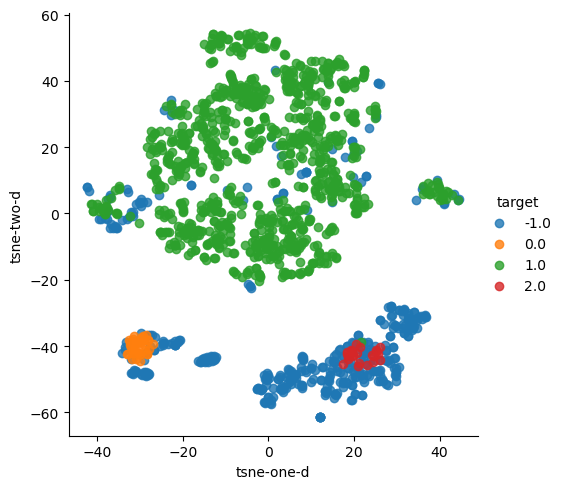

Estimated number of clusters:  4
Intrinsic Measures:  {'silhouette score': 0.1758022775560981, 'calinski_harabasz_index': 425.5728376608728, 'DB index': 1.9934901965765273}
Extrensic Measures:  {'adjusted_rand_index': 0.6790627300368935, 'mutual_information': 0.5219421306203658}
------------------------------------------------------------------
Min samples: 20, Min cluster size: 30


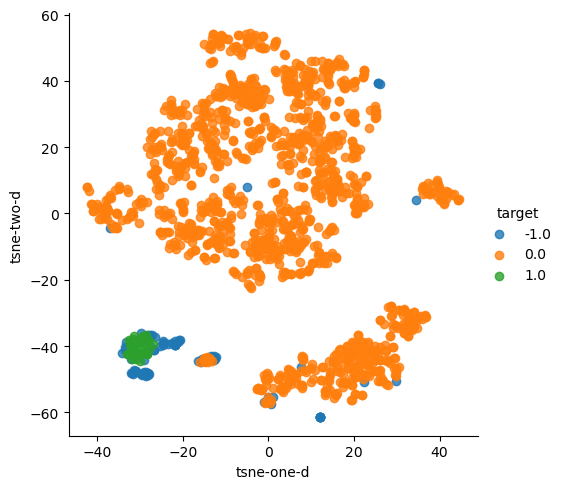

Estimated number of clusters:  3
Intrinsic Measures:  {'silhouette score': 0.5681715604926699, 'calinski_harabasz_index': 480.342068723671, 'DB index': 1.5689106523190766}
Extrensic Measures:  {'adjusted_rand_index': 0.16550301383373897, 'mutual_information': 0.17635571627201366}
------------------------------------------------------------------


In [13]:
silhouette_score_list = []
harabasz_list = []
DB_list = []
rand_index_list = []
mutual_information_list = []
min_samples = range(2,21)
min_cluster_size = [10,20,30]
for min_sampl in min_samples:
    for clust_size in min_cluster_size:
        clusterer = hdbscan.HDBSCAN(min_samples = min_sampl, min_cluster_size = clust_size)
        clusterer.fit(X_credit_data)
        cluster_labels_credit = clusterer.labels_
        # print(np.unique(cluster_labels_credit))

        print("Min samples: " + str(min_sampl) + ", Min cluster size: " + str(clust_size))
        if(len(np.unique(cluster_labels_credit)) == 1):
            print("Bad Case")
            continue
        get_plot(X_credit_data_embedded, cluster_labels_credit)
        intrin = intrinsic_scores(X_credit_data, cluster_labels_credit)
        extrin = extrinsic_scores(Y_credit_data, cluster_labels_credit)
        print("Estimated number of clusters: ", len(np.unique(cluster_labels_credit)))
        print("Intrinsic Measures: ", intrin)
        print("Extrensic Measures: ",extrin)
                
        silhouette_score_list.append(intrin['silhouette score'])
        harabasz_list.append(intrin['calinski_harabasz_index'])
        DB_list.append(intrin['DB index'])
        rand_index_list.append(extrin['adjusted_rand_index'])
        mutual_information_list.append(extrin['mutual_information'])
        print("------------------------------------------------------------------")

In [14]:
input_configs = []
for min_sampl in min_samples:
    for clust_size in min_cluster_size:

        input_configs.append(str(min_sampl) + "," + str(clust_size))

In [15]:
print(silhouette_score_list)
print(input_configs)

[0.548791007367955, 0.5496108138851367, 0.39734445231030135, 0.5516895190624469, 0.5494585732838594, 0.3879663147688094, 0.3890650518034929, 0.3809350265614678, 0.3920466951823695, 0.5509623661000499, 0.36823117886530654, 0.3799638776750195, 0.5497607605910272, 0.2591288467199019, 0.3642535745236074, 0.5476930763512984, 0.33833512476547944, 0.3499954807556308, 0.34670072816104436, 0.3380240542159149, 0.34800440554384504, 0.2515638462560177, 0.31397611697802635, 0.32458115361594303, 0.24075416299994318, 0.29849968186777404, 0.308556991658219, 0.23124646862503767, 0.28460685543604697, 0.29640843944855005, 0.216880868804411, 0.22803854458228104, 0.24091917672793142, 0.1987525673192248, 0.20987545014730585, 0.2215429345673699, 0.1912667263738174, 0.1912667263738174, 0.19832953267500122, 0.17805684973587368, 0.19257631664853808, 0.19257631664853808, 0.18576938560419837, 0.18052942889353918, 0.18052942889353918, 0.1821124757667203, 0.17877517406012283, 0.5571868357361285, 0.17898191843667446

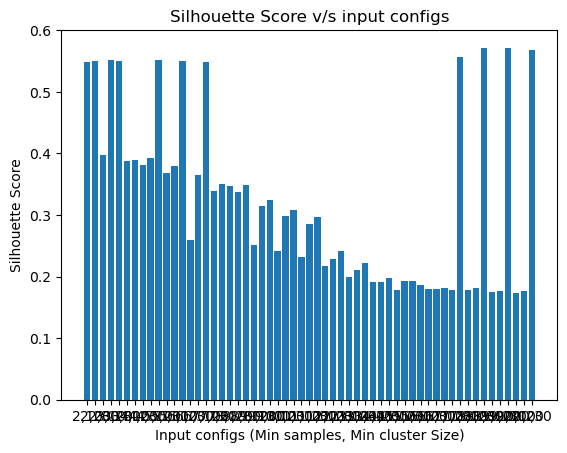

In [41]:
plt.bar(input_configs, silhouette_score_list)
plt.xlabel("Input configs (Min samples, Min cluster Size)")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Score v/s input configs")
plt.savefig("../../visualizations/Q2/Silhouette_Bar_Plot.png")
plt.show()

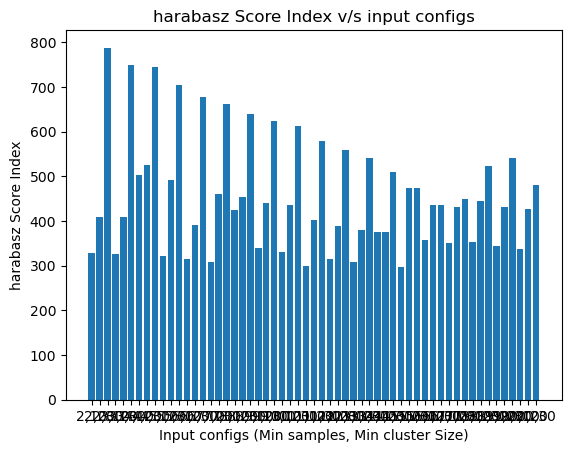

In [42]:
plt.bar(input_configs, harabasz_list)
plt.xlabel("Input configs (Min samples, Min cluster Size)")
plt.ylabel("harabasz Score Index")
plt.title("harabasz Score Index v/s input configs")
plt.savefig("../../visualizations/Q2/harabasz_score_index_bar.png")
plt.show()

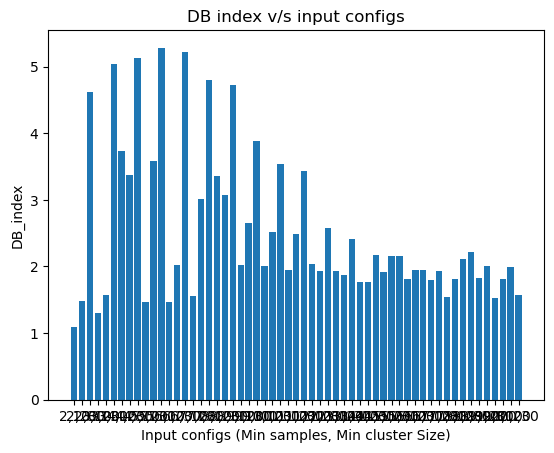

In [43]:
plt.bar(input_configs, DB_list)
plt.xlabel("Input configs (Min samples, Min cluster Size)")
plt.ylabel("DB_index")
plt.title("DB index v/s input configs")
plt.savefig("../../visualizations/Q2/DB_bar.png")
plt.show()

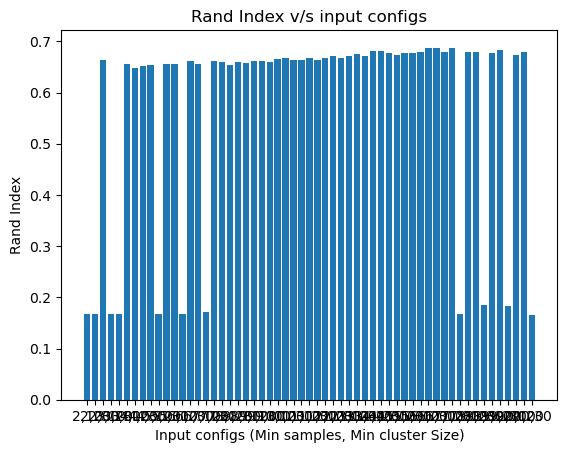

In [44]:
plt.bar(input_configs, rand_index_list)
plt.xlabel("Input configs (Min samples, Min cluster Size)")
plt.ylabel("Rand Index")
plt.title("Rand Index v/s input configs")
plt.savefig("../../visualizations/Q2/rand_index_bar.png")
plt.show()

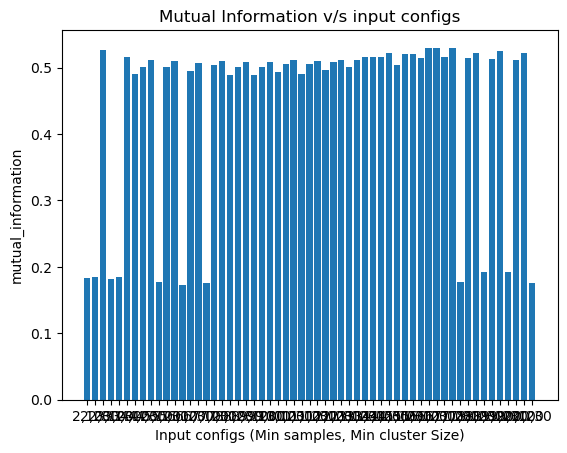

In [45]:
plt.bar(input_configs, mutual_information_list)
plt.xlabel("Input configs (Min samples, Min cluster Size)")
plt.ylabel("mutual_information")
plt.title("Mutual Information v/s input configs")
plt.savefig("../../visualizations/Q2/mutual_info_bar.png")
plt.show()

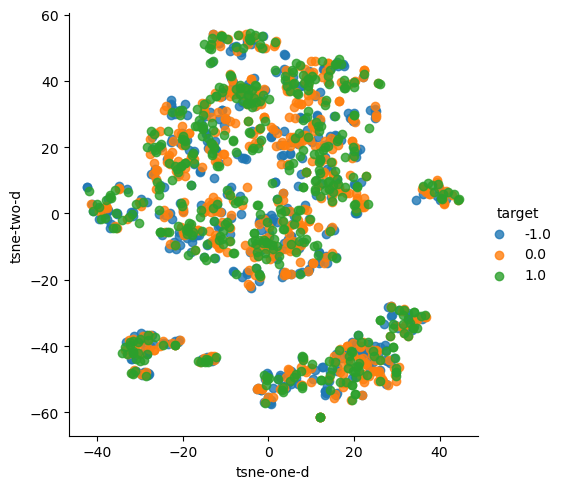

In [21]:
random_clusters_credit = perform_random_clustering(2, X_credit_data)
# X_credit_embedded_random = get_tsne(X_credit_data)

get_plot(X_credit_data_embedded, random_clusters_credit, save = True, path = "")

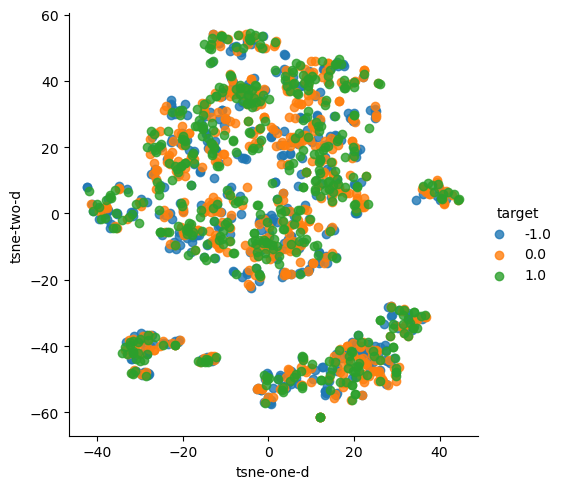

In [46]:
get_plot(X_credit_data_embedded, random_clusters_credit, save = True, path = "../../visualizations/Q2/random_data1.png")

In [22]:
print("Estimated number of clusters: ", len(np.unique(random_clusters_credit)))
print("Extrinsic Measures: ",extrinsic_scores(Y_credit_data, random_clusters_credit))
print("Intrinsic Measures: ",intrinsic_scores(X_credit_data, random_clusters_credit))

Estimated number of clusters:  3
Extrinsic Measures:  {'adjusted_rand_index': 0.001656935419097549, 'mutual_information': 0.0013023804124130314}
Intrinsic Measures:  {'silhouette score': -0.019203137780032235, 'calinski_harabasz_index': 1.2499327973234644, 'DB index': 45.11743602798947}


IRIS DATASET

In [23]:
iris_dataset = get_dataset('iris')
X_iris = iris_dataset.data
Y_iris = iris_dataset.target

In [24]:
X_iris_data_embedded = get_tsne(X_iris)

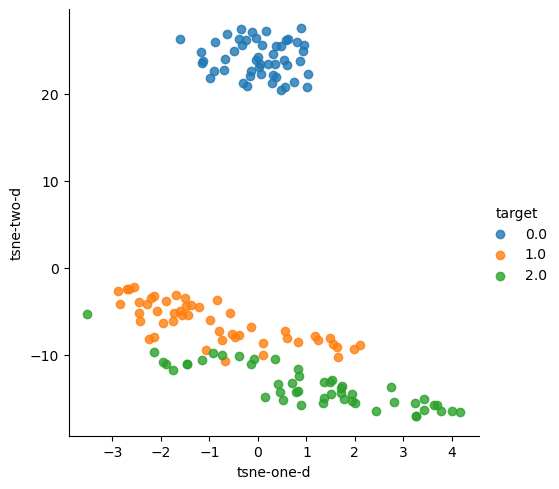

In [47]:
get_plot(X_iris_data_embedded, Y_iris, save = True, path = "../../visualizations/Q2/tsne_before_clustering_iris.png")

Min samples: 2, Min cluster size: 10


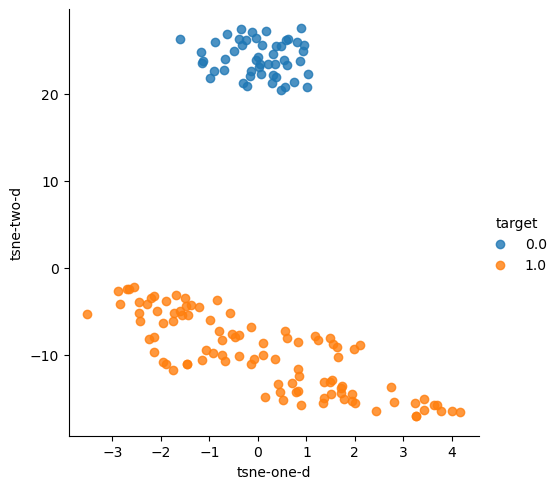

Estimated number of clusters:  2
Intrinsic Measures:  {'silhouette score': 0.6867350732769777, 'calinski_harabasz_index': 502.82156350235897, 'DB index': 0.38275284210068705}
Extrensic Measures:  {'adjusted_rand_index': 0.5681159420289855, 'mutual_information': 0.7315847607219573}
------------------------------------------------------------------
Min samples: 2, Min cluster size: 20


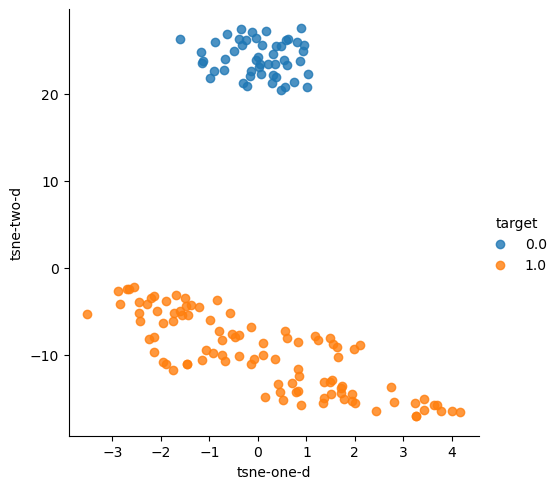

Estimated number of clusters:  2
Intrinsic Measures:  {'silhouette score': 0.6867350732769777, 'calinski_harabasz_index': 502.82156350235897, 'DB index': 0.38275284210068705}
Extrensic Measures:  {'adjusted_rand_index': 0.5681159420289855, 'mutual_information': 0.7315847607219573}
------------------------------------------------------------------
Min samples: 2, Min cluster size: 30


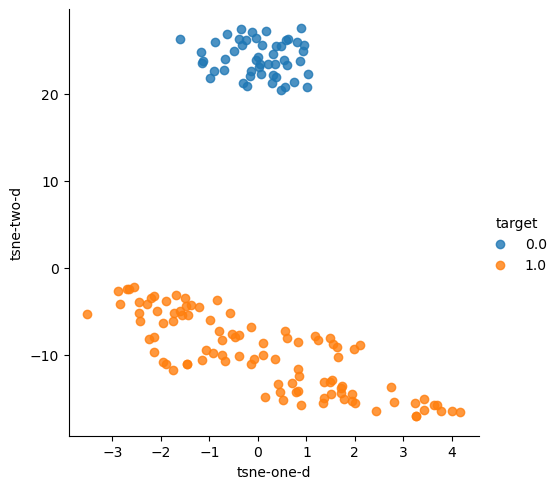

Estimated number of clusters:  2
Intrinsic Measures:  {'silhouette score': 0.6867350732769777, 'calinski_harabasz_index': 502.82156350235897, 'DB index': 0.38275284210068705}
Extrensic Measures:  {'adjusted_rand_index': 0.5681159420289855, 'mutual_information': 0.7315847607219573}
------------------------------------------------------------------
Min samples: 3, Min cluster size: 10


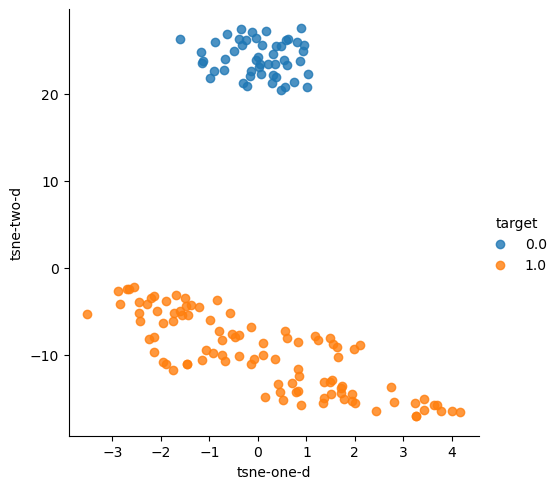

Estimated number of clusters:  2
Intrinsic Measures:  {'silhouette score': 0.6867350732769777, 'calinski_harabasz_index': 502.82156350235897, 'DB index': 0.38275284210068705}
Extrensic Measures:  {'adjusted_rand_index': 0.5681159420289855, 'mutual_information': 0.7315847607219573}
------------------------------------------------------------------
Min samples: 3, Min cluster size: 20


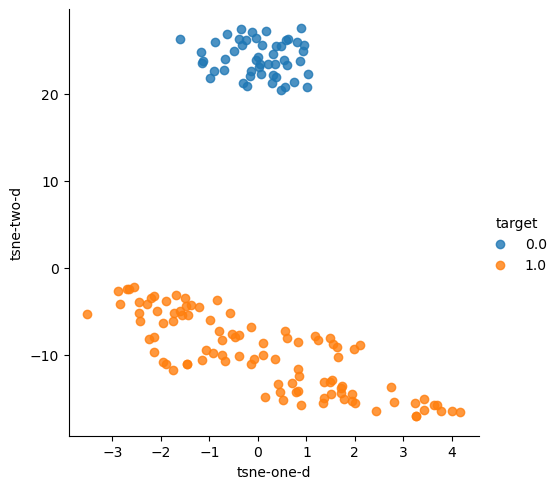

Estimated number of clusters:  2
Intrinsic Measures:  {'silhouette score': 0.6867350732769777, 'calinski_harabasz_index': 502.82156350235897, 'DB index': 0.38275284210068705}
Extrensic Measures:  {'adjusted_rand_index': 0.5681159420289855, 'mutual_information': 0.7315847607219573}
------------------------------------------------------------------
Min samples: 3, Min cluster size: 30


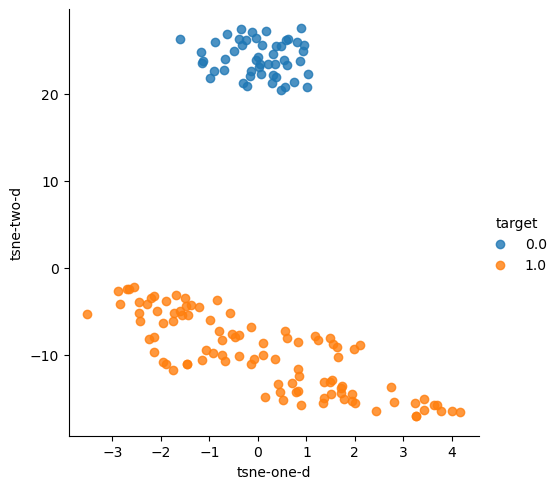

Estimated number of clusters:  2
Intrinsic Measures:  {'silhouette score': 0.6867350732769777, 'calinski_harabasz_index': 502.82156350235897, 'DB index': 0.38275284210068705}
Extrensic Measures:  {'adjusted_rand_index': 0.5681159420289855, 'mutual_information': 0.7315847607219573}
------------------------------------------------------------------
Min samples: 4, Min cluster size: 10


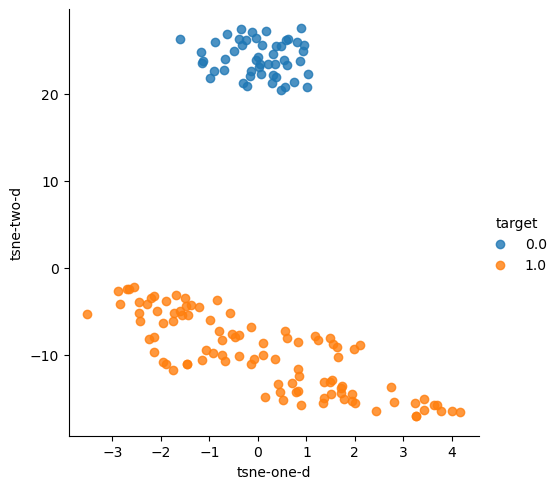

Estimated number of clusters:  2
Intrinsic Measures:  {'silhouette score': 0.6867350732769777, 'calinski_harabasz_index': 502.82156350235897, 'DB index': 0.38275284210068705}
Extrensic Measures:  {'adjusted_rand_index': 0.5681159420289855, 'mutual_information': 0.7315847607219573}
------------------------------------------------------------------
Min samples: 4, Min cluster size: 20


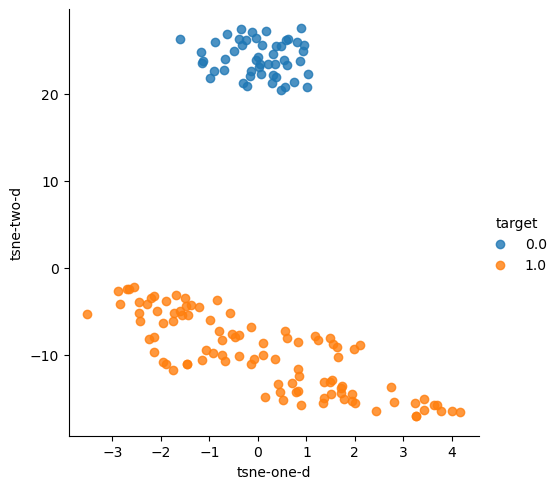

Estimated number of clusters:  2
Intrinsic Measures:  {'silhouette score': 0.6867350732769777, 'calinski_harabasz_index': 502.82156350235897, 'DB index': 0.38275284210068705}
Extrensic Measures:  {'adjusted_rand_index': 0.5681159420289855, 'mutual_information': 0.7315847607219573}
------------------------------------------------------------------
Min samples: 4, Min cluster size: 30


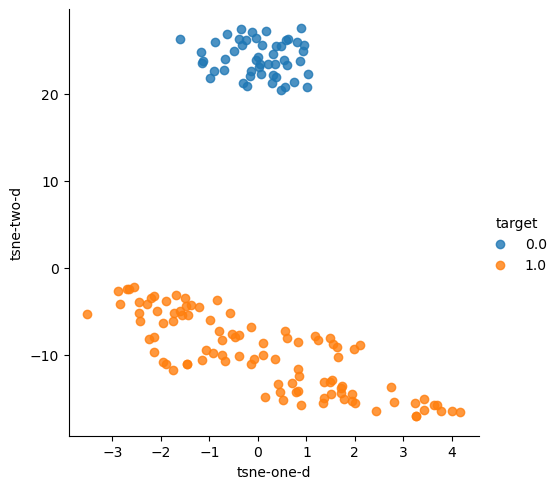

Estimated number of clusters:  2
Intrinsic Measures:  {'silhouette score': 0.6867350732769777, 'calinski_harabasz_index': 502.82156350235897, 'DB index': 0.38275284210068705}
Extrensic Measures:  {'adjusted_rand_index': 0.5681159420289855, 'mutual_information': 0.7315847607219573}
------------------------------------------------------------------
Min samples: 5, Min cluster size: 10


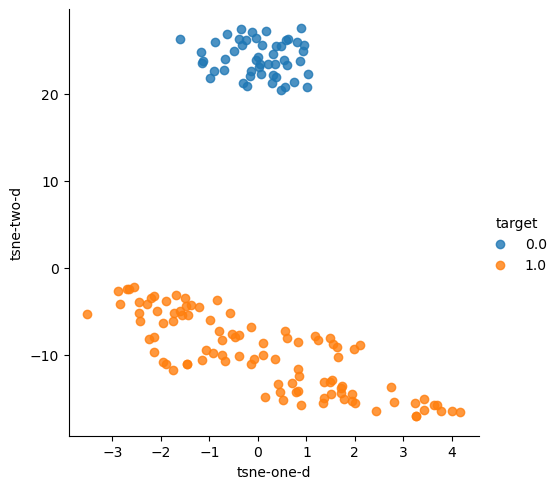

Estimated number of clusters:  2
Intrinsic Measures:  {'silhouette score': 0.6867350732769777, 'calinski_harabasz_index': 502.82156350235897, 'DB index': 0.38275284210068705}
Extrensic Measures:  {'adjusted_rand_index': 0.5681159420289855, 'mutual_information': 0.7315847607219573}
------------------------------------------------------------------
Min samples: 5, Min cluster size: 20


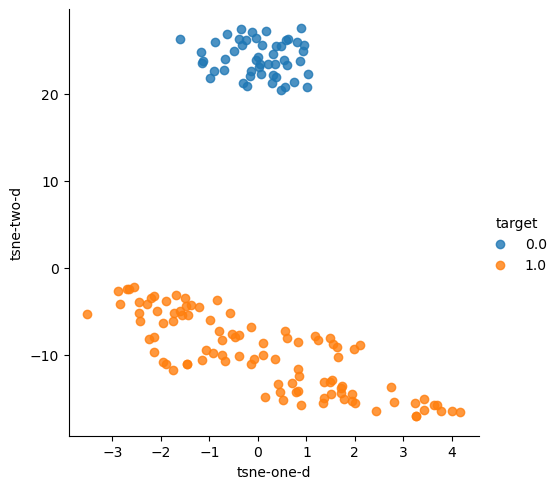

Estimated number of clusters:  2
Intrinsic Measures:  {'silhouette score': 0.6867350732769777, 'calinski_harabasz_index': 502.82156350235897, 'DB index': 0.38275284210068705}
Extrensic Measures:  {'adjusted_rand_index': 0.5681159420289855, 'mutual_information': 0.7315847607219573}
------------------------------------------------------------------
Min samples: 5, Min cluster size: 30


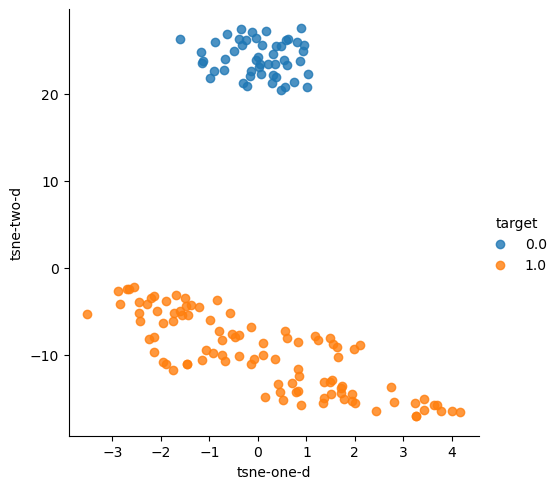

Estimated number of clusters:  2
Intrinsic Measures:  {'silhouette score': 0.6867350732769777, 'calinski_harabasz_index': 502.82156350235897, 'DB index': 0.38275284210068705}
Extrensic Measures:  {'adjusted_rand_index': 0.5681159420289855, 'mutual_information': 0.7315847607219573}
------------------------------------------------------------------
Min samples: 6, Min cluster size: 10


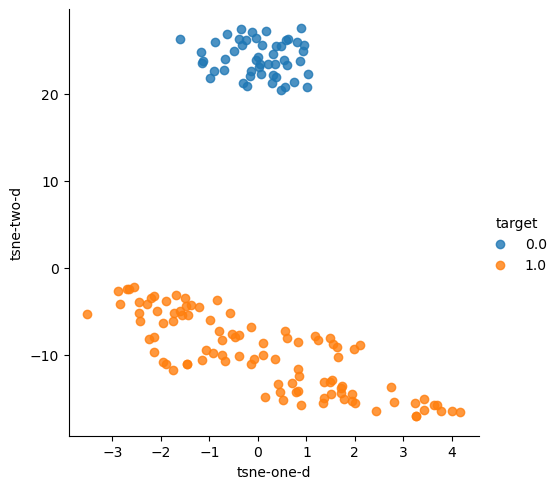

Estimated number of clusters:  2
Intrinsic Measures:  {'silhouette score': 0.6867350732769777, 'calinski_harabasz_index': 502.82156350235897, 'DB index': 0.38275284210068705}
Extrensic Measures:  {'adjusted_rand_index': 0.5681159420289855, 'mutual_information': 0.7315847607219573}
------------------------------------------------------------------
Min samples: 6, Min cluster size: 20


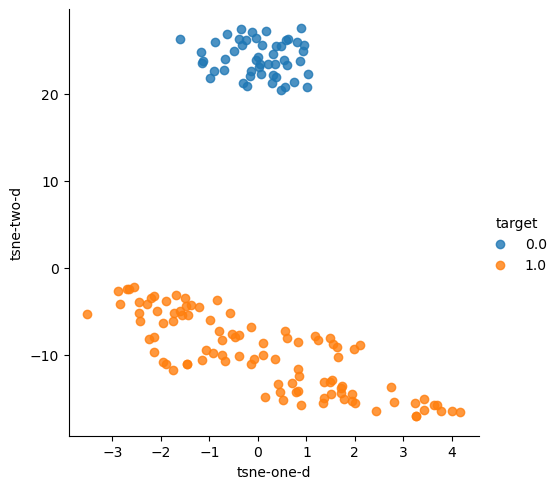

Estimated number of clusters:  2
Intrinsic Measures:  {'silhouette score': 0.6867350732769777, 'calinski_harabasz_index': 502.82156350235897, 'DB index': 0.38275284210068705}
Extrensic Measures:  {'adjusted_rand_index': 0.5681159420289855, 'mutual_information': 0.7315847607219573}
------------------------------------------------------------------
Min samples: 6, Min cluster size: 30


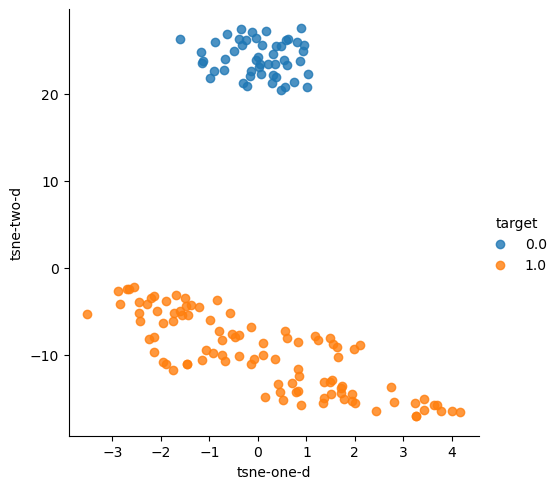

Estimated number of clusters:  2
Intrinsic Measures:  {'silhouette score': 0.6867350732769777, 'calinski_harabasz_index': 502.82156350235897, 'DB index': 0.38275284210068705}
Extrensic Measures:  {'adjusted_rand_index': 0.5681159420289855, 'mutual_information': 0.7315847607219573}
------------------------------------------------------------------
Min samples: 7, Min cluster size: 10


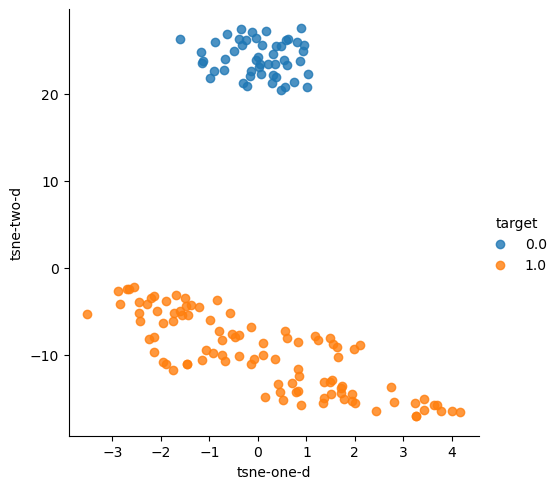

Estimated number of clusters:  2
Intrinsic Measures:  {'silhouette score': 0.6867350732769777, 'calinski_harabasz_index': 502.82156350235897, 'DB index': 0.38275284210068705}
Extrensic Measures:  {'adjusted_rand_index': 0.5681159420289855, 'mutual_information': 0.7315847607219573}
------------------------------------------------------------------
Min samples: 7, Min cluster size: 20


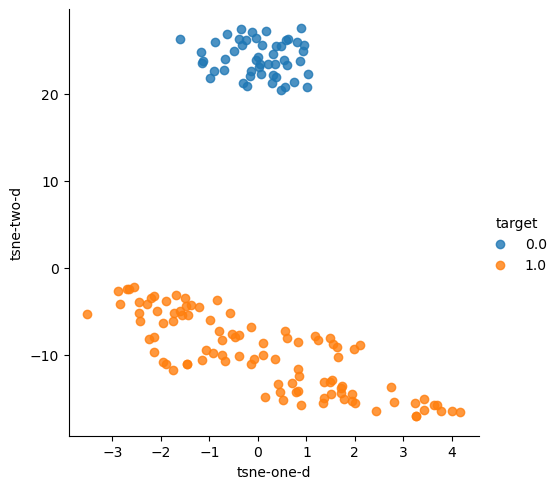

Estimated number of clusters:  2
Intrinsic Measures:  {'silhouette score': 0.6867350732769777, 'calinski_harabasz_index': 502.82156350235897, 'DB index': 0.38275284210068705}
Extrensic Measures:  {'adjusted_rand_index': 0.5681159420289855, 'mutual_information': 0.7315847607219573}
------------------------------------------------------------------
Min samples: 7, Min cluster size: 30


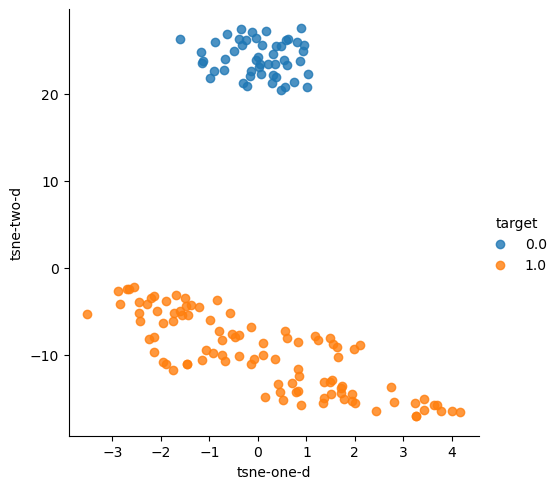

Estimated number of clusters:  2
Intrinsic Measures:  {'silhouette score': 0.6867350732769777, 'calinski_harabasz_index': 502.82156350235897, 'DB index': 0.38275284210068705}
Extrensic Measures:  {'adjusted_rand_index': 0.5681159420289855, 'mutual_information': 0.7315847607219573}
------------------------------------------------------------------
Min samples: 8, Min cluster size: 10


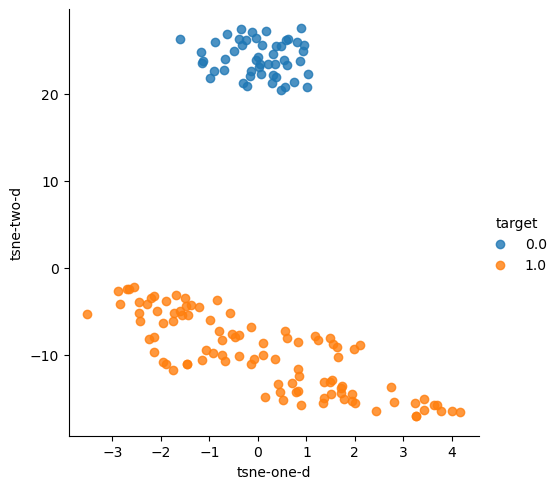

Estimated number of clusters:  2
Intrinsic Measures:  {'silhouette score': 0.6867350732769777, 'calinski_harabasz_index': 502.82156350235897, 'DB index': 0.38275284210068705}
Extrensic Measures:  {'adjusted_rand_index': 0.5681159420289855, 'mutual_information': 0.7315847607219573}
------------------------------------------------------------------
Min samples: 8, Min cluster size: 20


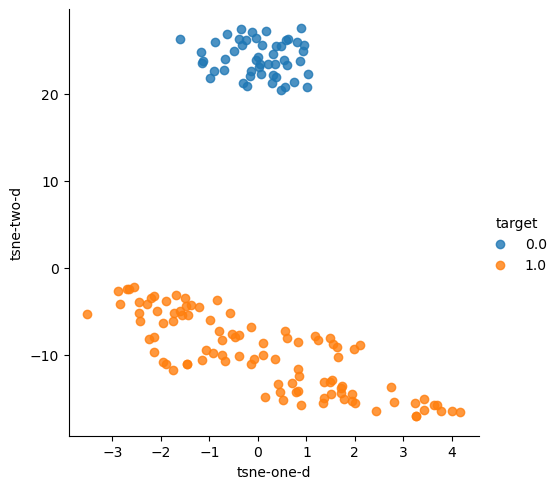

Estimated number of clusters:  2
Intrinsic Measures:  {'silhouette score': 0.6867350732769777, 'calinski_harabasz_index': 502.82156350235897, 'DB index': 0.38275284210068705}
Extrensic Measures:  {'adjusted_rand_index': 0.5681159420289855, 'mutual_information': 0.7315847607219573}
------------------------------------------------------------------
Min samples: 8, Min cluster size: 30


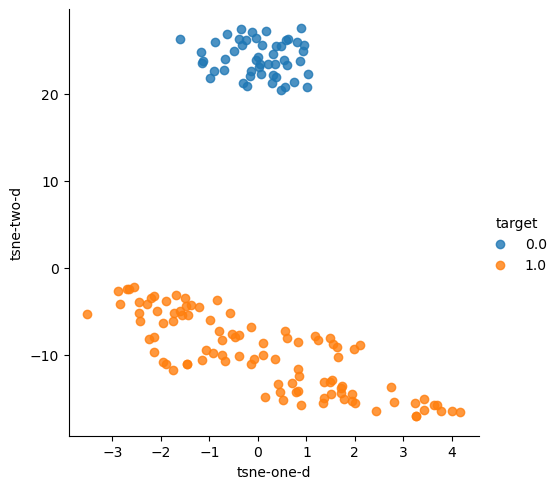

Estimated number of clusters:  2
Intrinsic Measures:  {'silhouette score': 0.6867350732769777, 'calinski_harabasz_index': 502.82156350235897, 'DB index': 0.38275284210068705}
Extrensic Measures:  {'adjusted_rand_index': 0.5681159420289855, 'mutual_information': 0.7315847607219573}
------------------------------------------------------------------
Min samples: 9, Min cluster size: 10


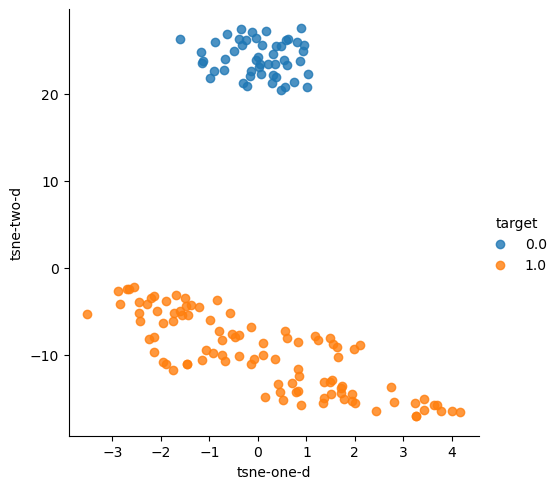

Estimated number of clusters:  2
Intrinsic Measures:  {'silhouette score': 0.6867350732769777, 'calinski_harabasz_index': 502.82156350235897, 'DB index': 0.38275284210068705}
Extrensic Measures:  {'adjusted_rand_index': 0.5681159420289855, 'mutual_information': 0.7315847607219573}
------------------------------------------------------------------
Min samples: 9, Min cluster size: 20


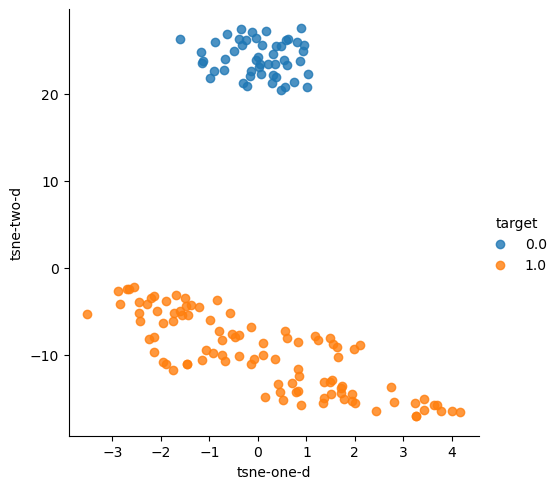

Estimated number of clusters:  2
Intrinsic Measures:  {'silhouette score': 0.6867350732769777, 'calinski_harabasz_index': 502.82156350235897, 'DB index': 0.38275284210068705}
Extrensic Measures:  {'adjusted_rand_index': 0.5681159420289855, 'mutual_information': 0.7315847607219573}
------------------------------------------------------------------
Min samples: 9, Min cluster size: 30


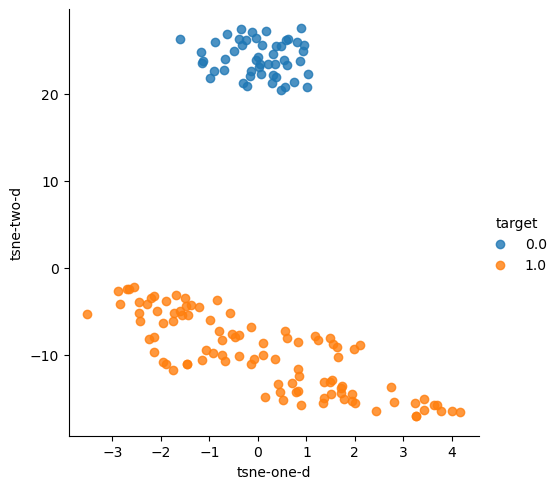

Estimated number of clusters:  2
Intrinsic Measures:  {'silhouette score': 0.6867350732769777, 'calinski_harabasz_index': 502.82156350235897, 'DB index': 0.38275284210068705}
Extrensic Measures:  {'adjusted_rand_index': 0.5681159420289855, 'mutual_information': 0.7315847607219573}
------------------------------------------------------------------
Min samples: 10, Min cluster size: 10


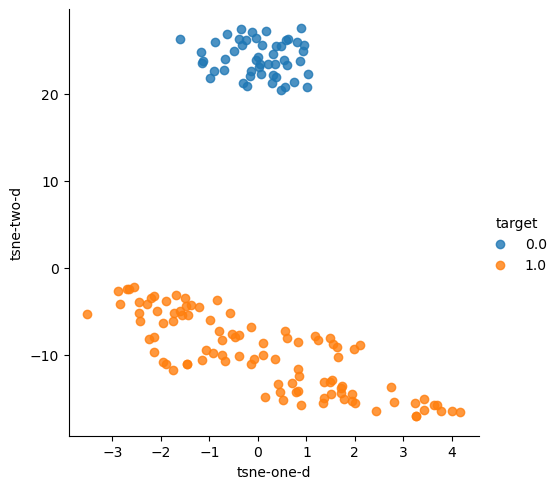

Estimated number of clusters:  2
Intrinsic Measures:  {'silhouette score': 0.6867350732769777, 'calinski_harabasz_index': 502.82156350235897, 'DB index': 0.38275284210068705}
Extrensic Measures:  {'adjusted_rand_index': 0.5681159420289855, 'mutual_information': 0.7315847607219573}
------------------------------------------------------------------
Min samples: 10, Min cluster size: 20


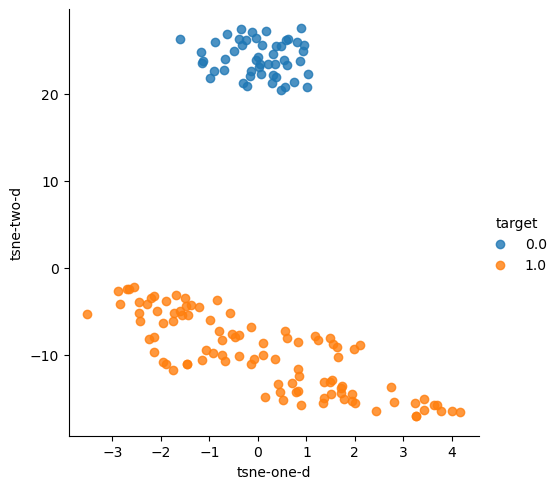

Estimated number of clusters:  2
Intrinsic Measures:  {'silhouette score': 0.6867350732769777, 'calinski_harabasz_index': 502.82156350235897, 'DB index': 0.38275284210068705}
Extrensic Measures:  {'adjusted_rand_index': 0.5681159420289855, 'mutual_information': 0.7315847607219573}
------------------------------------------------------------------
Min samples: 10, Min cluster size: 30


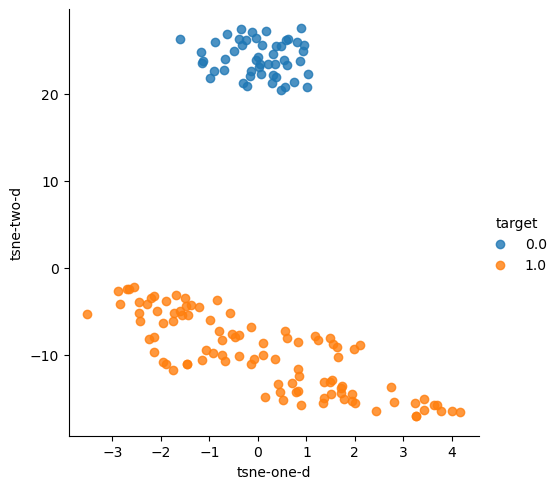

Estimated number of clusters:  2
Intrinsic Measures:  {'silhouette score': 0.6867350732769777, 'calinski_harabasz_index': 502.82156350235897, 'DB index': 0.38275284210068705}
Extrensic Measures:  {'adjusted_rand_index': 0.5681159420289855, 'mutual_information': 0.7315847607219573}
------------------------------------------------------------------
Min samples: 11, Min cluster size: 10


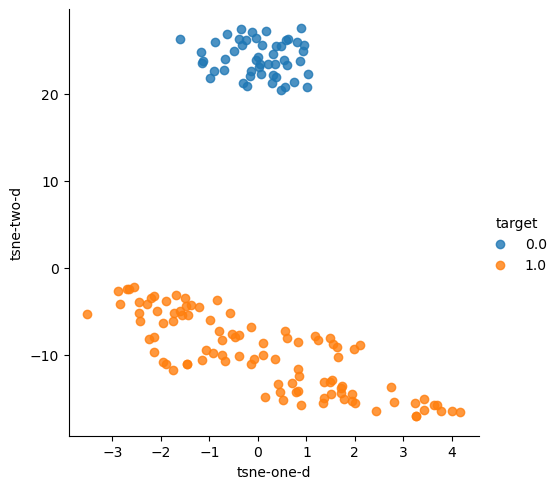

Estimated number of clusters:  2
Intrinsic Measures:  {'silhouette score': 0.6867350732769777, 'calinski_harabasz_index': 502.82156350235897, 'DB index': 0.38275284210068705}
Extrensic Measures:  {'adjusted_rand_index': 0.5681159420289855, 'mutual_information': 0.7315847607219573}
------------------------------------------------------------------
Min samples: 11, Min cluster size: 20


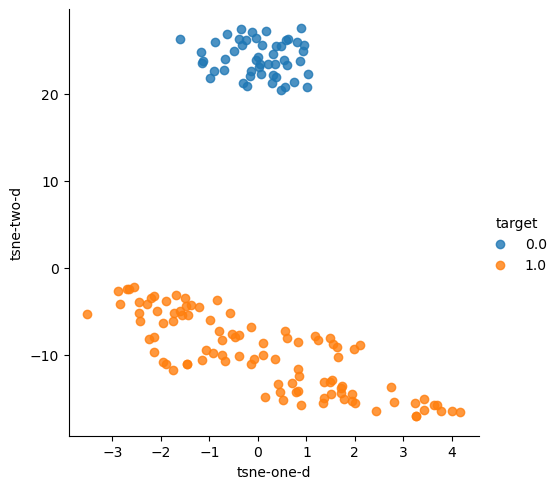

Estimated number of clusters:  2
Intrinsic Measures:  {'silhouette score': 0.6867350732769777, 'calinski_harabasz_index': 502.82156350235897, 'DB index': 0.38275284210068705}
Extrensic Measures:  {'adjusted_rand_index': 0.5681159420289855, 'mutual_information': 0.7315847607219573}
------------------------------------------------------------------
Min samples: 11, Min cluster size: 30


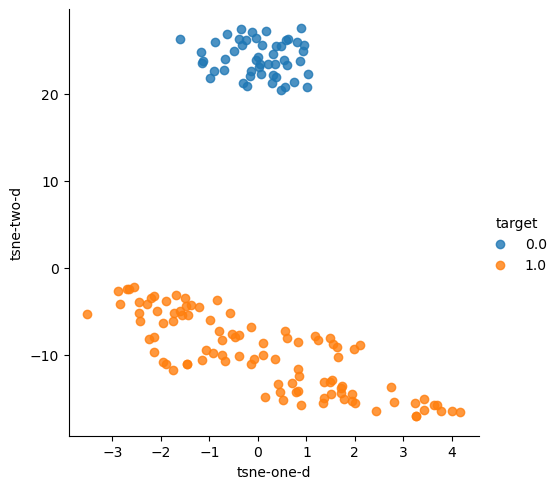

Estimated number of clusters:  2
Intrinsic Measures:  {'silhouette score': 0.6867350732769777, 'calinski_harabasz_index': 502.82156350235897, 'DB index': 0.38275284210068705}
Extrensic Measures:  {'adjusted_rand_index': 0.5681159420289855, 'mutual_information': 0.7315847607219573}
------------------------------------------------------------------
Min samples: 12, Min cluster size: 10


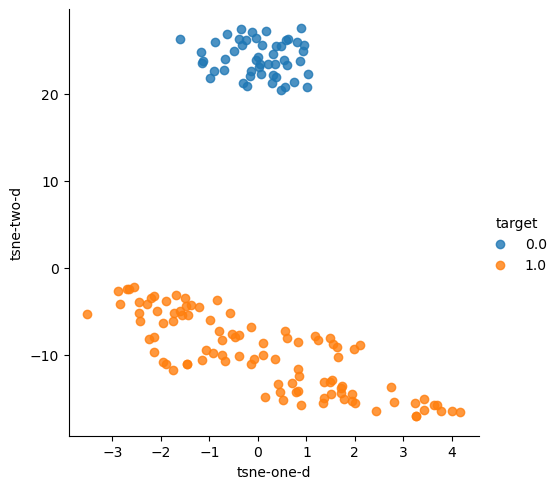

Estimated number of clusters:  2
Intrinsic Measures:  {'silhouette score': 0.6867350732769777, 'calinski_harabasz_index': 502.82156350235897, 'DB index': 0.38275284210068705}
Extrensic Measures:  {'adjusted_rand_index': 0.5681159420289855, 'mutual_information': 0.7315847607219573}
------------------------------------------------------------------
Min samples: 12, Min cluster size: 20


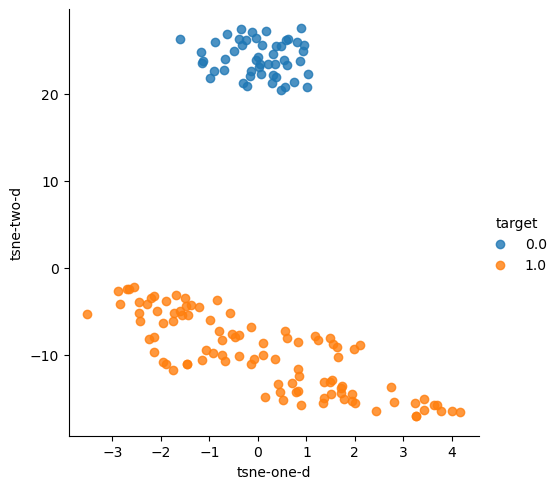

Estimated number of clusters:  2
Intrinsic Measures:  {'silhouette score': 0.6867350732769777, 'calinski_harabasz_index': 502.82156350235897, 'DB index': 0.38275284210068705}
Extrensic Measures:  {'adjusted_rand_index': 0.5681159420289855, 'mutual_information': 0.7315847607219573}
------------------------------------------------------------------
Min samples: 12, Min cluster size: 30


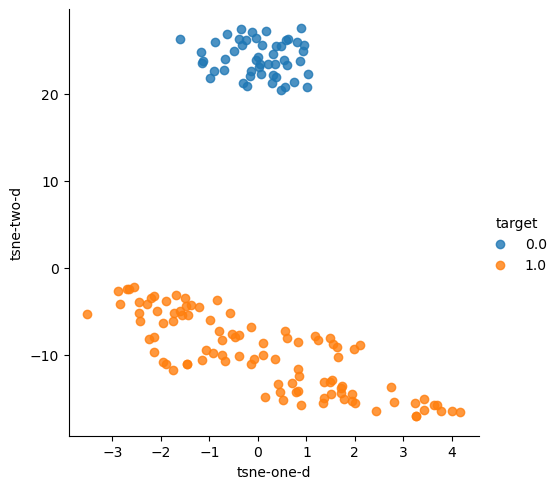

Estimated number of clusters:  2
Intrinsic Measures:  {'silhouette score': 0.6867350732769777, 'calinski_harabasz_index': 502.82156350235897, 'DB index': 0.38275284210068705}
Extrensic Measures:  {'adjusted_rand_index': 0.5681159420289855, 'mutual_information': 0.7315847607219573}
------------------------------------------------------------------
Min samples: 13, Min cluster size: 10


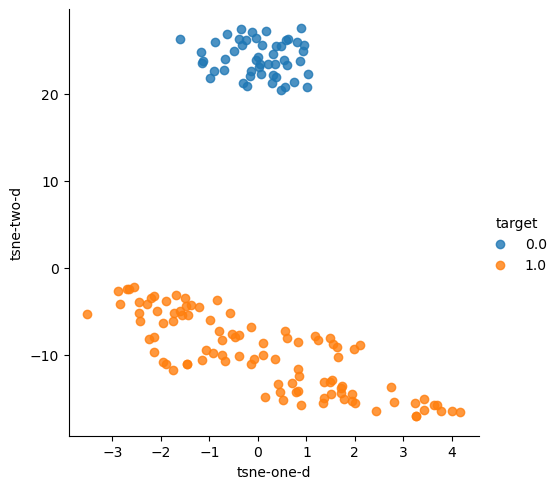

Estimated number of clusters:  2
Intrinsic Measures:  {'silhouette score': 0.6867350732769777, 'calinski_harabasz_index': 502.82156350235897, 'DB index': 0.38275284210068705}
Extrensic Measures:  {'adjusted_rand_index': 0.5681159420289855, 'mutual_information': 0.7315847607219573}
------------------------------------------------------------------
Min samples: 13, Min cluster size: 20


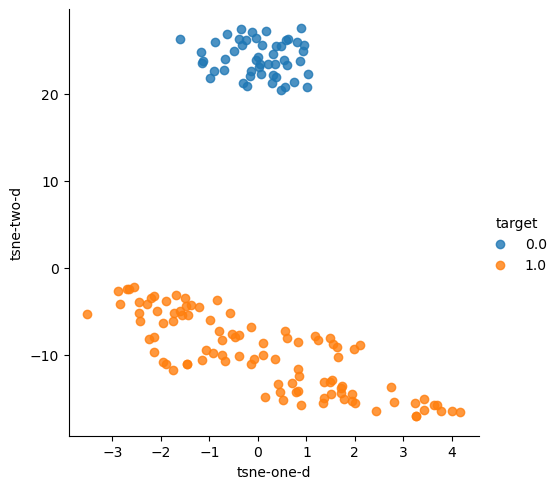

Estimated number of clusters:  2
Intrinsic Measures:  {'silhouette score': 0.6867350732769777, 'calinski_harabasz_index': 502.82156350235897, 'DB index': 0.38275284210068705}
Extrensic Measures:  {'adjusted_rand_index': 0.5681159420289855, 'mutual_information': 0.7315847607219573}
------------------------------------------------------------------
Min samples: 13, Min cluster size: 30


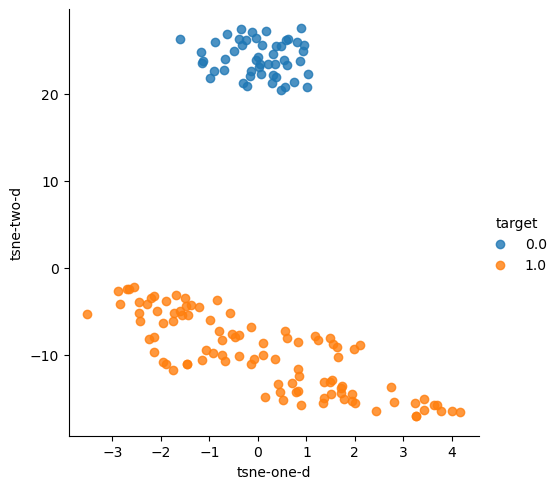

Estimated number of clusters:  2
Intrinsic Measures:  {'silhouette score': 0.6867350732769777, 'calinski_harabasz_index': 502.82156350235897, 'DB index': 0.38275284210068705}
Extrensic Measures:  {'adjusted_rand_index': 0.5681159420289855, 'mutual_information': 0.7315847607219573}
------------------------------------------------------------------
Min samples: 14, Min cluster size: 10


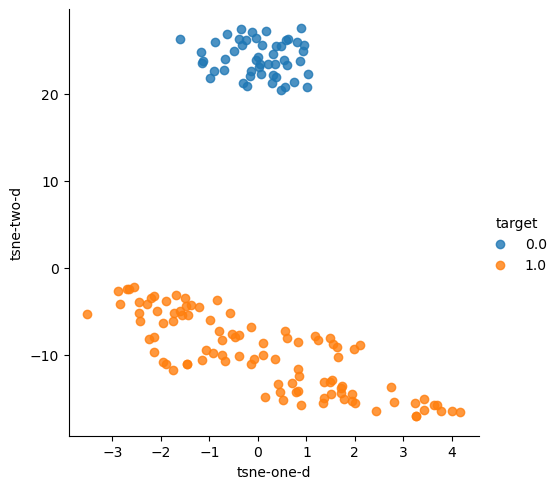

Estimated number of clusters:  2
Intrinsic Measures:  {'silhouette score': 0.6867350732769777, 'calinski_harabasz_index': 502.82156350235897, 'DB index': 0.38275284210068705}
Extrensic Measures:  {'adjusted_rand_index': 0.5681159420289855, 'mutual_information': 0.7315847607219573}
------------------------------------------------------------------
Min samples: 14, Min cluster size: 20


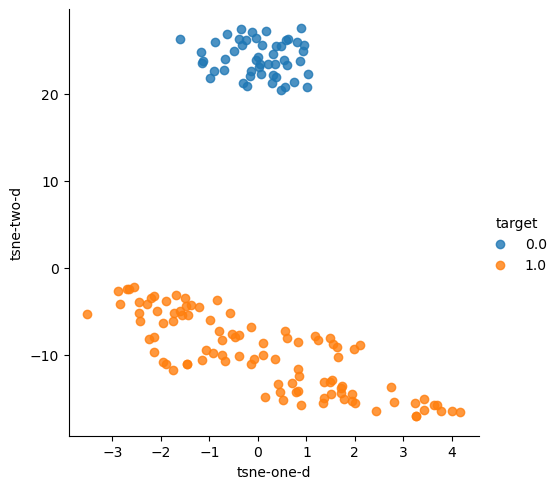

Estimated number of clusters:  2
Intrinsic Measures:  {'silhouette score': 0.6867350732769777, 'calinski_harabasz_index': 502.82156350235897, 'DB index': 0.38275284210068705}
Extrensic Measures:  {'adjusted_rand_index': 0.5681159420289855, 'mutual_information': 0.7315847607219573}
------------------------------------------------------------------
Min samples: 14, Min cluster size: 30


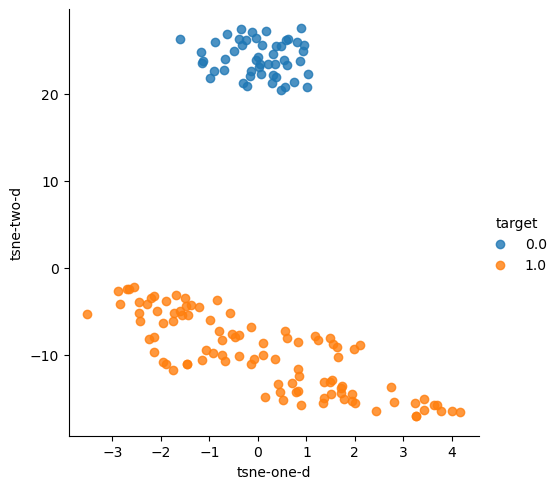

Estimated number of clusters:  2
Intrinsic Measures:  {'silhouette score': 0.6867350732769777, 'calinski_harabasz_index': 502.82156350235897, 'DB index': 0.38275284210068705}
Extrensic Measures:  {'adjusted_rand_index': 0.5681159420289855, 'mutual_information': 0.7315847607219573}
------------------------------------------------------------------
Min samples: 15, Min cluster size: 10


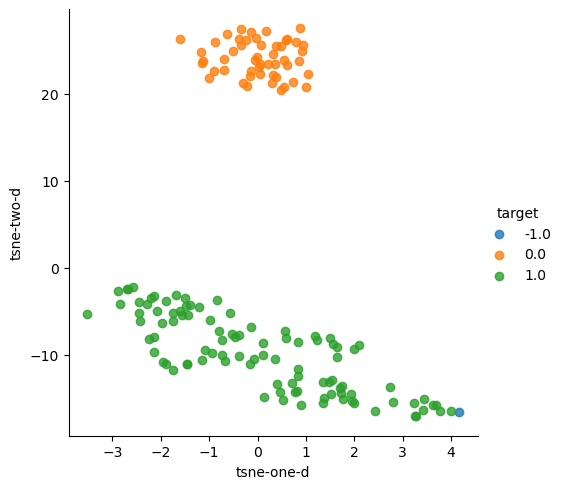

Estimated number of clusters:  3
Intrinsic Measures:  {'silhouette score': 0.5016159839789518, 'calinski_harabasz_index': 264.03035485871817, 'DB index': 0.3916897190820318}
Extrensic Measures:  {'adjusted_rand_index': 0.5657466140922338, 'mutual_information': 0.7189943136755852}
------------------------------------------------------------------
Min samples: 15, Min cluster size: 20


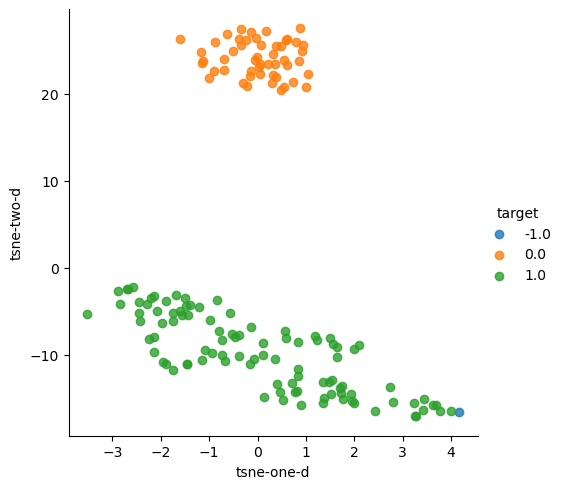

Estimated number of clusters:  3
Intrinsic Measures:  {'silhouette score': 0.5016159839789518, 'calinski_harabasz_index': 264.03035485871817, 'DB index': 0.3916897190820318}
Extrensic Measures:  {'adjusted_rand_index': 0.5657466140922338, 'mutual_information': 0.7189943136755852}
------------------------------------------------------------------
Min samples: 15, Min cluster size: 30


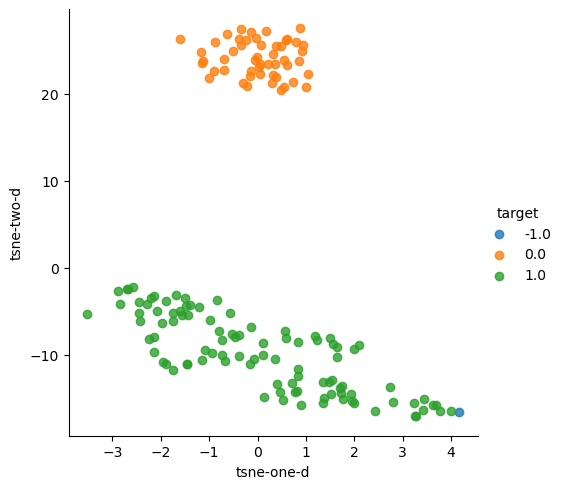

Estimated number of clusters:  3
Intrinsic Measures:  {'silhouette score': 0.5016159839789518, 'calinski_harabasz_index': 264.03035485871817, 'DB index': 0.3916897190820318}
Extrensic Measures:  {'adjusted_rand_index': 0.5657466140922338, 'mutual_information': 0.7189943136755852}
------------------------------------------------------------------
Min samples: 16, Min cluster size: 10


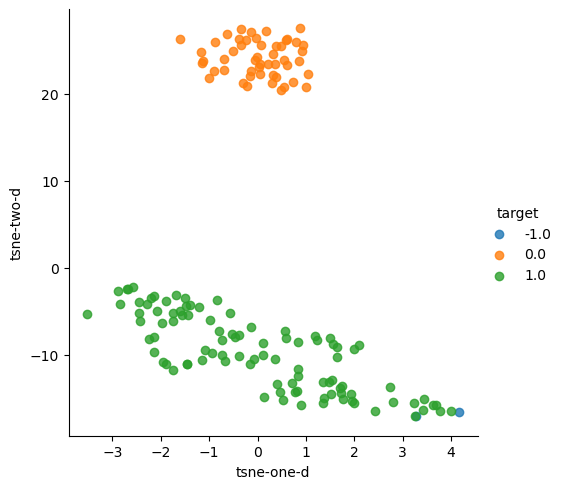

Estimated number of clusters:  3
Intrinsic Measures:  {'silhouette score': 0.5129061768338571, 'calinski_harabasz_index': 277.90910777296745, 'DB index': 0.5542897924650775}
Extrensic Measures:  {'adjusted_rand_index': 0.5637510205230709, 'mutual_information': 0.7125764811325077}
------------------------------------------------------------------
Min samples: 16, Min cluster size: 20


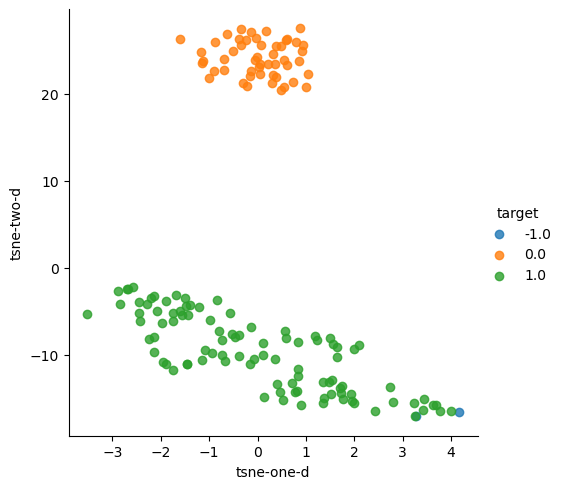

Estimated number of clusters:  3
Intrinsic Measures:  {'silhouette score': 0.5129061768338571, 'calinski_harabasz_index': 277.90910777296745, 'DB index': 0.5542897924650775}
Extrensic Measures:  {'adjusted_rand_index': 0.5637510205230709, 'mutual_information': 0.7125764811325077}
------------------------------------------------------------------
Min samples: 16, Min cluster size: 30


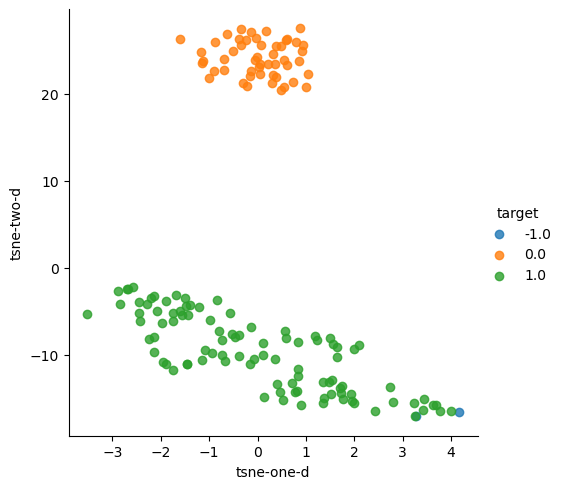

Estimated number of clusters:  3
Intrinsic Measures:  {'silhouette score': 0.5129061768338571, 'calinski_harabasz_index': 277.90910777296745, 'DB index': 0.5542897924650775}
Extrensic Measures:  {'adjusted_rand_index': 0.5637510205230709, 'mutual_information': 0.7125764811325077}
------------------------------------------------------------------
Min samples: 17, Min cluster size: 10


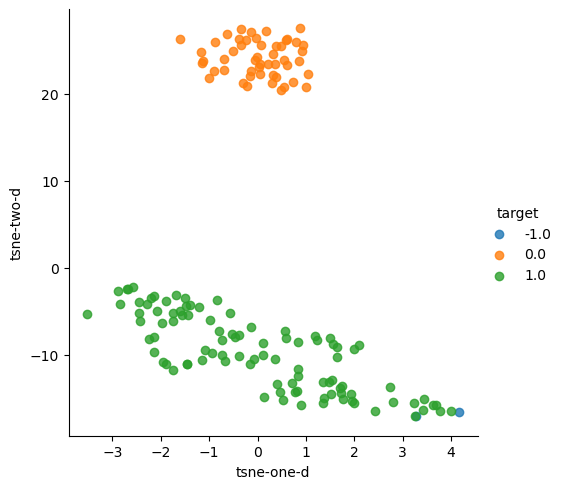

Estimated number of clusters:  3
Intrinsic Measures:  {'silhouette score': 0.5129061768338571, 'calinski_harabasz_index': 277.90910777296745, 'DB index': 0.5542897924650775}
Extrensic Measures:  {'adjusted_rand_index': 0.5637510205230709, 'mutual_information': 0.7125764811325077}
------------------------------------------------------------------
Min samples: 17, Min cluster size: 20


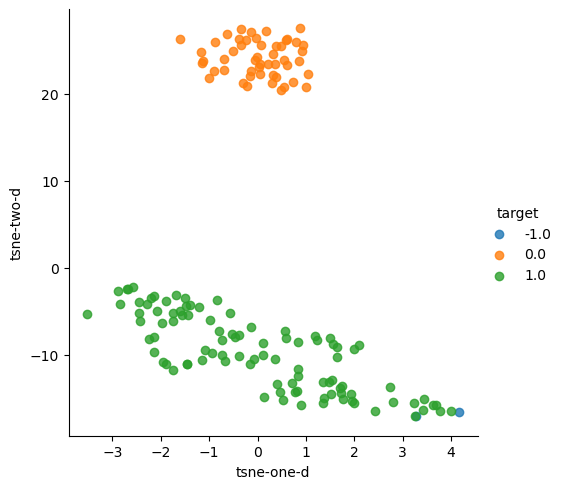

Estimated number of clusters:  3
Intrinsic Measures:  {'silhouette score': 0.5129061768338571, 'calinski_harabasz_index': 277.90910777296745, 'DB index': 0.5542897924650775}
Extrensic Measures:  {'adjusted_rand_index': 0.5637510205230709, 'mutual_information': 0.7125764811325077}
------------------------------------------------------------------
Min samples: 17, Min cluster size: 30


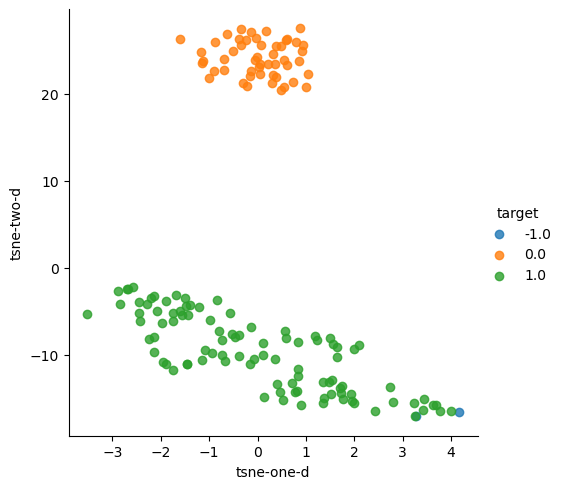

Estimated number of clusters:  3
Intrinsic Measures:  {'silhouette score': 0.5129061768338571, 'calinski_harabasz_index': 277.90910777296745, 'DB index': 0.5542897924650775}
Extrensic Measures:  {'adjusted_rand_index': 0.5637510205230709, 'mutual_information': 0.7125764811325077}
------------------------------------------------------------------
Min samples: 18, Min cluster size: 10


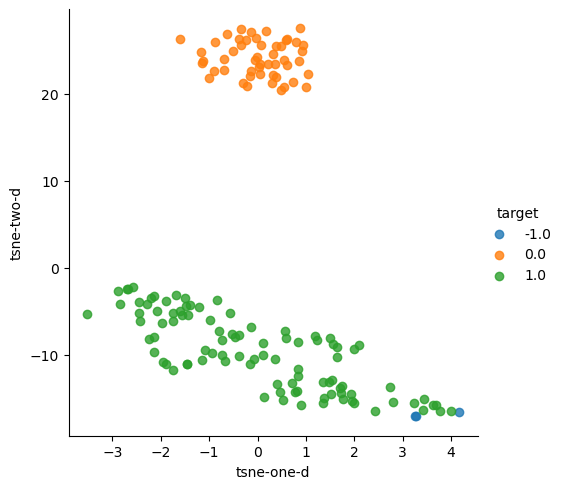

Estimated number of clusters:  3
Intrinsic Measures:  {'silhouette score': 0.5223074893266363, 'calinski_harabasz_index': 292.71955319063466, 'DB index': 0.5480131806352451}
Extrensic Measures:  {'adjusted_rand_index': 0.5621364251426576, 'mutual_information': 0.7081693056957751}
------------------------------------------------------------------
Min samples: 18, Min cluster size: 20


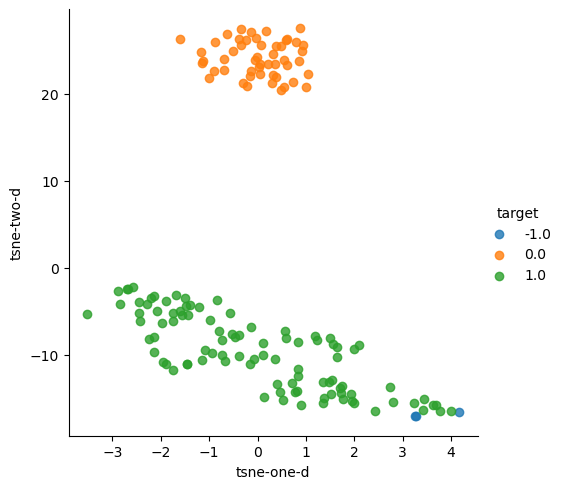

Estimated number of clusters:  3
Intrinsic Measures:  {'silhouette score': 0.5223074893266363, 'calinski_harabasz_index': 292.71955319063466, 'DB index': 0.5480131806352451}
Extrensic Measures:  {'adjusted_rand_index': 0.5621364251426576, 'mutual_information': 0.7081693056957751}
------------------------------------------------------------------
Min samples: 18, Min cluster size: 30


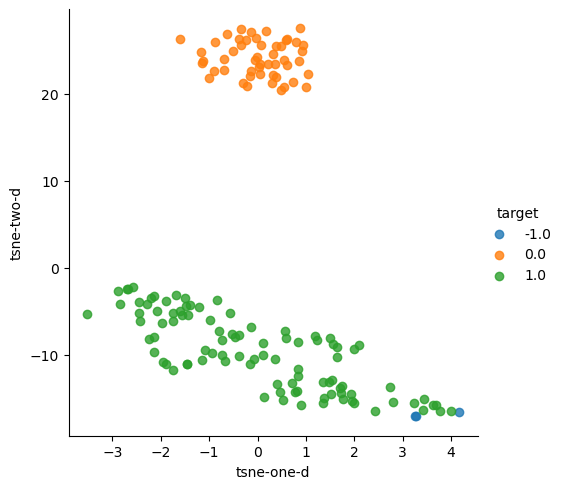

Estimated number of clusters:  3
Intrinsic Measures:  {'silhouette score': 0.5223074893266363, 'calinski_harabasz_index': 292.71955319063466, 'DB index': 0.5480131806352451}
Extrensic Measures:  {'adjusted_rand_index': 0.5621364251426576, 'mutual_information': 0.7081693056957751}
------------------------------------------------------------------
Min samples: 19, Min cluster size: 10


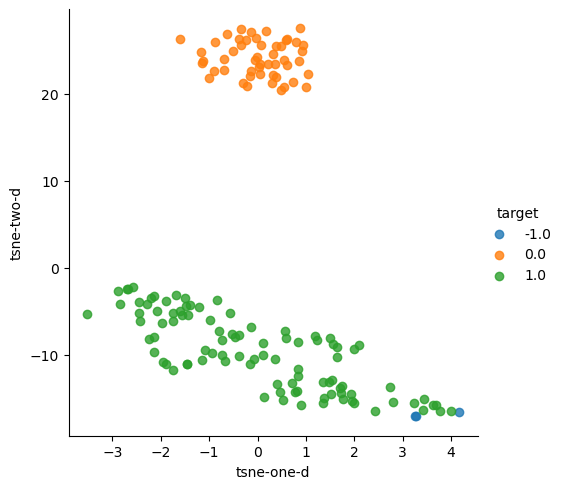

Estimated number of clusters:  3
Intrinsic Measures:  {'silhouette score': 0.5223074893266363, 'calinski_harabasz_index': 292.71955319063466, 'DB index': 0.5480131806352451}
Extrensic Measures:  {'adjusted_rand_index': 0.5621364251426576, 'mutual_information': 0.7081693056957751}
------------------------------------------------------------------
Min samples: 19, Min cluster size: 20


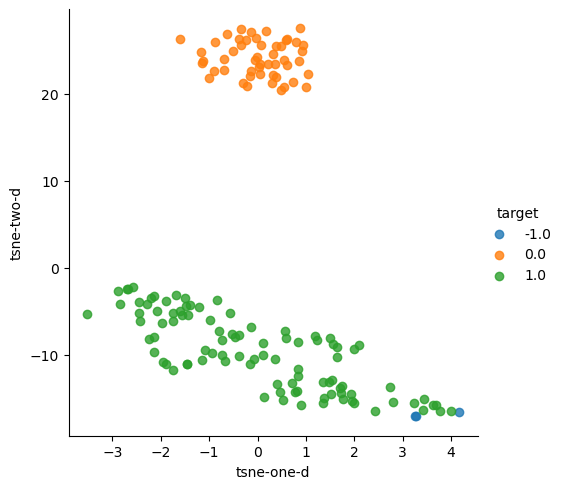

Estimated number of clusters:  3
Intrinsic Measures:  {'silhouette score': 0.5223074893266363, 'calinski_harabasz_index': 292.71955319063466, 'DB index': 0.5480131806352451}
Extrensic Measures:  {'adjusted_rand_index': 0.5621364251426576, 'mutual_information': 0.7081693056957751}
------------------------------------------------------------------
Min samples: 19, Min cluster size: 30


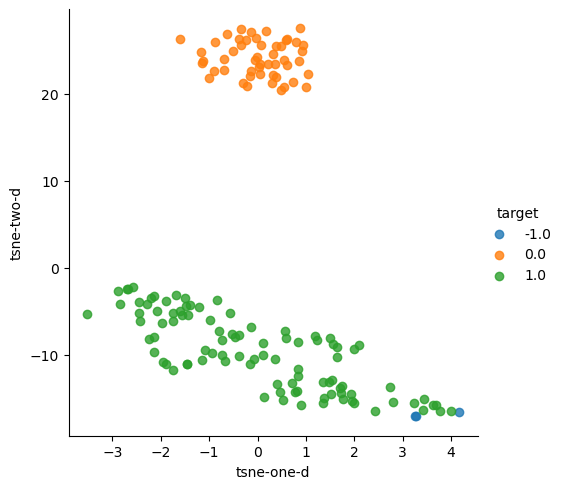

Estimated number of clusters:  3
Intrinsic Measures:  {'silhouette score': 0.5223074893266363, 'calinski_harabasz_index': 292.71955319063466, 'DB index': 0.5480131806352451}
Extrensic Measures:  {'adjusted_rand_index': 0.5621364251426576, 'mutual_information': 0.7081693056957751}
------------------------------------------------------------------
Min samples: 20, Min cluster size: 10


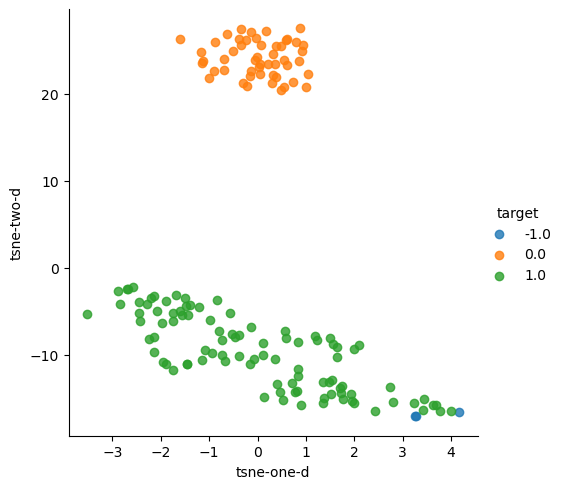

Estimated number of clusters:  3
Intrinsic Measures:  {'silhouette score': 0.5223074893266363, 'calinski_harabasz_index': 292.71955319063466, 'DB index': 0.5480131806352451}
Extrensic Measures:  {'adjusted_rand_index': 0.5621364251426576, 'mutual_information': 0.7081693056957751}
------------------------------------------------------------------
Min samples: 20, Min cluster size: 20


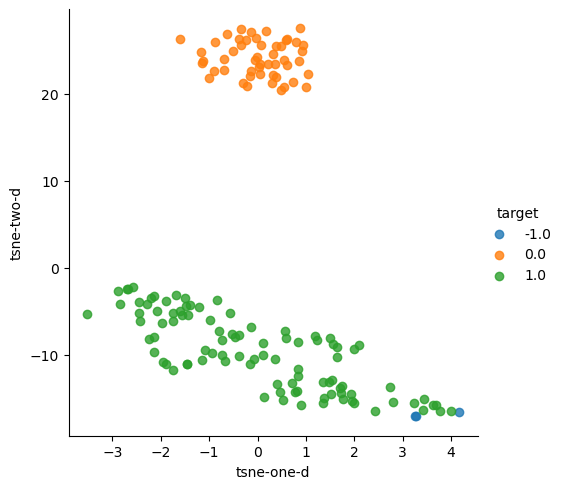

Estimated number of clusters:  3
Intrinsic Measures:  {'silhouette score': 0.5223074893266363, 'calinski_harabasz_index': 292.71955319063466, 'DB index': 0.5480131806352451}
Extrensic Measures:  {'adjusted_rand_index': 0.5621364251426576, 'mutual_information': 0.7081693056957751}
------------------------------------------------------------------
Min samples: 20, Min cluster size: 30


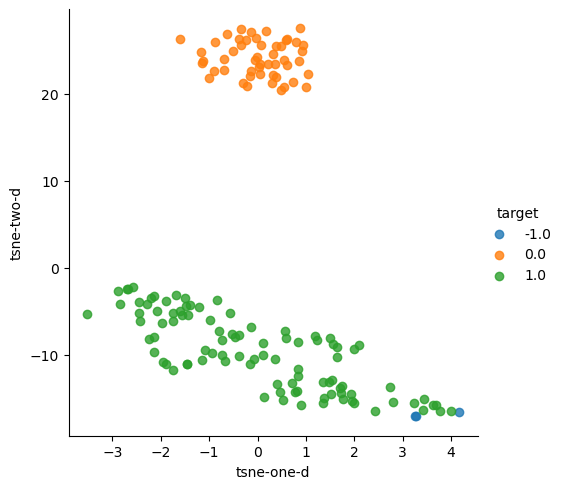

Estimated number of clusters:  3
Intrinsic Measures:  {'silhouette score': 0.5223074893266363, 'calinski_harabasz_index': 292.71955319063466, 'DB index': 0.5480131806352451}
Extrensic Measures:  {'adjusted_rand_index': 0.5621364251426576, 'mutual_information': 0.7081693056957751}
------------------------------------------------------------------


In [26]:
silhouette_score_list_iris = []
harabasz_list_iris = []
DB_list_iris = []
rand_index_list_iris = []
mutual_information_list_iris = []
min_samples = range(2,21)
min_cluster_size = [10,20,30]
for min_sampl in min_samples:
    for clust_size in min_cluster_size:
        clusterer = hdbscan.HDBSCAN(min_samples = min_sampl, min_cluster_size = clust_size)
        clusterer.fit(X_iris)
        cluster_labels_iris = clusterer.labels_
        # print(np.unique(cluster_labels_credit))

        print("Min samples: " + str(min_sampl) + ", Min cluster size: " + str(clust_size))
        if(len(np.unique(cluster_labels_iris)) == 1):
            print("Bad Case")
            continue
        get_plot(X_iris_data_embedded, cluster_labels_iris)
        intrin = intrinsic_scores(X_iris, cluster_labels_iris)
        extrin = extrinsic_scores(Y_iris, cluster_labels_iris)
        print("Estimated number of clusters: ", len(np.unique(cluster_labels_iris)))
        print("Intrinsic Measures: ", intrin)
        print("Extrensic Measures: ",extrin)
                
        silhouette_score_list_iris.append(intrin['silhouette score'])
        harabasz_list_iris.append(intrin['calinski_harabasz_index'])
        DB_list_iris.append(intrin['DB index'])
        rand_index_list_iris.append(extrin['adjusted_rand_index'])
        mutual_information_list_iris.append(extrin['mutual_information'])
        print("------------------------------------------------------------------")

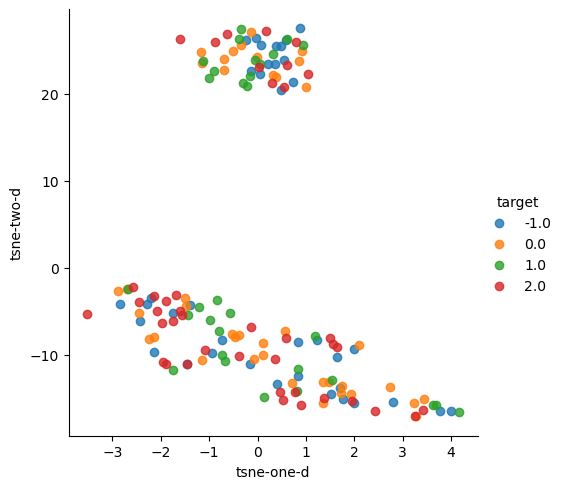

In [27]:
random_clusters_iris = perform_random_clustering(3, X_iris)
# X_iris_embedded_random = get_tsne(X_iris)

get_plot(X_iris_data_embedded, random_clusters_iris)

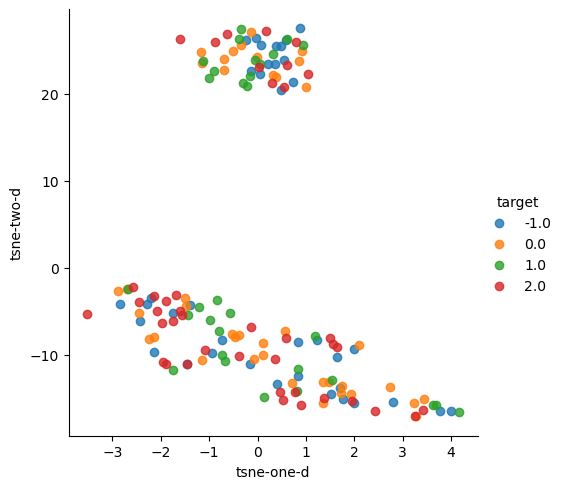

In [48]:
get_plot(X_iris_data_embedded, random_clusters_iris, save = True, path = "../../visualizations/Q2/random_data2.png")

In [28]:
print("Estimated Number of Clusters: ", len(np.unique(random_clusters_iris)))
print("Extrinsic Measures: ",extrinsic_scores(Y_iris, random_clusters_iris))
print("Intrinsic Measures: ",intrinsic_scores(X_iris, random_clusters_iris))

Estimated Number of Clusters:  4
Extrinsic Measures:  {'adjusted_rand_index': -0.008342734517809982, 'mutual_information': -0.008569133494379221}
Intrinsic Measures:  {'silhouette score': -0.07198698008525652, 'calinski_harabasz_index': 0.4022626881356364, 'DB index': 21.91105083213749}


DIGITS DATASET

In [29]:
digits_dataset = get_dataset("digits")
X_digits_data = digits_dataset.data
Y_digits_data = digits_dataset.target

In [30]:
X_digits_data_embedded = get_tsne(X_digits_data)

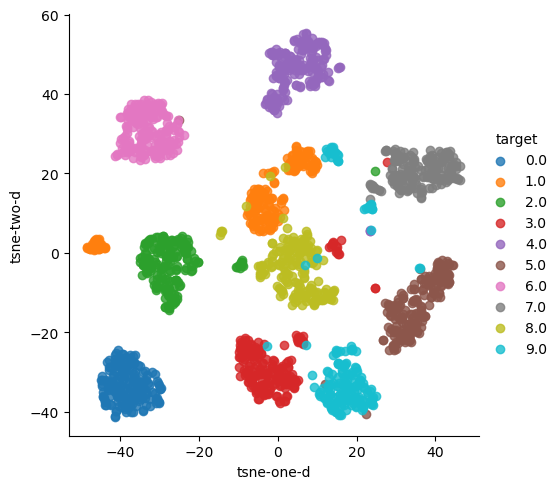

In [49]:
get_plot(X_digits_data_embedded, Y_digits_data, save = True, path = "../../visualizations/Q2/tsne_before_clustering_digits.png")

Min samples: 2, Min cluster size: 10


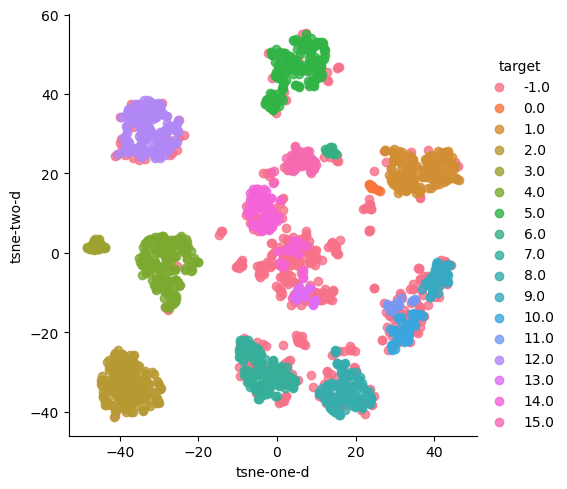

Estimated Number of Clusters:  17
Intrinsic Measures:  {'silhouette score': 0.1140485610785875, 'calinski_harabasz_index': 94.07950098652255, 'DB index': 2.023434730305764}
Extrinsic Measures:  {'adjusted_rand_index': 0.5877732404507605, 'mutual_information': 0.7727631235749681}
------------------------------------------------------------------
Min samples: 2, Min cluster size: 20


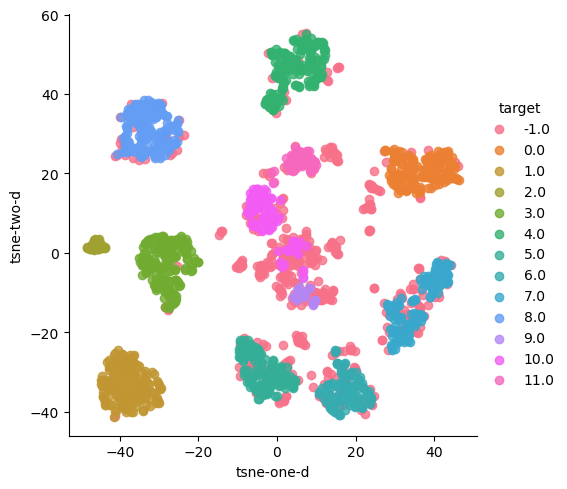

Estimated Number of Clusters:  13
Intrinsic Measures:  {'silhouette score': 0.12326131508892417, 'calinski_harabasz_index': 114.32346210242494, 'DB index': 2.1744975098694352}
Extrinsic Measures:  {'adjusted_rand_index': 0.6118282181395012, 'mutual_information': 0.7872551454485914}
------------------------------------------------------------------
Min samples: 2, Min cluster size: 30


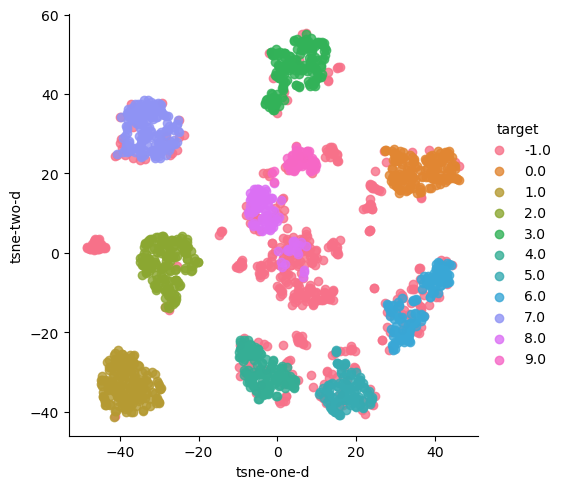

Estimated Number of Clusters:  11
Intrinsic Measures:  {'silhouette score': 0.13040046927804297, 'calinski_harabasz_index': 127.3924728905354, 'DB index': 2.1992396422653964}
Extrinsic Measures:  {'adjusted_rand_index': 0.5903209567287874, 'mutual_information': 0.7838342404846185}
------------------------------------------------------------------
Min samples: 3, Min cluster size: 10


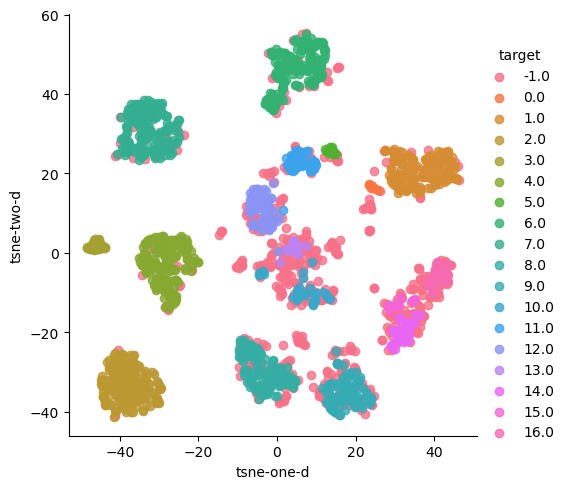

Estimated Number of Clusters:  18
Intrinsic Measures:  {'silhouette score': 0.0938566315808899, 'calinski_harabasz_index': 84.84784009753668, 'DB index': 2.0848453862529146}
Extrinsic Measures:  {'adjusted_rand_index': 0.5352202714663012, 'mutual_information': 0.755892433826647}
------------------------------------------------------------------
Min samples: 3, Min cluster size: 20


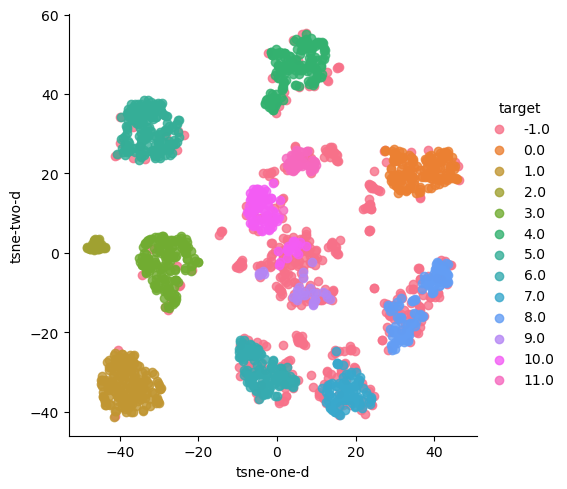

Estimated Number of Clusters:  13
Intrinsic Measures:  {'silhouette score': 0.12239746857337604, 'calinski_harabasz_index': 110.71853680938261, 'DB index': 2.275449879530142}
Extrinsic Measures:  {'adjusted_rand_index': 0.5634391921830944, 'mutual_information': 0.7681744206868605}
------------------------------------------------------------------
Min samples: 3, Min cluster size: 30


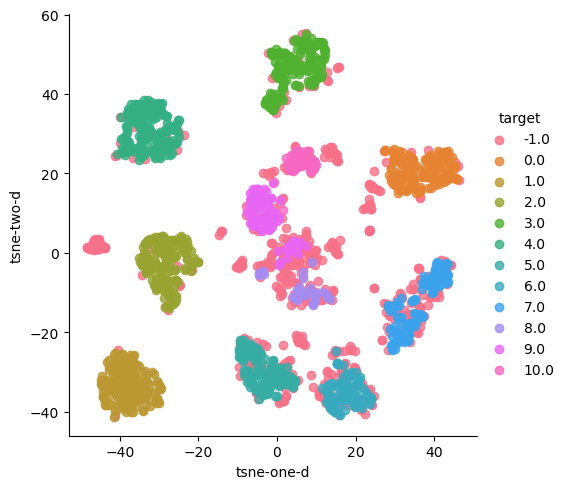

Estimated Number of Clusters:  12
Intrinsic Measures:  {'silhouette score': 0.11690662598246368, 'calinski_harabasz_index': 113.75295035738522, 'DB index': 2.353027851972453}
Extrinsic Measures:  {'adjusted_rand_index': 0.5438577129824642, 'mutual_information': 0.7619043144014213}
------------------------------------------------------------------
Min samples: 4, Min cluster size: 10


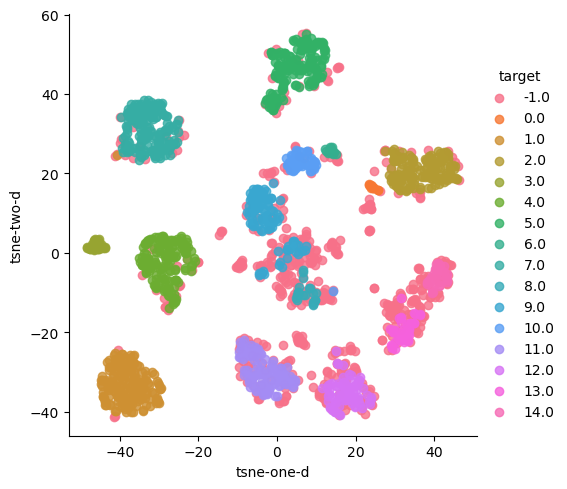

Estimated Number of Clusters:  16
Intrinsic Measures:  {'silhouette score': 0.10198254858510077, 'calinski_harabasz_index': 92.0748875751812, 'DB index': 2.0213955563499955}
Extrinsic Measures:  {'adjusted_rand_index': 0.4857936068373067, 'mutual_information': 0.7300693332542995}
------------------------------------------------------------------
Min samples: 4, Min cluster size: 20


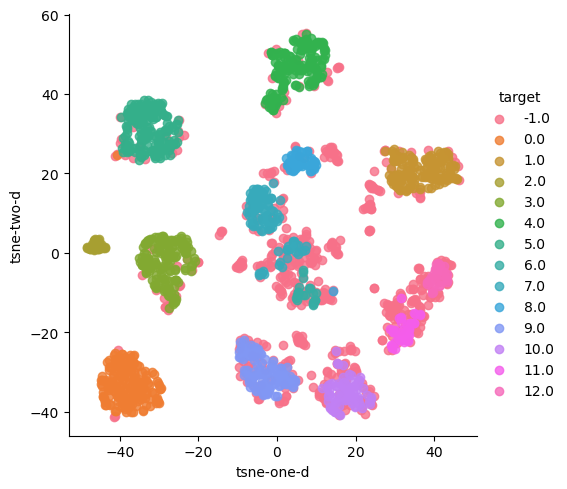

Estimated Number of Clusters:  14
Intrinsic Measures:  {'silhouette score': 0.10336241094633253, 'calinski_harabasz_index': 100.6143791534015, 'DB index': 2.1019544196061157}
Extrinsic Measures:  {'adjusted_rand_index': 0.47201313348241597, 'mutual_information': 0.7272684897791717}
------------------------------------------------------------------
Min samples: 4, Min cluster size: 30


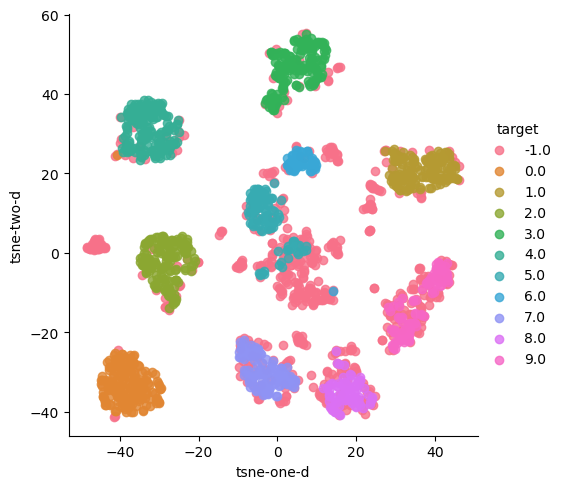

Estimated Number of Clusters:  11
Intrinsic Measures:  {'silhouette score': 0.11010940615551819, 'calinski_harabasz_index': 117.36655871451647, 'DB index': 2.205874922300158}
Extrinsic Measures:  {'adjusted_rand_index': 0.46812750011662857, 'mutual_information': 0.730964121125769}
------------------------------------------------------------------
Min samples: 5, Min cluster size: 10


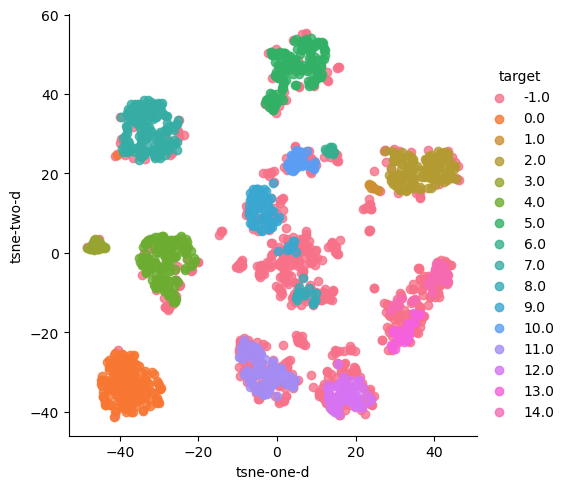

Estimated Number of Clusters:  16
Intrinsic Measures:  {'silhouette score': 0.0784974148137346, 'calinski_harabasz_index': 84.01718629448878, 'DB index': 1.9666630339969826}
Extrinsic Measures:  {'adjusted_rand_index': 0.4198695982840747, 'mutual_information': 0.7077342962526184}
------------------------------------------------------------------
Min samples: 5, Min cluster size: 20


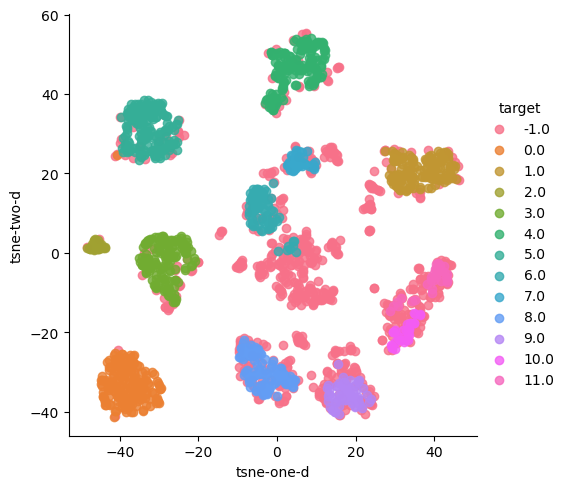

Estimated Number of Clusters:  13
Intrinsic Measures:  {'silhouette score': 0.08789721271308501, 'calinski_harabasz_index': 98.19312517163034, 'DB index': 1.9799605810042982}
Extrinsic Measures:  {'adjusted_rand_index': 0.40628575228511027, 'mutual_information': 0.7064120875369546}
------------------------------------------------------------------
Min samples: 5, Min cluster size: 30


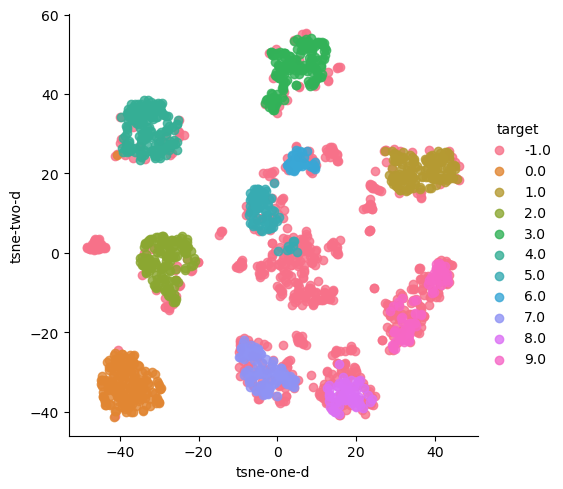

Estimated Number of Clusters:  11
Intrinsic Measures:  {'silhouette score': 0.08817449566407348, 'calinski_harabasz_index': 108.45902012829616, 'DB index': 2.143897660698575}
Extrinsic Measures:  {'adjusted_rand_index': 0.4015110495194745, 'mutual_information': 0.7082806885226546}
------------------------------------------------------------------
Min samples: 6, Min cluster size: 10


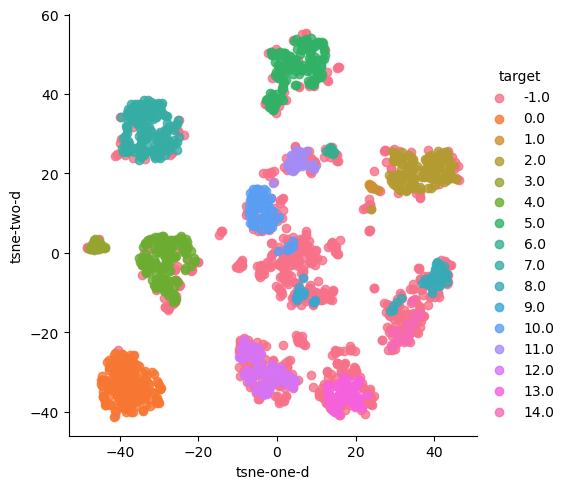

Estimated Number of Clusters:  16
Intrinsic Measures:  {'silhouette score': 0.07053949133103707, 'calinski_harabasz_index': 81.72610463734166, 'DB index': 1.9224824562329974}
Extrinsic Measures:  {'adjusted_rand_index': 0.3884574564295316, 'mutual_information': 0.6940440136077966}
------------------------------------------------------------------
Min samples: 6, Min cluster size: 20


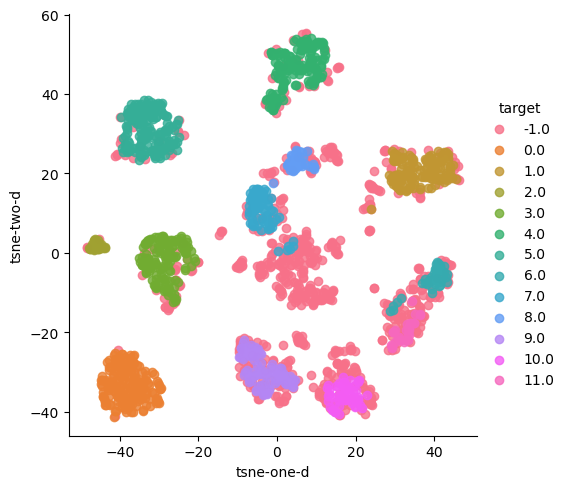

Estimated Number of Clusters:  13
Intrinsic Measures:  {'silhouette score': 0.08290455152077832, 'calinski_harabasz_index': 96.47220987305353, 'DB index': 1.966637223890987}
Extrinsic Measures:  {'adjusted_rand_index': 0.378375624327491, 'mutual_information': 0.6936439172916912}
------------------------------------------------------------------
Min samples: 6, Min cluster size: 30


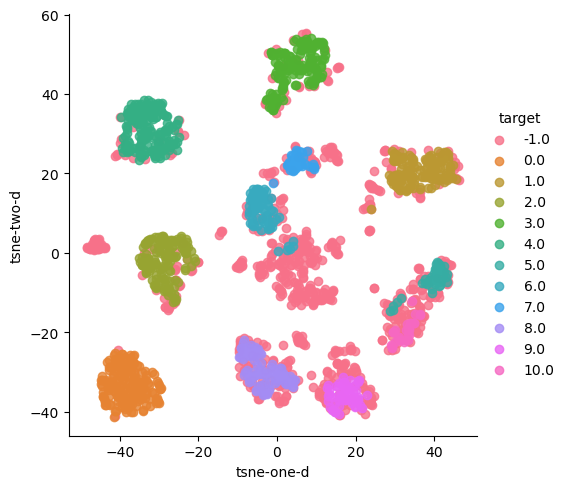

Estimated Number of Clusters:  12
Intrinsic Measures:  {'silhouette score': 0.0778765543948421, 'calinski_harabasz_index': 99.3395707309393, 'DB index': 2.0195182257857307}
Extrinsic Measures:  {'adjusted_rand_index': 0.36451628624704546, 'mutual_information': 0.6884801433492628}
------------------------------------------------------------------
Min samples: 7, Min cluster size: 10


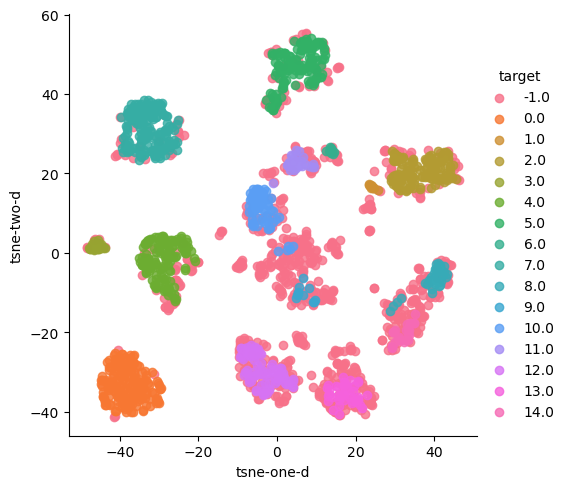

Estimated Number of Clusters:  16
Intrinsic Measures:  {'silhouette score': 0.047048864883206656, 'calinski_harabasz_index': 74.38891860815993, 'DB index': 1.9019131420418076}
Extrinsic Measures:  {'adjusted_rand_index': 0.32453937510150227, 'mutual_information': 0.6603130257729377}
------------------------------------------------------------------
Min samples: 7, Min cluster size: 20


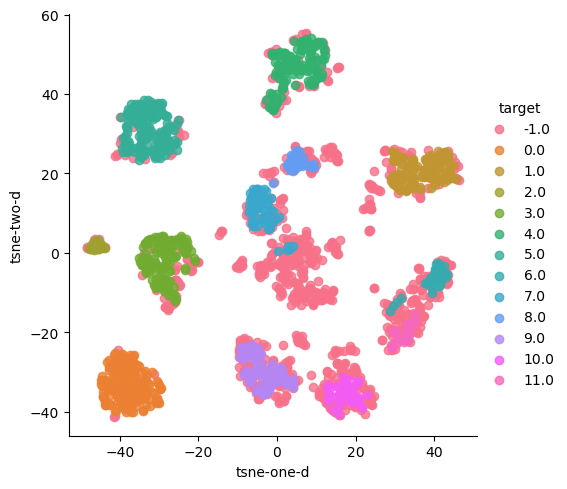

Estimated Number of Clusters:  13
Intrinsic Measures:  {'silhouette score': 0.05893986526622704, 'calinski_harabasz_index': 87.79561335829553, 'DB index': 1.9300972409596326}
Extrinsic Measures:  {'adjusted_rand_index': 0.3161484746282449, 'mutual_information': 0.6594006555273391}
------------------------------------------------------------------
Min samples: 7, Min cluster size: 30


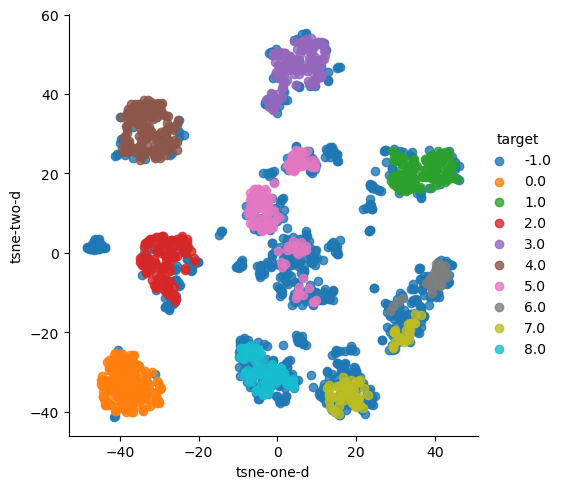

Estimated Number of Clusters:  10
Intrinsic Measures:  {'silhouette score': 0.07167002835338274, 'calinski_harabasz_index': 102.19417926377757, 'DB index': 2.2925865817387727}
Extrinsic Measures:  {'adjusted_rand_index': 0.3292394961837304, 'mutual_information': 0.655085910165654}
------------------------------------------------------------------
Min samples: 8, Min cluster size: 10


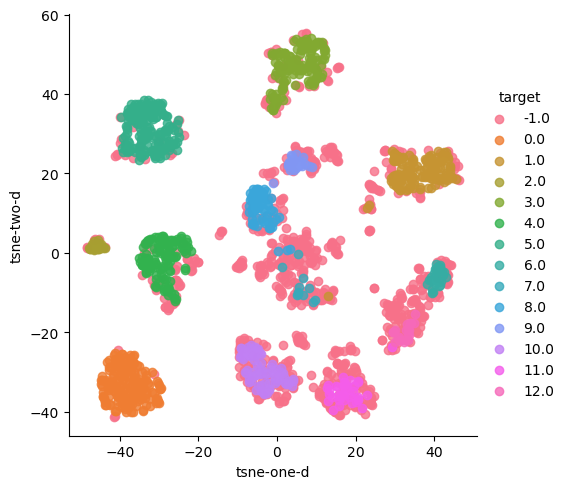

Estimated Number of Clusters:  14
Intrinsic Measures:  {'silhouette score': 0.039325561976858464, 'calinski_harabasz_index': 79.22327492728505, 'DB index': 1.9764795919412455}
Extrinsic Measures:  {'adjusted_rand_index': 0.3022232933589071, 'mutual_information': 0.6477669258480585}
------------------------------------------------------------------
Min samples: 8, Min cluster size: 20


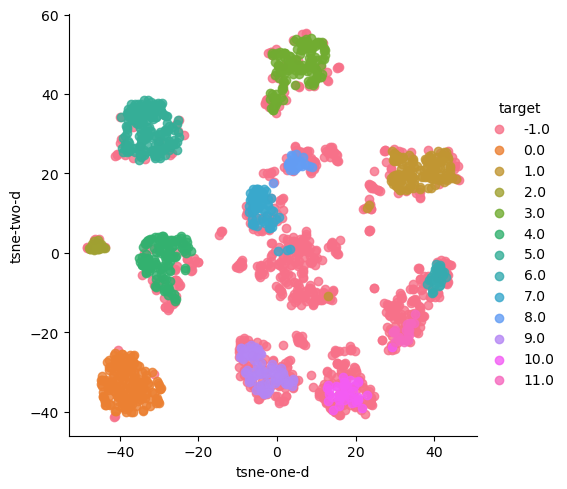

Estimated Number of Clusters:  13
Intrinsic Measures:  {'silhouette score': 0.04934306549577181, 'calinski_harabasz_index': 85.13758298289352, 'DB index': 1.9070828583099992}
Extrinsic Measures:  {'adjusted_rand_index': 0.3016687538052318, 'mutual_information': 0.6487029956237235}
------------------------------------------------------------------
Min samples: 8, Min cluster size: 30


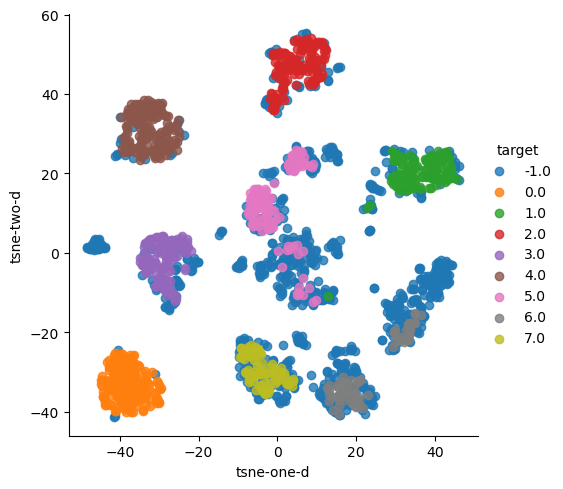

Estimated Number of Clusters:  9
Intrinsic Measures:  {'silhouette score': 0.06905144808199108, 'calinski_harabasz_index': 106.69227109997581, 'DB index': 2.2805617639633193}
Extrinsic Measures:  {'adjusted_rand_index': 0.3053727836643652, 'mutual_information': 0.6420170218536366}
------------------------------------------------------------------
Min samples: 9, Min cluster size: 10


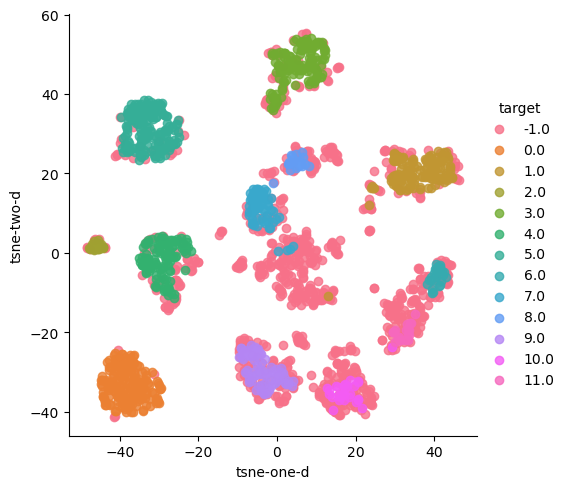

Estimated Number of Clusters:  13
Intrinsic Measures:  {'silhouette score': 0.03916834548679611, 'calinski_harabasz_index': 81.64845085982043, 'DB index': 1.8931433684486672}
Extrinsic Measures:  {'adjusted_rand_index': 0.2819201943273181, 'mutual_information': 0.6359012363398854}
------------------------------------------------------------------
Min samples: 9, Min cluster size: 20


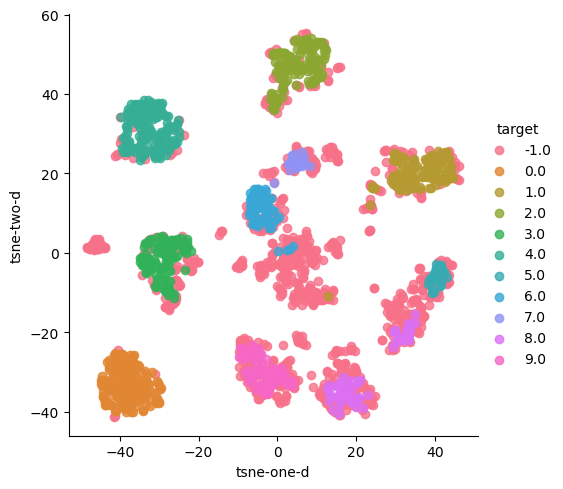

Estimated Number of Clusters:  11
Intrinsic Measures:  {'silhouette score': 0.05030149436932634, 'calinski_harabasz_index': 93.02450763881731, 'DB index': 2.0162121626614415}
Extrinsic Measures:  {'adjusted_rand_index': 0.27731268181568147, 'mutual_information': 0.6284929347012522}
------------------------------------------------------------------
Min samples: 9, Min cluster size: 30


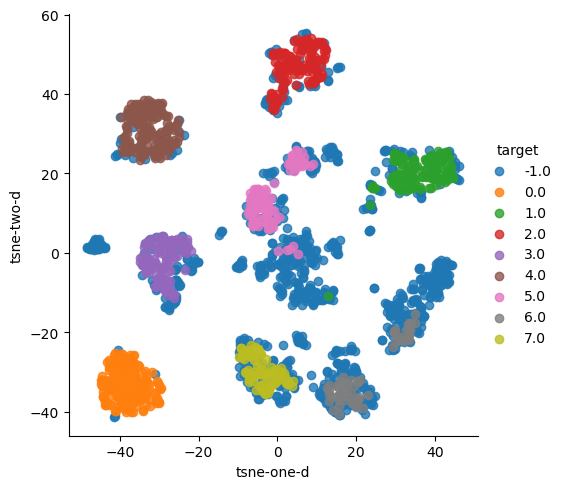

Estimated Number of Clusters:  9
Intrinsic Measures:  {'silhouette score': 0.06295275703540683, 'calinski_harabasz_index': 104.8795447906431, 'DB index': 2.1821657185465315}
Extrinsic Measures:  {'adjusted_rand_index': 0.2843566386569586, 'mutual_information': 0.6348345584872478}
------------------------------------------------------------------
Min samples: 10, Min cluster size: 10


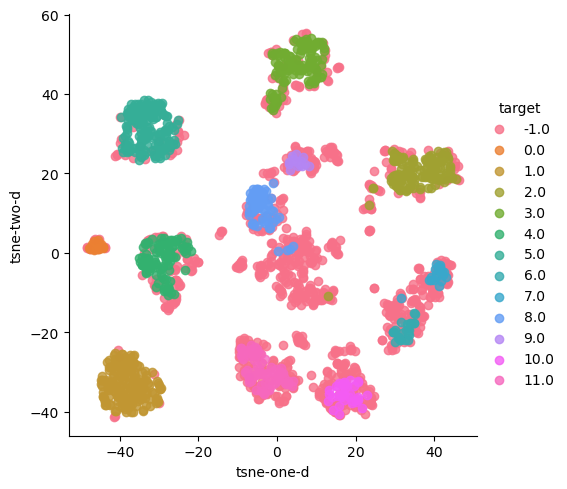

Estimated Number of Clusters:  13
Intrinsic Measures:  {'silhouette score': 0.0332962778393623, 'calinski_harabasz_index': 79.3532435143308, 'DB index': 1.8817041298646315}
Extrinsic Measures:  {'adjusted_rand_index': 0.25914964886103586, 'mutual_information': 0.6204675680400042}
------------------------------------------------------------------
Min samples: 10, Min cluster size: 20


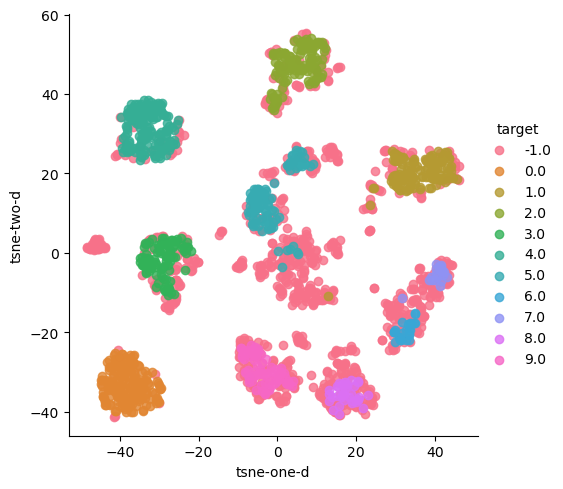

Estimated Number of Clusters:  11
Intrinsic Measures:  {'silhouette score': 0.0391332407552811, 'calinski_harabasz_index': 87.43730242291146, 'DB index': 2.0554704937959567}
Extrinsic Measures:  {'adjusted_rand_index': 0.2668441191730204, 'mutual_information': 0.6268354177757861}
------------------------------------------------------------------
Min samples: 10, Min cluster size: 30


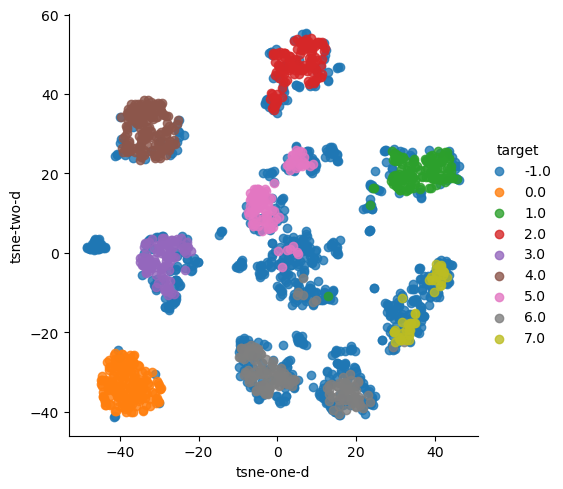

Estimated Number of Clusters:  9
Intrinsic Measures:  {'silhouette score': 0.07707276062420836, 'calinski_harabasz_index': 106.94873749315904, 'DB index': 2.266820871072496}
Extrinsic Measures:  {'adjusted_rand_index': 0.28353844416955826, 'mutual_information': 0.6202304914574698}
------------------------------------------------------------------
Min samples: 11, Min cluster size: 10


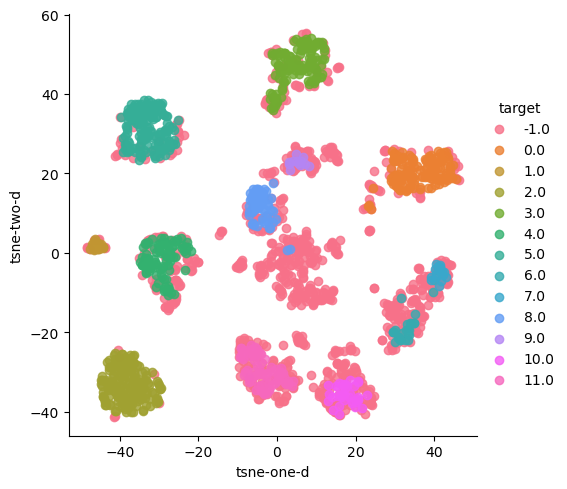

Estimated Number of Clusters:  13
Intrinsic Measures:  {'silhouette score': 0.02979605822547811, 'calinski_harabasz_index': 78.30104242802629, 'DB index': 1.877993066648426}
Extrinsic Measures:  {'adjusted_rand_index': 0.2571596378761411, 'mutual_information': 0.6194822773236037}
------------------------------------------------------------------
Min samples: 11, Min cluster size: 20


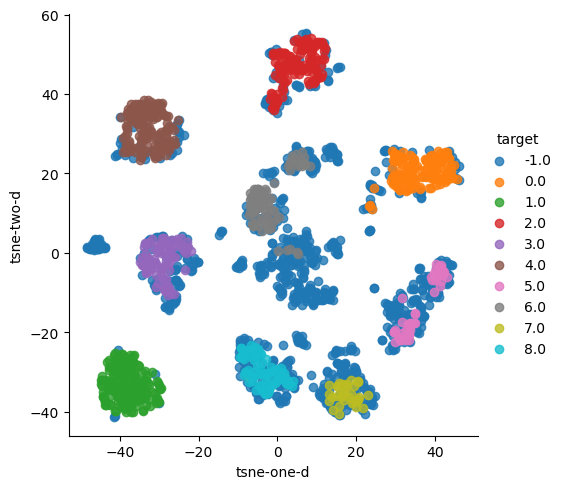

Estimated Number of Clusters:  10
Intrinsic Measures:  {'silhouette score': 0.045287821497496224, 'calinski_harabasz_index': 94.44503449028305, 'DB index': 2.145669924756784}
Extrinsic Measures:  {'adjusted_rand_index': 0.2625944781040745, 'mutual_information': 0.6266199488670751}
------------------------------------------------------------------
Min samples: 11, Min cluster size: 30


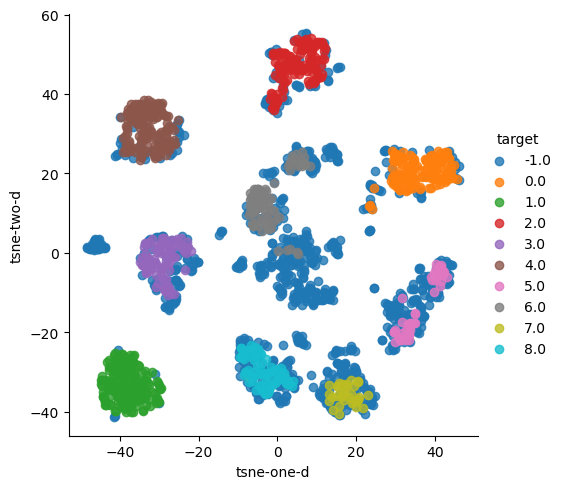

Estimated Number of Clusters:  10
Intrinsic Measures:  {'silhouette score': 0.045287821497496224, 'calinski_harabasz_index': 94.44503449028305, 'DB index': 2.145669924756784}
Extrinsic Measures:  {'adjusted_rand_index': 0.2625944781040745, 'mutual_information': 0.6266199488670751}
------------------------------------------------------------------
Min samples: 12, Min cluster size: 10


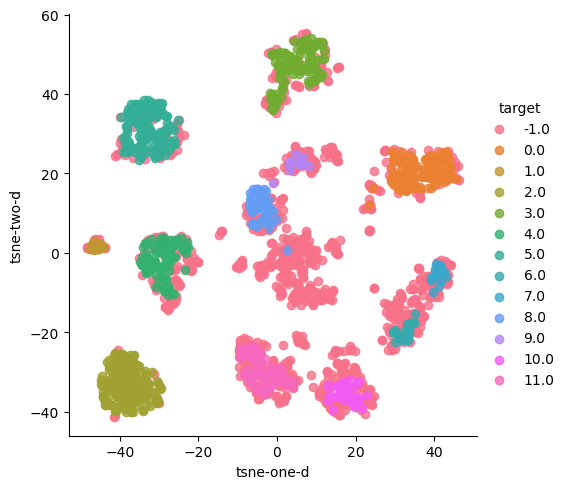

Estimated Number of Clusters:  13
Intrinsic Measures:  {'silhouette score': 0.02120911661730513, 'calinski_harabasz_index': 75.4462130113103, 'DB index': 1.85632710234357}
Extrinsic Measures:  {'adjusted_rand_index': 0.23851804600567722, 'mutual_information': 0.6082014389985112}
------------------------------------------------------------------
Min samples: 12, Min cluster size: 20


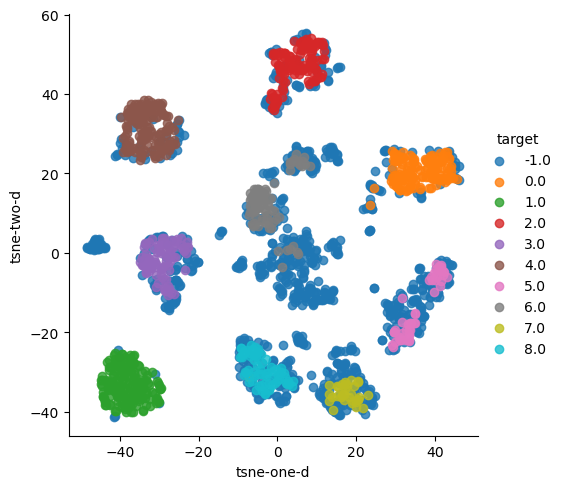

Estimated Number of Clusters:  10
Intrinsic Measures:  {'silhouette score': 0.03873497265216678, 'calinski_harabasz_index': 91.71539605830455, 'DB index': 2.1476041023156496}
Extrinsic Measures:  {'adjusted_rand_index': 0.24471531269314678, 'mutual_information': 0.6149209948192894}
------------------------------------------------------------------
Min samples: 12, Min cluster size: 30


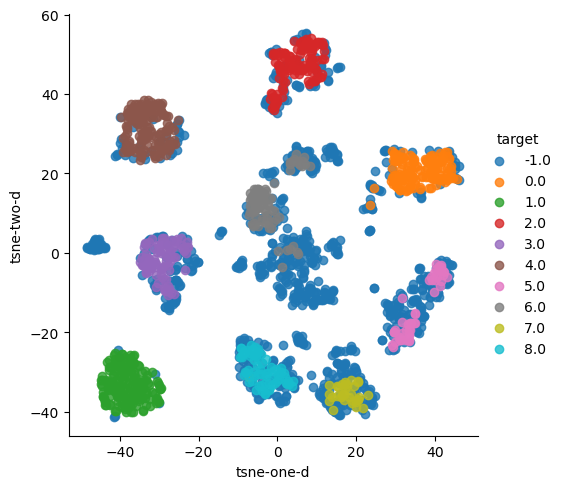

Estimated Number of Clusters:  10
Intrinsic Measures:  {'silhouette score': 0.03873497265216678, 'calinski_harabasz_index': 91.71539605830455, 'DB index': 2.1476041023156496}
Extrinsic Measures:  {'adjusted_rand_index': 0.24471531269314678, 'mutual_information': 0.6149209948192894}
------------------------------------------------------------------
Min samples: 13, Min cluster size: 10


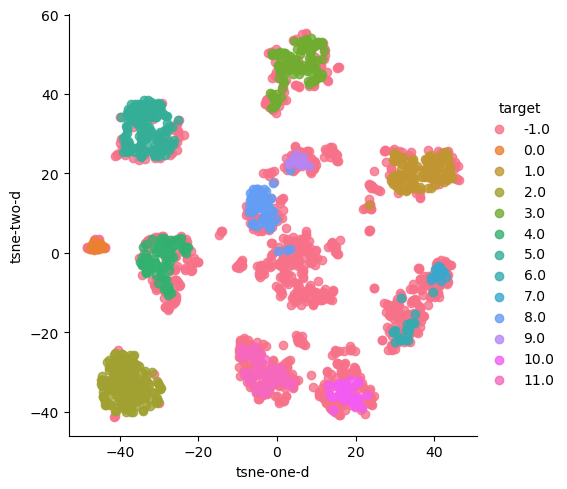

Estimated Number of Clusters:  13
Intrinsic Measures:  {'silhouette score': 0.011386897663044402, 'calinski_harabasz_index': 72.13383769588505, 'DB index': 1.8500242854426148}
Extrinsic Measures:  {'adjusted_rand_index': 0.21619254799333446, 'mutual_information': 0.5894750588270916}
------------------------------------------------------------------
Min samples: 13, Min cluster size: 20


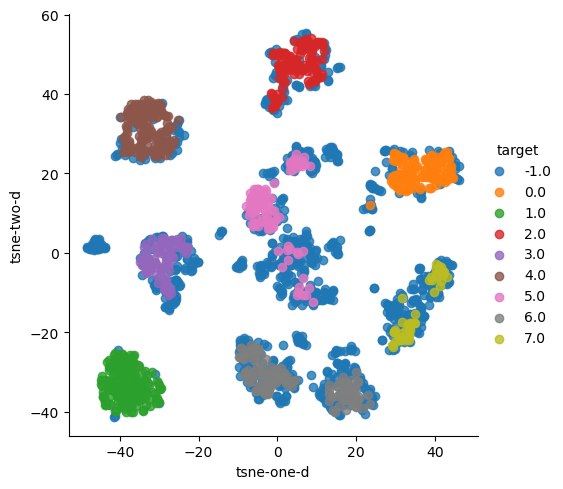

Estimated Number of Clusters:  9
Intrinsic Measures:  {'silhouette score': 0.05705904232104933, 'calinski_harabasz_index': 98.20712393737581, 'DB index': 2.2717924575605117}
Extrinsic Measures:  {'adjusted_rand_index': 0.23184598916350202, 'mutual_information': 0.5906023588206073}
------------------------------------------------------------------
Min samples: 13, Min cluster size: 30


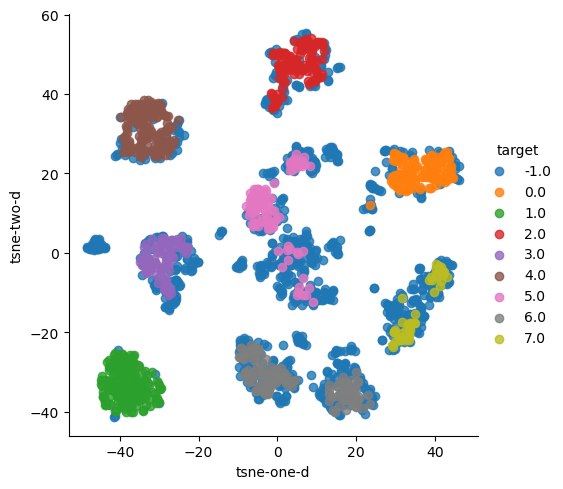

Estimated Number of Clusters:  9
Intrinsic Measures:  {'silhouette score': 0.05705904232104933, 'calinski_harabasz_index': 98.20712393737581, 'DB index': 2.2717924575605117}
Extrinsic Measures:  {'adjusted_rand_index': 0.23184598916350202, 'mutual_information': 0.5906023588206073}
------------------------------------------------------------------
Min samples: 14, Min cluster size: 10


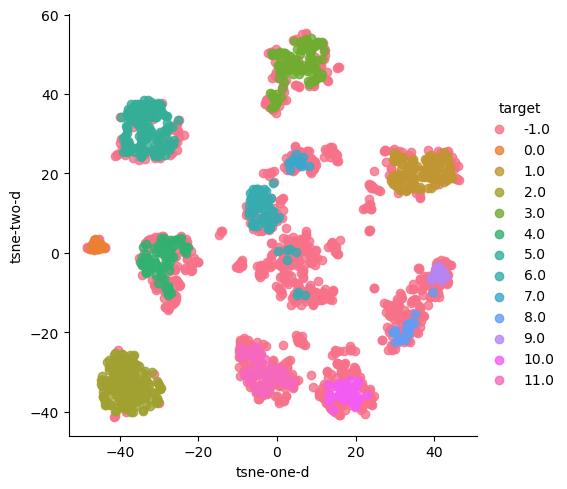

Estimated Number of Clusters:  13
Intrinsic Measures:  {'silhouette score': 0.011357380556468486, 'calinski_harabasz_index': 71.45191954541048, 'DB index': 1.8700519144564436}
Extrinsic Measures:  {'adjusted_rand_index': 0.2118878886036545, 'mutual_information': 0.5851392034876515}
------------------------------------------------------------------
Min samples: 14, Min cluster size: 20


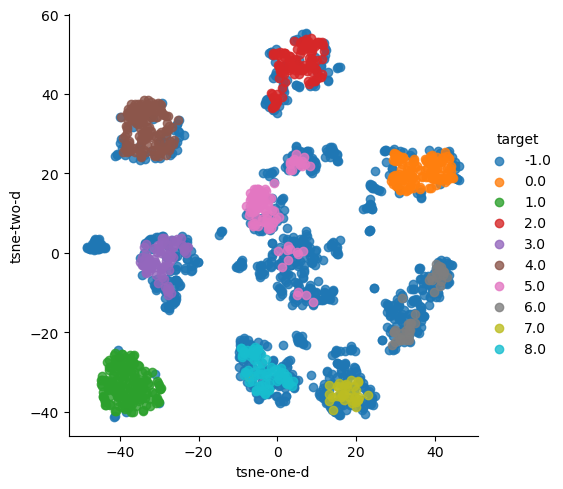

Estimated Number of Clusters:  10
Intrinsic Measures:  {'silhouette score': 0.02714532000998545, 'calinski_harabasz_index': 86.47859596282973, 'DB index': 2.1493142051965943}
Extrinsic Measures:  {'adjusted_rand_index': 0.21353329726349315, 'mutual_information': 0.5893031710132002}
------------------------------------------------------------------
Min samples: 14, Min cluster size: 30


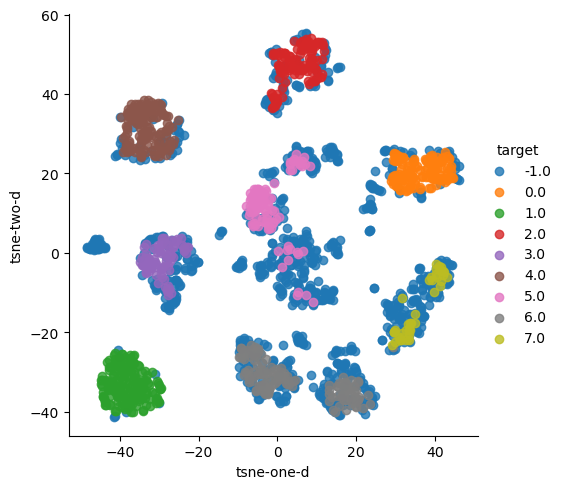

Estimated Number of Clusters:  9
Intrinsic Measures:  {'silhouette score': 0.05336994998462033, 'calinski_harabasz_index': 96.91208164178134, 'DB index': 2.2240978674461966}
Extrinsic Measures:  {'adjusted_rand_index': 0.2211615519323587, 'mutual_information': 0.5828457855986626}
------------------------------------------------------------------
Min samples: 15, Min cluster size: 10


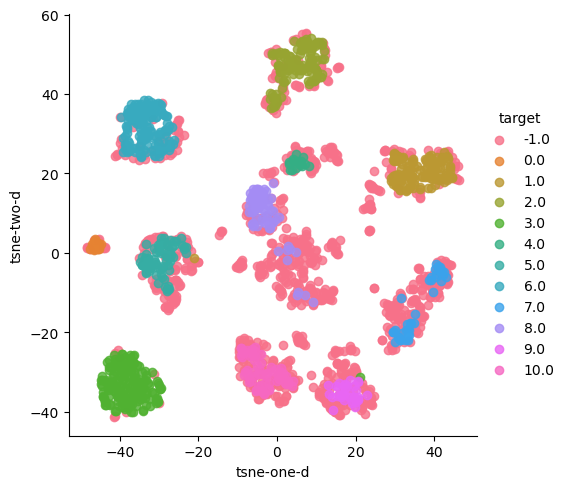

Estimated Number of Clusters:  12
Intrinsic Measures:  {'silhouette score': 0.02018811939629096, 'calinski_harabasz_index': 76.55099392929257, 'DB index': 1.983791724218815}
Extrinsic Measures:  {'adjusted_rand_index': 0.21178717671774286, 'mutual_information': 0.5847537118378583}
------------------------------------------------------------------
Min samples: 15, Min cluster size: 20


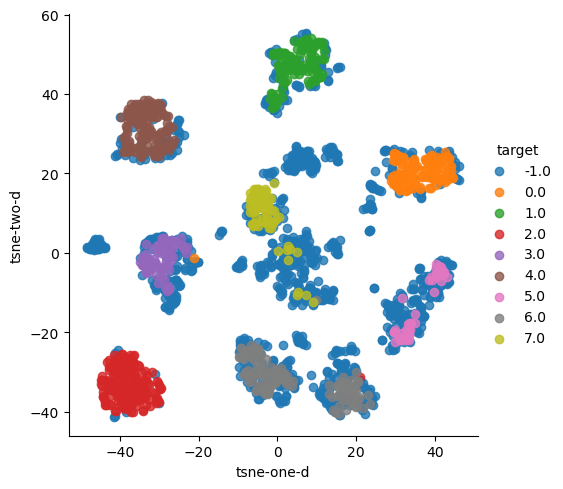

Estimated Number of Clusters:  9
Intrinsic Measures:  {'silhouette score': 0.04892932787224737, 'calinski_harabasz_index': 97.32607253154684, 'DB index': 2.1506576649590046}
Extrinsic Measures:  {'adjusted_rand_index': 0.2109737750629152, 'mutual_information': 0.5724583891150619}
------------------------------------------------------------------
Min samples: 15, Min cluster size: 30


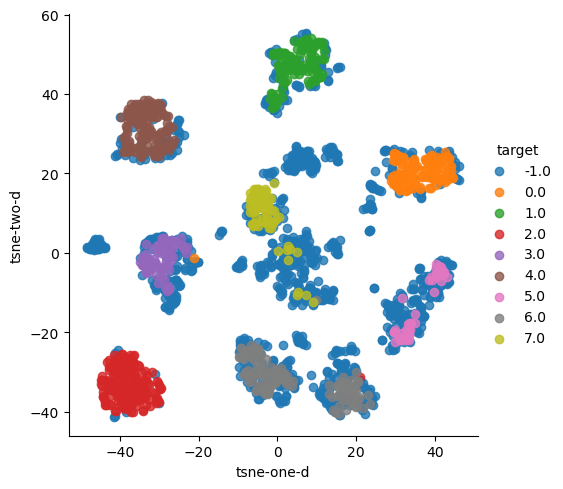

Estimated Number of Clusters:  9
Intrinsic Measures:  {'silhouette score': 0.04892932787224737, 'calinski_harabasz_index': 97.32607253154684, 'DB index': 2.1506576649590046}
Extrinsic Measures:  {'adjusted_rand_index': 0.2109737750629152, 'mutual_information': 0.5724583891150619}
------------------------------------------------------------------
Min samples: 16, Min cluster size: 10


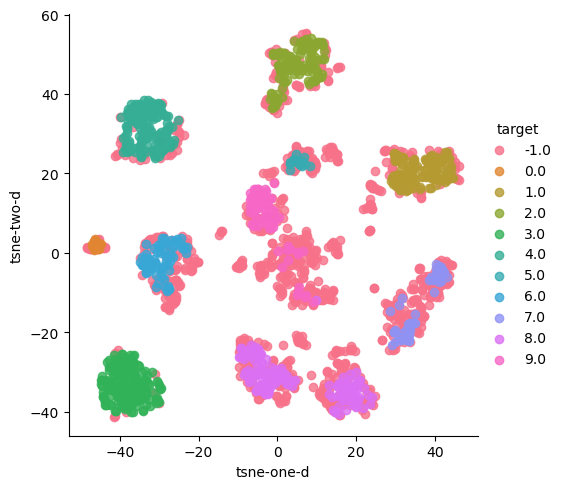

Estimated Number of Clusters:  11
Intrinsic Measures:  {'silhouette score': 0.049692955323691376, 'calinski_harabasz_index': 85.11396495389361, 'DB index': 2.051869209683687}
Extrinsic Measures:  {'adjusted_rand_index': 0.2283367342813716, 'mutual_information': 0.5851107128166382}
------------------------------------------------------------------
Min samples: 16, Min cluster size: 20


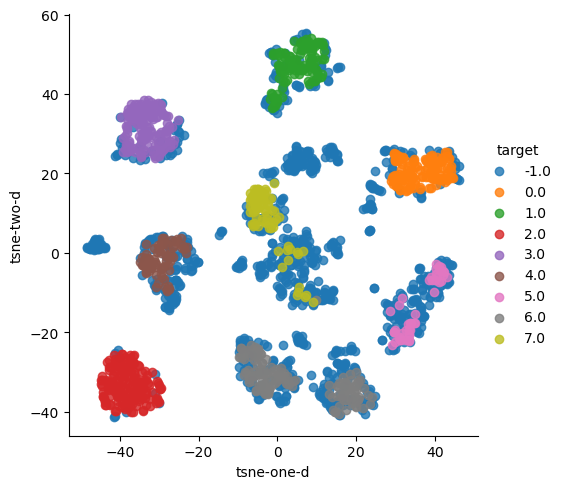

Estimated Number of Clusters:  9
Intrinsic Measures:  {'silhouette score': 0.054672834173335454, 'calinski_harabasz_index': 99.1133328799983, 'DB index': 2.178435533618985}
Extrinsic Measures:  {'adjusted_rand_index': 0.22030795418337357, 'mutual_information': 0.5808628539718212}
------------------------------------------------------------------
Min samples: 16, Min cluster size: 30


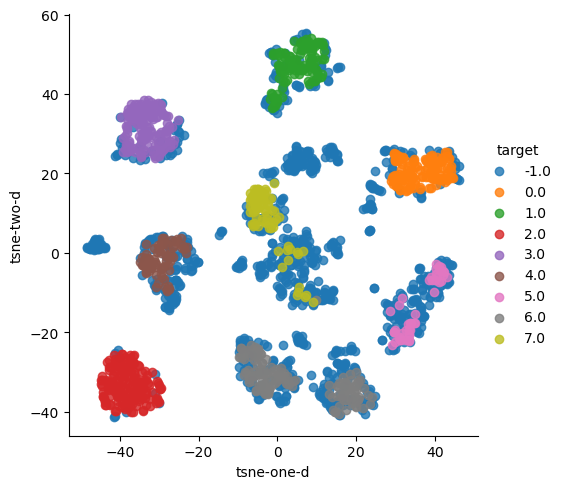

Estimated Number of Clusters:  9
Intrinsic Measures:  {'silhouette score': 0.054672834173335454, 'calinski_harabasz_index': 99.1133328799983, 'DB index': 2.178435533618985}
Extrinsic Measures:  {'adjusted_rand_index': 0.22030795418337357, 'mutual_information': 0.5808628539718212}
------------------------------------------------------------------
Min samples: 17, Min cluster size: 10


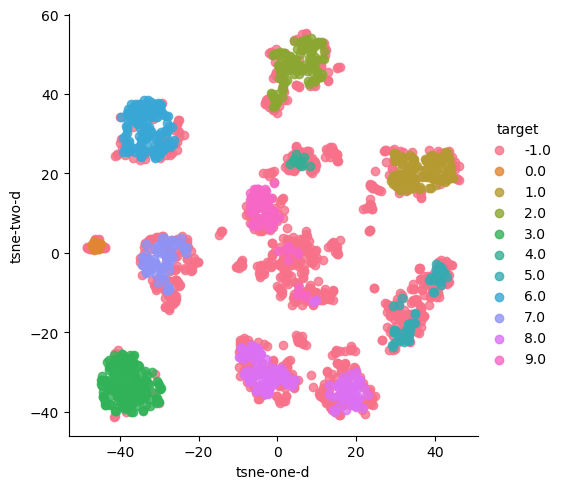

Estimated Number of Clusters:  11
Intrinsic Measures:  {'silhouette score': 0.04554697942893066, 'calinski_harabasz_index': 83.43708962340406, 'DB index': 2.0287051290908313}
Extrinsic Measures:  {'adjusted_rand_index': 0.21721941831442151, 'mutual_information': 0.5772001642222173}
------------------------------------------------------------------
Min samples: 17, Min cluster size: 20


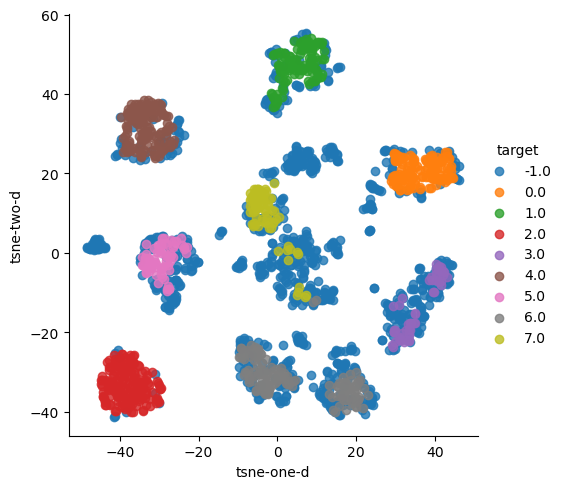

Estimated Number of Clusters:  9
Intrinsic Measures:  {'silhouette score': 0.05225228477476305, 'calinski_harabasz_index': 97.84469880735492, 'DB index': 2.1622151049145266}
Extrinsic Measures:  {'adjusted_rand_index': 0.21084104208068896, 'mutual_information': 0.5740024135444506}
------------------------------------------------------------------
Min samples: 17, Min cluster size: 30


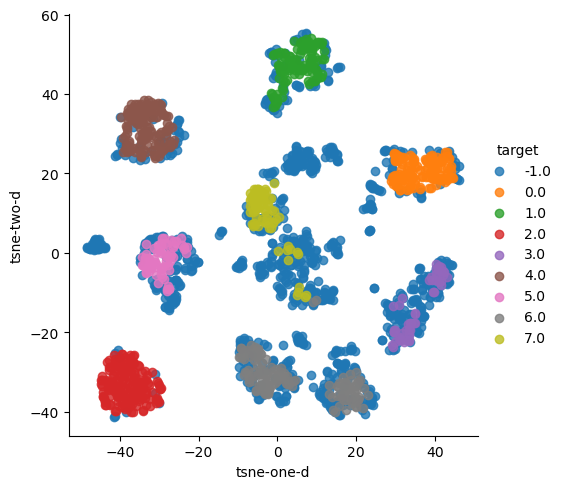

Estimated Number of Clusters:  9
Intrinsic Measures:  {'silhouette score': 0.05225228477476305, 'calinski_harabasz_index': 97.84469880735492, 'DB index': 2.1622151049145266}
Extrinsic Measures:  {'adjusted_rand_index': 0.21084104208068896, 'mutual_information': 0.5740024135444506}
------------------------------------------------------------------
Min samples: 18, Min cluster size: 10


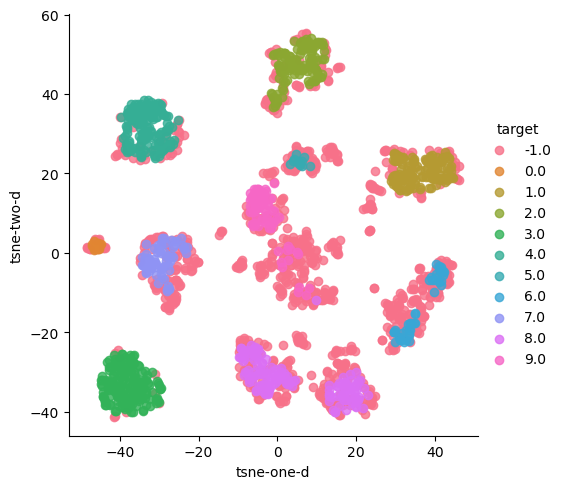

Estimated Number of Clusters:  11
Intrinsic Measures:  {'silhouette score': 0.04506354501260693, 'calinski_harabasz_index': 83.78050737273404, 'DB index': 2.0170365859927135}
Extrinsic Measures:  {'adjusted_rand_index': 0.2199976046953678, 'mutual_information': 0.5785665372124078}
------------------------------------------------------------------
Min samples: 18, Min cluster size: 20


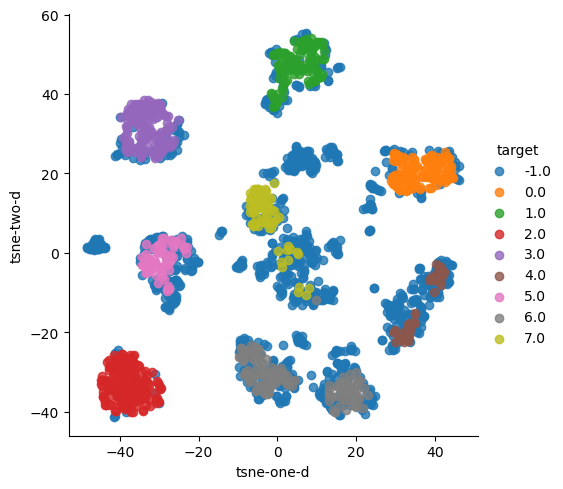

Estimated Number of Clusters:  9
Intrinsic Measures:  {'silhouette score': 0.0515807588352785, 'calinski_harabasz_index': 98.2339876480005, 'DB index': 2.1496409525992615}
Extrinsic Measures:  {'adjusted_rand_index': 0.2135157830273216, 'mutual_information': 0.5753714726756094}
------------------------------------------------------------------
Min samples: 18, Min cluster size: 30


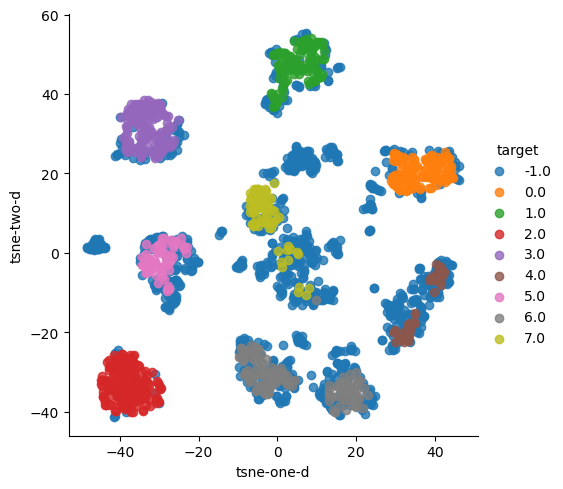

Estimated Number of Clusters:  9
Intrinsic Measures:  {'silhouette score': 0.0515807588352785, 'calinski_harabasz_index': 98.2339876480005, 'DB index': 2.1496409525992615}
Extrinsic Measures:  {'adjusted_rand_index': 0.2135157830273216, 'mutual_information': 0.5753714726756094}
------------------------------------------------------------------
Min samples: 19, Min cluster size: 10


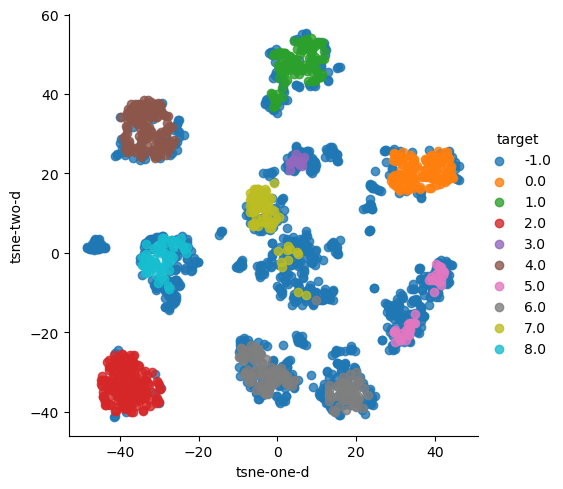

Estimated Number of Clusters:  10
Intrinsic Measures:  {'silhouette score': 0.040106174646567856, 'calinski_harabasz_index': 88.37565312085401, 'DB index': 2.0740256043310277}
Extrinsic Measures:  {'adjusted_rand_index': 0.2086926510513018, 'mutual_information': 0.5707544484757067}
------------------------------------------------------------------
Min samples: 19, Min cluster size: 20


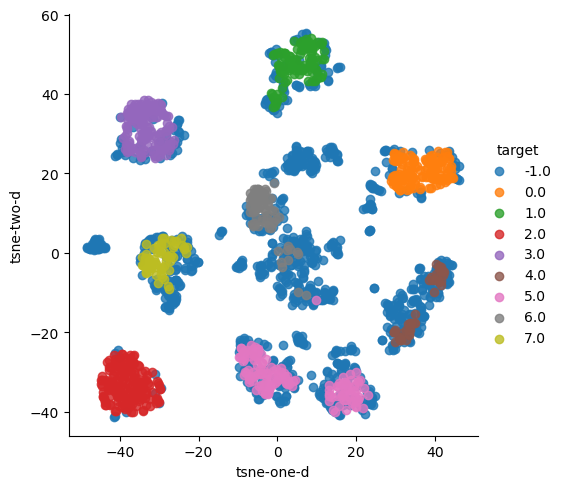

Estimated Number of Clusters:  9
Intrinsic Measures:  {'silhouette score': 0.0471550469677131, 'calinski_harabasz_index': 96.46176381012359, 'DB index': 2.135135810242166}
Extrinsic Measures:  {'adjusted_rand_index': 0.20565485976818748, 'mutual_information': 0.5690988345603579}
------------------------------------------------------------------
Min samples: 19, Min cluster size: 30


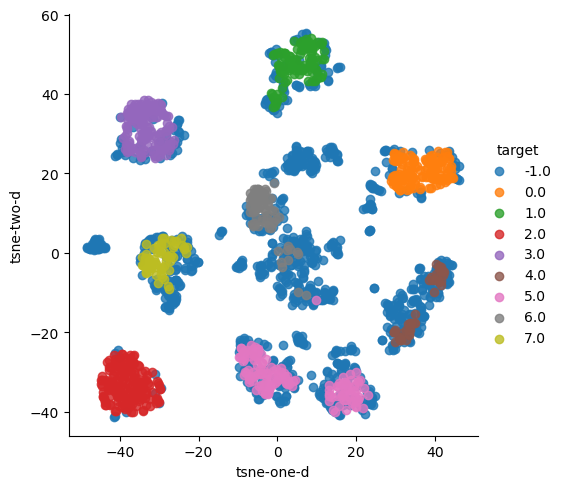

Estimated Number of Clusters:  9
Intrinsic Measures:  {'silhouette score': 0.0471550469677131, 'calinski_harabasz_index': 96.46176381012359, 'DB index': 2.135135810242166}
Extrinsic Measures:  {'adjusted_rand_index': 0.20565485976818748, 'mutual_information': 0.5690988345603579}
------------------------------------------------------------------
Min samples: 20, Min cluster size: 10


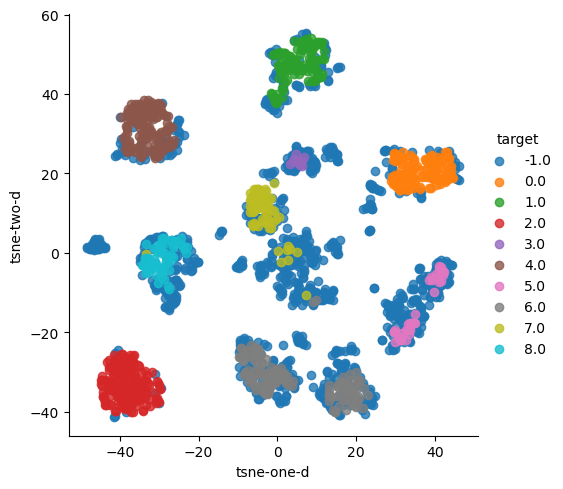

Estimated Number of Clusters:  10
Intrinsic Measures:  {'silhouette score': 0.03616533922573634, 'calinski_harabasz_index': 87.14954293213613, 'DB index': 2.0572990132821096}
Extrinsic Measures:  {'adjusted_rand_index': 0.20287378539079304, 'mutual_information': 0.5640875372809642}
------------------------------------------------------------------
Min samples: 20, Min cluster size: 20


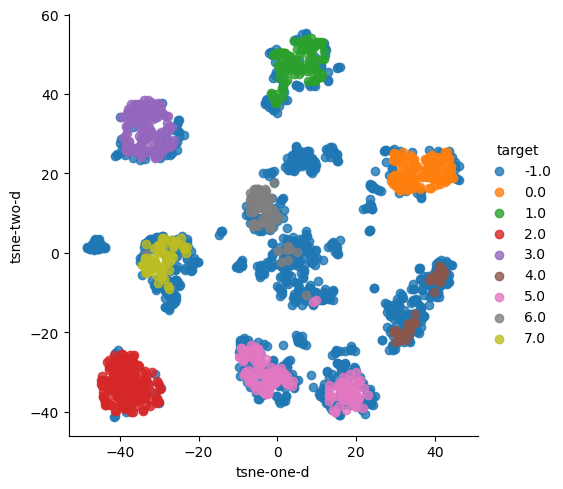

Estimated Number of Clusters:  9
Intrinsic Measures:  {'silhouette score': 0.0441583310573765, 'calinski_harabasz_index': 95.36791841296895, 'DB index': 2.125018631628631}
Extrinsic Measures:  {'adjusted_rand_index': 0.2004851194728152, 'mutual_information': 0.5629372481188027}
------------------------------------------------------------------
Min samples: 20, Min cluster size: 30


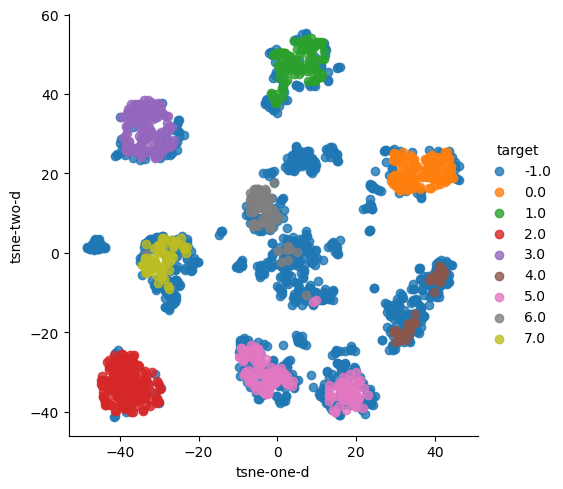

Estimated Number of Clusters:  9
Intrinsic Measures:  {'silhouette score': 0.0441583310573765, 'calinski_harabasz_index': 95.36791841296895, 'DB index': 2.125018631628631}
Extrinsic Measures:  {'adjusted_rand_index': 0.2004851194728152, 'mutual_information': 0.5629372481188027}
------------------------------------------------------------------


In [32]:
silhouette_score_list_digits = []
harabasz_list_digits = []
DB_list_digits = []
rand_index_list_digits = []
mutual_information_list_digits = []
min_samples = range(2,21)
min_cluster_size = [10,20,30]
for min_sampl in min_samples:
    for clust_size in min_cluster_size:
        clusterer = hdbscan.HDBSCAN(min_samples = min_sampl, min_cluster_size = clust_size)
        clusterer.fit(X_digits_data)
        cluster_labels_digits = clusterer.labels_
        # print(np.unique(cluster_labels_credit))

        print("Min samples: " + str(min_sampl) + ", Min cluster size: " + str(clust_size))
        if(len(np.unique(cluster_labels_digits)) == 1):
            print("Bad Case")
            continue
        get_plot(X_digits_data_embedded, cluster_labels_digits)
        intrin = intrinsic_scores(X_digits_data, cluster_labels_digits)
        extrin = extrinsic_scores(Y_digits_data, cluster_labels_digits)
        print("Estimated Number of Clusters: ", len(np.unique(cluster_labels_digits)))
        print("Intrinsic Measures: ",intrin)
        print("Extrinsic Measures: ",extrin)
                
        silhouette_score_list_digits.append(intrin['silhouette score'])
        harabasz_list_digits.append(intrin['calinski_harabasz_index'])
        DB_list_digits.append(intrin['DB index'])
        rand_index_list_digits.append(extrin['adjusted_rand_index'])
        mutual_information_list_digits.append(extrin['mutual_information'])
        print("------------------------------------------------------------------")

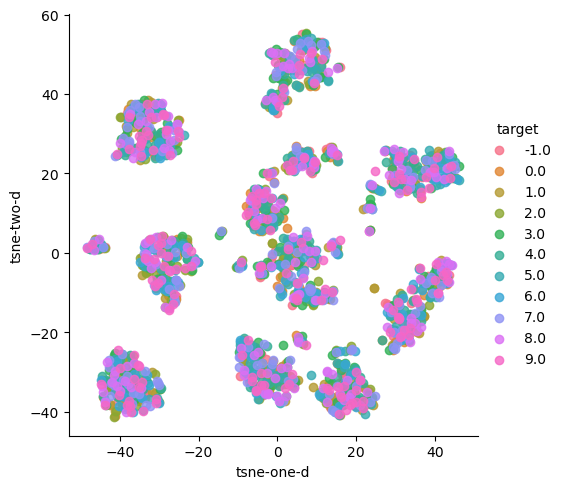

In [33]:
random_clusters_digits = perform_random_clustering(10, X_digits_data)
# X_digits_embedded_random = get_tsne(X_digits_data)

get_plot(X_digits_data_embedded, random_clusters_digits)

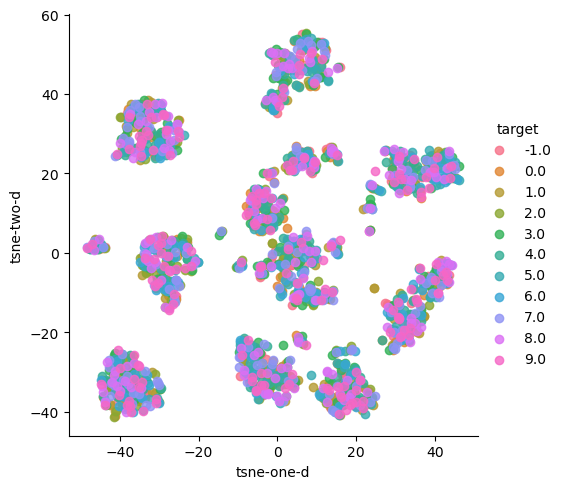

In [50]:
get_plot(X_digits_data_embedded, random_clusters_digits, save = True, path = "../../visualizations/Q2/random_data3.png")

In [34]:
print("Estimated Number of Clusters: ", len(np.unique(random_clusters_digits)))
print("Extrinsic Measures: ",extrinsic_scores(Y_digits_data, random_clusters_digits))
print("Intrinsic Measures: ",intrinsic_scores(X_digits_data, random_clusters_digits))

Estimated Number of Clusters:  11
Extrinsic Measures:  {'adjusted_rand_index': -0.0006932201966487469, 'mutual_information': -0.0012975237684628759}
Intrinsic Measures:  {'silhouette score': -0.01825689730508569, 'calinski_harabasz_index': 0.9593657759762586, 'DB index': 23.048146285540945}


SAVE RESULTS

In [51]:
clusterer_data1 = hdbscan.HDBSCAN(min_samples = 5, min_cluster_size = 30)
clusterer_data1.fit(X_credit_data)
cluster_labels_data1 = clusterer_data1.labels_

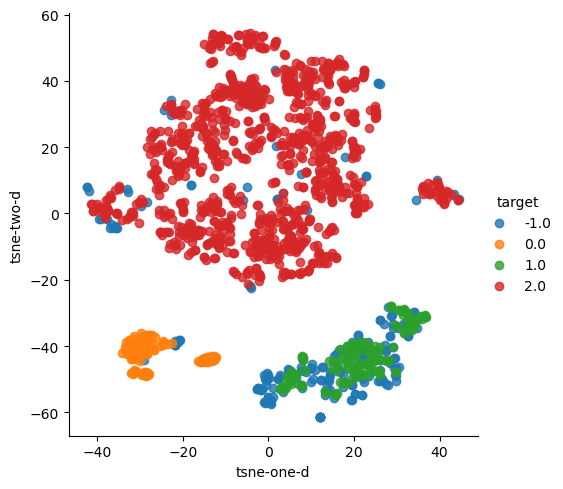

In [54]:
get_plot(X_credit_data_embedded, cluster_labels_data1, save = True, path = "../../visualizations/Q2/best_results_data1.png")

In [53]:
clusterer_data2 = hdbscan.HDBSCAN(min_samples = 2, min_cluster_size = 20)
clusterer_data2.fit(X_iris)
cluster_labels_data2 = clusterer_data2.labels_

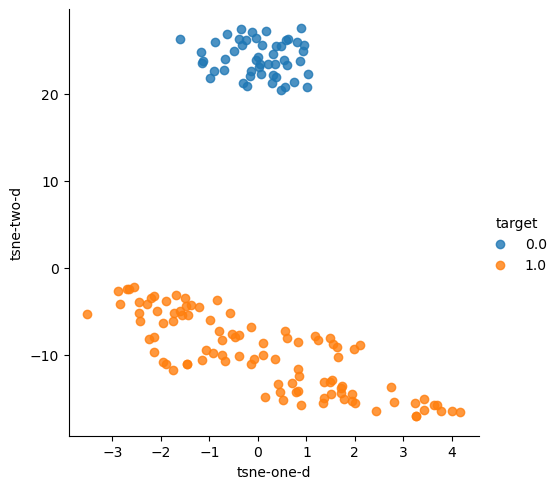

In [55]:
get_plot(X_iris_data_embedded, cluster_labels_data2, save = True, path = "../../visualizations/Q2/best_results_data2.png")

In [56]:
clusterer_data3 = hdbscan.HDBSCAN(min_samples = 2, min_cluster_size = 30)
clusterer_data3.fit(X_digits_data)
cluster_labels_data3 = clusterer_data3.labels_

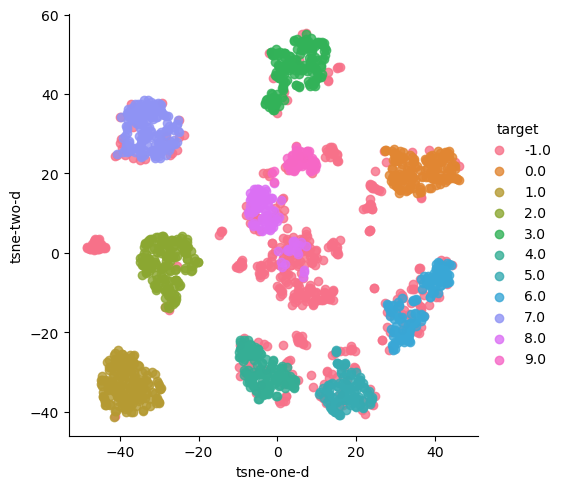

In [57]:
get_plot(X_digits_data_embedded, cluster_labels_data3, save = True, path = "../../visualizations/Q2/best_results_data3.png")